<a href="https://colab.research.google.com/github/ldt9/Portfolio-Tearsheet-Return-Generator/blob/main/Portfolio_Tear_Sheet_Generator_with_Sector_Performace.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Portfolio-Tearsheet-Return-Generator
## Overview
This program creates a brief, two-page document for an investor to summarize the historical outcome of the investor's portfolio transactions over the selected time period.

## Goals of this Project
1. Allow investors to input their tranaction data via a .csv file
2. Handle time-series transactions based on First-In-First-Out (FIFO) Logic
3. Utilize the QuantStats library to display portfolio statistics against a benchmark
4. Print the statistics output to a .pdf for simpler sharing

## Function Explanations

#### `` def create_market_cal(start, end) ``
- Uses the pandas_market_calendars library to find all relevant trading days within a specified timeframe
- Automatically filters out non-trading days based on the market
- Sets NYSE as the calendar, and then standardizes the timestamps to make them easy to join on later

#### `` def read_csv(folder, csv_name) ``
- Takes a folder name and filename for where the .csv if located and creates a dataframe out of it

#### `` def get_data(stocks, start, end) ``
- Takes an array of stock tickers with a start and end date and grabs the data using the YFinance library

#### `` def position_adjust(daily_positions, sale) ``
- Create an empty dataframe called stocks_with_sales to which we'll add adjusted positions, and another dataframe holding all of the transactions labeled as buys
- Here we calculate the realized gain of each sell order

#### `` def portfolio_start_balance(portfolio, start_date) ``
- Add to the adjusted positions dataframe, the positions that never had sales, sales that occur in the future, and any zeroed out rows to create a record of your active holdings as of the start date

#### `` def fifo(daily_positions, sales, date) ``
- Flters sales to find any that have occurred on the current date and creates a dataframe of positions not affected by sales
- Then use `` position_adjust `` to zero-out any positions with active sales and append the positions with no changes, leaving you with an accurate daily snapshot of your porfolio positions
- Any rows with zero 'Qty' are left for realized gain performance calculations

#### `` def time_fill(portfolio, market_cal) ``
- Provide our dataframe of active positions, find the sales, and zero-out sales against buy positions.
- Loop through using our market_cal list with valid trading days
- Filter to positions that have occurred before or at the current date and make sure there are only buys.
- Add a Date Snapshot column with the current date in the market_cal loop, then append it to our per_day_balance list
- Before adjusting a position, we make sure to save all future transactions to another dataframe and append them later

#### `` def modified_cost_per_share(portfolio, adj_close, start_date) ``
- Merges provided dataframes and calculates daily adjusted cost

#### `` def portfolio_end_of_year_stats(portfolio, adj_close_end) ``
- Finds end date closing prices for each ticker

#### `` def portfolio_start_of_year_stats(portfolio, adj_close_start) ``
- Finds start date closing prices for each ticker

#### `` def calc_returns(portfolio) ``
- Applies a bunch of calculations against the data we’ve been modifying, and returns a final dataframe

#### `` def per_day_portfolio_calcs(per_day_holdings, daily_adj_close, stocks_start) ``
- Runs `` modified_cost_per_share ``, `` portfolio_end_of_year_stats ``, ``  portfolio_start_of_year_stats ``, `` calc_returns `` and returns a daily snapshot of the portfolio

#### `` def format_returns(pdpc, metric_to_group1, metric_to_group2, div, total_cash) ``
- Formats the per day portfolio calculations for use with the QuantStats library by adding up the daily realized, unrealized gains, dividends and cash

#### `` def generate_report(returns, folder, rf=0.) ``
- Utilizes the QuantStats library to create a .html and .pdf of the tearsheet returns as well as display the output to the consol with quantitative statistics

## How to use this project in Google Colab
1. Connect to a Runtime
2. Press `` Ctrl + F9 ``

## Example Quick Start Main
``` Python
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Gather Data and Generate Report
generate_report('Tearsheet Generator', 'TransactionHistory2020-2022withCash', '2020-04-30')
```

## Example Input .csv
| Symbol        | Qty           | Type          | Open date      | Adj cost per share | Adj cost      |
| ------------- | ------------- | ------------- | ---------------| ------------------ | ------------- |
| AAPL          | 10            | Buy           | 4/29/2020      | 71                 | 710           |
| MSFT          | 10            | Buy           | 5/1/2020       | 175                | 1750          |
| AAPL          | 5             | Sell.FIFO     | 5/15/2020      | 77                 | 385           |
|...|...|...|...|...|...|

## Example Output

### HTML
![quantstats-tearsheet](https://user-images.githubusercontent.com/84938803/210924445-0e251786-f38b-46d3-a78d-2d2b9e6539b5.jpg)

### PDF
[Tearsheet_2023-01-06.pdf](https://github.com/ldt9/Portfolio-Tearsheet-Return-Generator/files/10357085/Tearsheet_2023-01-06.pdf)

## Libraries Used
- [YFinance](https://github.com/ranaroussi/yfinance)
- [QuantStats](https://github.com/ranaroussi/quantstats)
- [PdfKit](https://github.com/JazzCore/python-pdfkit)
- [Pandas](https://github.com/pandas-dev/pandas)
- [Pandas Market Calendars](https://github.com/rsheftel/pandas_market_calendars)
- [MatPlotLib](https://github.com/matplotlib/matplotlib)

## References
- https://towardsdatascience.com/modeling-your-stock-portfolio-performance-with-python-fbba4ef2ef11
- https://github.com/mattygyo/stock_portfolio_analysis/blob/master/portfolio_analysis.py
- https://github.com/ranaroussi/quantstats

# ***Install and Import Libraries***

In [ ]:
!pip install yfinance==0.1.74 # For getting Price History of Assets
!pip install quantstats --upgrade --no-cache-dir # For calculating statistics based on Portfolio Value, SRC: https://github.com/ranaroussi/quantstats
# !pip install pdfkit # For Converting an HTML file to a PdF
# !wget https://github.com/wkhtmltopdf/packaging/releases/download/0.12.6-1/wkhtmltox_0.12.6-1.bionic_amd64.deb
# !cp wkhtmltox_0.12.6-1.bionic_amd64.deb /usr/bin
# !sudo apt install /usr/bin/wkhtmltox_0.12.6-1.bionic_amd64.deb
!pip install pandas
!pip install pandas_market_calendars==4.1.4
!pip install seaborn

  Attempting uninstall: yfinance
    Found existing installation: yfinance 0.2.28
    Uninstalling yfinance-0.2.28:
      Successfully uninstalled yfinance-0.2.28
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.5/45.5 kB 950.7 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.9/98.9 kB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 191.0/191.0 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 341.8/341.8 kB 26.0 MB/s eta 0:00:00


In [ ]:
# from datetime import date, datetime, timedelta
import datetime
import sys
import os
import math
import numpy as np
import pandas as pd
import seaborn as sns
import pandas_market_calendars as mcal
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
import plotly.graph_objects as go
import plotly.express as px
import plotly.subplots as sp
from plotly.offline import plot
from plotly.subplots import make_subplots
import itertools
import matplotlib.dates as mpl_dates
import yfinance as yf
import quantstats as qs
qs.extend_pandas()
# import pdfkit
from pathlib import Path

# ***Mount Drive to retrieve TXN Data***

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# ***Market Calendar***

In [ ]:
def create_market_cal(start, end):
  nyse = mcal.get_calendar('NYSE')
  schedule = nyse.schedule(start, end)
  market_cal = mcal.date_range(schedule, frequency='1D')
  market_cal = market_cal.tz_localize(None)
  market_cal = [i.replace(hour=0) for i in market_cal]
  return market_cal

# ***Downloading YFinance Data***

In [ ]:
def get_data(stocks, start, end):
  def data(ticker):
    print(f'Getting data for {ticker}...')
    df = yf.download(ticker, start=start, end=(datetime.datetime.strptime(end, "%Y-%m-%d") + datetime.timedelta(days=1)))
    df['symbol'] = ticker
    df.index = pd.to_datetime(df.index)
    return df
  datas = map(data,stocks)
  return(pd.concat(datas, keys=stocks, names=['Ticker', 'Date'], sort=True))

# ***Read from .CSV***

In [ ]:
def read_csv(folder, csv_name):
  portfolio_df = pd.read_csv(f'/content/drive/MyDrive/Colab Notebooks/{folder}/{csv_name}.csv')
  portfolio_df['Open date'] = pd.to_datetime(portfolio_df['Open date'])
  return portfolio_df

# ***Portfolio Position Initialization***

We need to figure out how many shares we actively held during the start date specified. To do that, we’re going to create two functions, portfolio_start_balance and position_adjust.

In [ ]:
def position_adjust(daily_positions, sale):
  stocks_with_sales = pd.DataFrame(columns=["Closed Stock Gain / (Loss)"])
  buys_before_start = daily_positions[daily_positions['Type'] == 'Buy'].sort_values(by='Open date')
  for position in buys_before_start[buys_before_start['Symbol'] == sale[1]['Symbol']].iterrows():
      sale[1]['Adj cost'] = pd.to_numeric(sale[1]["Adj cost"], errors='coerce')
      sale[1]['Adj cost per share'] = pd.to_numeric(sale[1]["Adj cost per share"], errors='coerce')
      position[1]['Adj cost per share'] = pd.to_numeric(position[1]["Adj cost per share"], errors='coerce')
      sale[1]['Qty'] = pd.to_numeric(sale[1]["Qty"], errors='coerce')
      if (position[1]['Qty'] <= sale[1]['Qty']) & (sale[1]['Qty'] > 0):
          position[1]["Closed Stock Gain / (Loss)"] += (sale[1]['Adj cost per share'] - position[1]['Adj cost per share']) * position[1]['Qty']
          sale[1]['Qty'] -= position[1]['Qty']
          position[1]['Qty'] = 0
      elif (position[1]['Qty'] > sale[1]['Qty']) & (sale[1]['Qty'] > 0):
          position[1]["Closed Stock Gain / (Loss)"] += (sale[1]['Adj cost per share'] - position[1]['Adj cost per share']) * sale[1]['Qty']
          position[1]['Qty'] -= sale[1]['Qty']
          sale[1]['Qty'] -= sale[1]['Qty']
      stocks_with_sales = stocks_with_sales.append(position[1])
  return stocks_with_sales

def portfolio_start_balance(portfolio, start_date):
  positions_before_start = portfolio[portfolio['Open date'] <= start_date]
  future_positions = portfolio[portfolio['Open date'] >= start_date]
  sales = positions_before_start[positions_before_start['Type'] == 'Sell.FIFO'].groupby(['Symbol'])['Qty'].sum()
  sales = sales.reset_index()
  positions_no_change = positions_before_start[~positions_before_start['Symbol'].isin(sales['Symbol'].unique())]
  adj_positions_df = pd.DataFrame()
  for sale in sales.iterrows():
      adj_positions = position_adjust(positions_before_start, sale)
      adj_positions_df = adj_positions_df.append(adj_positions)
  adj_positions_df = adj_positions_df.append(positions_no_change)
  adj_positions_df = adj_positions_df.append(future_positions)
  adj_positions_df = adj_positions_df[adj_positions_df['Qty'] > 0]
  return adj_positions_df

# ***FIFO - Daily Performace Snapshots***

In [ ]:
def fifo(daily_positions, sales, date):
  sales = sales[sales['Open date'] == date]
  daily_positions = daily_positions[daily_positions['Open date'] <= date]
  positions_no_change = daily_positions[~daily_positions['Symbol'].isin(sales['Symbol'].unique())]
  adj_positions = pd.DataFrame()
  for sale in sales.iterrows():
      adj_positions = adj_positions.append(position_adjust(daily_positions, sale))
  adj_positions = adj_positions.append(positions_no_change)
  return adj_positions

def time_fill(portfolio, market_cal, stocks_end):
  portfolio['Closed Stock Gain / (Loss)'] = 0
  sales = portfolio[portfolio['Type'] == 'Sell.FIFO'].groupby(['Symbol','Open date', 'Adj cost', 'Adj cost per share'])['Qty'].sum()
  sales = sales.reset_index()
  sales['Open date'] = (sales['Open date'] + pd.DateOffset(days=1)).apply(lambda date: min(market_cal, key=lambda x: abs(x - date)))
  per_day_balance = []
  for date in market_cal:
      if (sales['Open date'] == date).any():
          future_txns = portfolio[(portfolio['Open date'] > date) & (portfolio['Open date'] <= stocks_end)]
          portfolio = fifo(portfolio, sales, date)
          portfolio = portfolio.append(future_txns)
      daily_positions = portfolio[portfolio['Open date'] <= date]
      daily_positions = daily_positions[daily_positions['Type'] == 'Buy']
      daily_positions['Date Snapshot'] = date
      per_day_balance.append(daily_positions)
  return per_day_balance


# ***Calculating Portfolio Return***

Now that we have an accurate by-day ledger of our active holdings, we can go ahead and create the final calculations needed to generate graphs!

In [ ]:
def modified_cost_per_share(portfolio, adj_close, start_date):
  df = pd.merge(portfolio, adj_close, left_on=['Date Snapshot', 'Symbol'], right_on=['Date', 'Ticker'], how='left')
  df.rename(columns={'Adj Close': 'Symbol Adj Close'}, inplace=True)
  df['Adj cost daily'] = df['Symbol Adj Close'] * df['Qty']
  df = df.drop(['Ticker', 'Date'], axis=1)
  return df

def portfolio_end_of_year_stats(portfolio, adj_close_end):
  adj_close_end = adj_close_end[adj_close_end['Date'] == adj_close_end['Date'].max()]
  portfolio_end_data = pd.merge(portfolio, adj_close_end, left_on='Symbol', right_on='Ticker')
  portfolio_end_data.rename(columns={'Adj Close': 'Ticker End Date Close'}, inplace=True)
  portfolio_end_data = portfolio_end_data.drop(['Ticker', 'Date'], axis=1)
  return portfolio_end_data

def portfolio_start_of_year_stats(portfolio, adj_close_start):
  adj_close_start = adj_close_start[adj_close_start['Date'] == adj_close_start['Date'].min()]
  portfolio_start = pd.merge(portfolio, adj_close_start[['Ticker', 'Adj Close', 'Date']], left_on='Symbol', right_on='Ticker')
  portfolio_start.rename(columns={'Adj Close': 'Ticker Start Date Close'}, inplace=True)
  portfolio_start['Adj cost per share'] = np.where(portfolio_start['Open date'] <= portfolio_start['Date'], portfolio_start['Ticker Start Date Close'], portfolio_start['Adj cost per share'])
  portfolio_start["Adj cost per share"] = pd.to_numeric(portfolio_start["Adj cost per share"], errors='coerce')
  portfolio_start['Adj cost'] = portfolio_start['Adj cost per share'] * portfolio_start['Qty']
  portfolio_start = portfolio_start.drop(['Ticker', 'Date'], axis=1)
  return portfolio_start

def calc_returns(portfolio):
  portfolio['Ticker Daily Return'] = portfolio.groupby('Symbol')['Symbol Adj Close'].pct_change()
  portfolio['Ticker Return'] = portfolio['Symbol Adj Close'] / portfolio['Adj cost per share'] - 1
  portfolio['Ticker Share Value'] = portfolio['Qty'] * portfolio['Symbol Adj Close']
  portfolio['Open Stock Gain / (Loss)'] = portfolio['Ticker Share Value'] - portfolio['Adj cost']
  portfolio = portfolio.dropna(axis=1, how='all') # Drops some columns that get added in by mistake
  return portfolio

def per_day_portfolio_calcs(per_day_holdings, daily_adj_close, stocks_start):
  df = pd.concat(per_day_holdings, sort=True)
  mcps = modified_cost_per_share(df, daily_adj_close, stocks_start)
  pes = portfolio_end_of_year_stats(mcps, daily_adj_close)
  pss = portfolio_start_of_year_stats(pes, daily_adj_close)
  returns = calc_returns(pss)
  return returns

# ROLLING SHARE VALUE METHOD
def format_returns(pdpc):
  # Sum of the ticker share value on each day
  Ticker_Share_Value = pdpc.groupby(['Date Snapshot'])[['Ticker Share Value']].sum().reset_index()
  Ticker_Share_Value = pd.melt(Ticker_Share_Value, id_vars=['Date Snapshot'],
                              value_vars=['Ticker Share Value'])
  Ticker_Share_Value.set_index('Date Snapshot', inplace=True)
  Ticker_Share_Value.rename(columns={'value': 'Ticker Share Value'}, inplace=True)

  # Total Ticker Share Value Weighted Return on each day
  grouped_metrics5 = pdpc.groupby(['Date Snapshot', 'Symbol'])['Ticker Share Value'].sum().reset_index()
  grouped_metrics5 = grouped_metrics5.merge(Ticker_Share_Value, on='Date Snapshot', suffixes=('', '_total'))
  grouped_metrics5['Weight'] = grouped_metrics5['Ticker Share Value'] / grouped_metrics5['Ticker Share Value_total']

  # Calculate daily returns for each symbol
  symbol_returns = pdpc.groupby(['Date Snapshot', 'Symbol'])['Ticker Daily Return'].sum().reset_index()

  # Join the `grouped_metrics5` dataframe with the `symbol_returns` series
  grouped_metrics5 = pd.concat([grouped_metrics5, symbol_returns['Ticker Daily Return']], axis=1, join='inner')

  # Calculate ticker weighted returns
  grouped_metrics5['Ticker Weighted Return'] = grouped_metrics5['Weight'] * grouped_metrics5['Ticker Daily Return']

  # display(grouped_metrics5)

  # Group by date and calculate total weighted returns
  grouped_metrics5 = grouped_metrics5.groupby('Date Snapshot')['Ticker Weighted Return'].sum().reset_index()
  grouped_metrics5.rename(columns={'Ticker Weighted Return': 'Total Weighted Return'}, inplace=True)
  grouped_metrics5.set_index('Date Snapshot', inplace=True)

  # calculate daily returns in % form
  grouped_metrics5['Total Weighted Return'].fillna(0, inplace=True)
  grouped_metrics5['Total Weighted Return'] = grouped_metrics5['Total Weighted Return'].replace([np.inf, -np.inf], 0)
  grouped_metrics5['Cumulative Total Weighted Return'] = (grouped_metrics5['Total Weighted Return'].cumsum() * 100).ffill()

  # display(grouped_metrics5)

  # Plot Data
  # line(grouped_metrics5, 'Total Weighted Return')
  # line(grouped_metrics5, 'Cumulative Total Weighted Return')

  return grouped_metrics5['Total Weighted Return']

# STATIC COST BASIS METHOD
# def format_returns(pdpc):
#   # Sum of the ticker share value on each day
#   Ticker_Share_Value = pdpc.groupby(['Date Snapshot'])[['Adj cost']].sum().reset_index()
#   Ticker_Share_Value = pd.melt(Ticker_Share_Value, id_vars=['Date Snapshot'],
#                               value_vars=['Adj cost'])
#   Ticker_Share_Value.set_index('Date Snapshot', inplace=True)
#   Ticker_Share_Value.rename(columns={'value': 'Adj cost'}, inplace=True)

#   # Total Ticker Share Value Weighted Return on each day
#   grouped_metrics5 = pdpc.groupby(['Date Snapshot', 'Symbol'])['Adj cost'].sum().reset_index()
#   grouped_metrics5 = grouped_metrics5.merge(Ticker_Share_Value, on='Date Snapshot', suffixes=('', '_total'))
#   grouped_metrics5['Weight'] = grouped_metrics5['Adj cost'] / grouped_metrics5['Adj cost_total']

#   # Calculate daily returns for each symbol
#   symbol_returns = pdpc.groupby(['Date Snapshot', 'Symbol'])['Ticker Daily Return'].sum().reset_index()

#   # Join the `grouped_metrics5` dataframe with the `symbol_returns` series
#   grouped_metrics5 = pd.concat([grouped_metrics5, symbol_returns['Ticker Daily Return']], axis=1, join='inner')

#   # Calculate ticker weighted returns
#   grouped_metrics5['Ticker Weighted Return'] = grouped_metrics5['Weight'] * grouped_metrics5['Ticker Daily Return']

#   # Group by date and calculate total weighted returns
#   grouped_metrics5 = grouped_metrics5.groupby('Date Snapshot')['Ticker Weighted Return'].sum().reset_index()
#   grouped_metrics5.rename(columns={'Ticker Weighted Return': 'Total Weighted Return'}, inplace=True)
#   grouped_metrics5.set_index('Date Snapshot', inplace=True)

#   # calculate daily returns in % form
#   grouped_metrics5['Total Weighted Return'].fillna(0, inplace=True)
#   grouped_metrics5['Total Weighted Return'] = grouped_metrics5['Total Weighted Return'].replace([np.inf, -np.inf], 0)
#   grouped_metrics5['Cumulative Total Weighted Return'] = (grouped_metrics5['Total Weighted Return'].cumsum() * 100).ffill()

#   # plot some test lines
#   line(grouped_metrics5, 'Total Weighted Return')
#   line(grouped_metrics5, 'Cumulative Total Weighted Return')

#   return grouped_metrics5['Total Weighted Return']


# ***Test Plots***

These will help us see whats going on in the spreadsheet visually without generating the whole report.

In [ ]:
def line_facets(df, val_1):
    grouped_metrics = df.groupby(['Symbol','Date Snapshot'])[[val_1]].sum().reset_index()
    grouped_metrics = pd.melt(grouped_metrics, id_vars=['Symbol','Date Snapshot'],
                              value_vars=[val_1])
    fig = px.line(grouped_metrics, x="Date Snapshot", y="value",
                  color='variable', facet_col="Symbol", facet_col_wrap=10)
    fig.write_html("lineGraph.html")
    plot(fig)
    fig.show()

def line(df, val_1):
    grouped_metrics = df.groupby(['Date Snapshot'])[[val_1]].sum().reset_index()
    grouped_metrics = pd.melt(grouped_metrics, id_vars=['Date Snapshot'],
                              value_vars=[val_1])
    fig = px.line(grouped_metrics, x="Date Snapshot", y="value",
                  color='variable')
    plot(fig)
    fig.show()

# ***Add the Sector Type to Each ticker in the Portfolio Dataframe***

In [ ]:
def assign_sectors(df):
  sectors_dict = {
        'Technology' : ['AAPL','ADBE', 'LRCX', 'MSFT','NVDA', 'VGT','CRM'],
        'Financials & Real Estate' : ['BLK', 'BN', 'SIVBQ', 'VFH','BAM','RLI','VNQ'],
        'Healthcare' : ['ABBV', 'MDT', 'TMO','ELV','VHT','MRK', 'OGN', 'UNH'],
        'Consumer Discretionary' : ['LULU','TJX','VCR'],
        'Communications' : ['DIS', 'META', 'TMUS', 'GOOGL','VOX','ATVI'],
        'Industrials' : ['CAT','J','ROK','UNP','VIS'],
        'Consumer Staples' : ['WMT','VDC'],
        'Utilities' : ['AEP','NEE', 'SRE','UGI','VPU','AES','AWK'],
        'Materials' : ['VAW','SLGN'],
        'Energy' : ['VDE','EOG']
        # 'Real Estate' : ['VNQ']
        # 'Cash' : ['VMFXX']
    }

  sectors = []
  for ticker in df['Symbol']:
      found = False
      for sector, stocks in sectors_dict.items():
          if ticker in stocks:
              sectors.append(sector)
              found = True
              break

      if not found:
          sectors.append('None')

  df['Sector'] = sectors
  return df

def sector_perf(pdpc):

  # Get SPY for Benchmarking
  benchmarks = ['SPY']
  spy = get_data(benchmarks, pdpc['Date Snapshot'].min().strftime("%Y-%m-%d"), pdpc['Date Snapshot'].max().strftime("%Y-%m-%d"))
  spy = spy.droplevel('Ticker')
  spy['pct_change'] = spy['Close'].pct_change()
  spy['Cumulative Total Return'] = spy['pct_change'].cumsum() * 100

  # Empty DF for plotting individual symbols by sector based on sector weighting
  symbols_combined = pd.DataFrame()

  fig_sector_performance = go.Figure()

  for i, sector in enumerate(pdpc['Sector'].unique()):

    # Filter the pdpc for each sector
    sector_df = pdpc[pdpc['Sector'] == sector]

    # Sum of the ticker share value on each day
    Ticker_Share_Value = sector_df.groupby(['Date Snapshot'])[['Ticker Share Value']].sum().reset_index()
    Ticker_Share_Value = pd.melt(Ticker_Share_Value, id_vars=['Date Snapshot'],
                                value_vars=['Ticker Share Value'])
    Ticker_Share_Value.set_index('Date Snapshot', inplace=True)
    Ticker_Share_Value.rename(columns={'value': 'Ticker Share Value'}, inplace=True)

    # Total Ticker Share Value Weighted Return on each day
    grouped_metrics5 = sector_df.groupby(['Date Snapshot', 'Symbol'])['Ticker Share Value'].sum().reset_index()
    grouped_metrics5 = grouped_metrics5.merge(Ticker_Share_Value, on='Date Snapshot', suffixes=('', '_total'))
    grouped_metrics5['Weight'] = grouped_metrics5['Ticker Share Value'] / grouped_metrics5['Ticker Share Value_total']

    # Calculate daily returns for each symbol
    symbol_returns = sector_df.groupby(['Date Snapshot', 'Symbol'])['Ticker Daily Return'].sum().reset_index()

    # Join the `grouped_metrics5` dataframe with the `symbol_returns` series
    grouped_metrics5 = pd.concat([grouped_metrics5, symbol_returns['Ticker Daily Return']], axis=1, join='inner')

    # Calculate ticker weighted returns
    grouped_metrics5['Ticker Weighted Return'] = grouped_metrics5['Weight'] * grouped_metrics5['Ticker Daily Return']
    symbols_combined = symbols_combined.append(grouped_metrics5)

    # display(grouped_metrics5)

    # Group by date and calculate total weighted returns
    grouped_metrics5 = grouped_metrics5.groupby('Date Snapshot')['Ticker Weighted Return'].sum().reset_index()
    grouped_metrics5.rename(columns={'Ticker Weighted Return': 'Total Weighted Return'}, inplace=True)
    grouped_metrics5.set_index('Date Snapshot', inplace=True)

    # calculate daily returns in % form
    grouped_metrics5['Total Weighted Return'].fillna(0, inplace=True)
    grouped_metrics5['Total Weighted Return'] = grouped_metrics5['Total Weighted Return'].replace([np.inf, -np.inf], 0)
    grouped_metrics5['Cumulative Total Weighted Return'] = (grouped_metrics5['Total Weighted Return'].cumsum() * 100).ffill()

    # display(grouped_metrics5)

    colors = (['red', 'green', 'blue', 'black', 'orange', 'darkviolet', 'slategrey', 'fuchsia', 'maroon', 'saddlebrown', 'greenyellow', 'cyan'])
    # Add plot to figure
    # plt.plot(grouped_metrics5.index, grouped_metrics5['Cumulative Total Weighted Return'], label=f"{sector}: {grouped_metrics5['Cumulative Total Weighted Return'].iloc[-2]:.2f}%", color=colors[i])
    fig_sector_performance.add_trace(
        go.Scatter(
            x=grouped_metrics5.index,
            y=grouped_metrics5['Cumulative Total Weighted Return'],
            mode='lines',
            name=f"{sector}: {grouped_metrics5['Cumulative Total Weighted Return'].iloc[-2]:.2f}%",
            line=dict(color=colors[i])
        )
    )


  # Add Benchmark
  # plt.plot(spy.index, spy['Cumulative Total Return'], label=f"SPY: {spy['Cumulative Total Return'].iloc[-2]:.2f}%", color='purple')
  fig_sector_performance.add_trace(
      go.Scatter(
          x=spy.index,
          y=spy['Cumulative Total Return'],
          mode='lines',
          name=f"SPY: {spy['Cumulative Total Return'].iloc[-2]:.2f}%",
          line=dict(color='purple')
      )
  )

  today = datetime.datetime.today().strftime("%Y-%m-%d")

  # plt.title(f'Sector Performance as of {today}')
  # plt.xlabel('Date Snapshot')
  # plt.ylabel('Returns (%)')
  # plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

  # fig = plt.gcf()
  # fig.set_size_inches(18, 10)

  # plt.show()
  fig_sector_performance.update_layout(
        title=f'Sector Performance as of {today}',
        xaxis_title='Date Snapshot',
        yaxis_title='Returns (%)',
        legend=dict(x=1, y=0.5),
        autosize=False,
        width=1000*2,
        height=600*2,
    )

  fig_sector_performance.write_html(f"fig_sector_performance.html")
  fig_sector_performance.show()

  for sector in pdpc['Sector'].unique():
    # Filter the pdpc for each sector
    sector_df = pdpc[pdpc['Sector'] == sector]

    # Get a list of unique symbols within the sector
    symbols = sector_df['Symbol'].unique()

    # Create a new figure for each sector
    # plt.figure()
    fig_individual_sector = go.Figure()

    for i, symbol in enumerate(symbols):
      # Filter the sector_df for each symbol in the sector
      symbol_df = symbols_combined[symbols_combined['Symbol'] == symbol]
      # symbol_df = sector_df[sector_df['Symbol'] == symbol]

      # Returns based on individual holdings (weighting of 1 for each)
      # Sum of the ticker share value on each day
      Ticker_Share_Value = symbol_df.groupby(['Date Snapshot'])[['Ticker Share Value']].sum().reset_index()
      Ticker_Share_Value = pd.melt(Ticker_Share_Value, id_vars=['Date Snapshot'],
                                  value_vars=['Ticker Share Value'])
      Ticker_Share_Value.set_index('Date Snapshot', inplace=True)
      Ticker_Share_Value.rename(columns={'value': 'Ticker Share Value'}, inplace=True)

      # Total Ticker Share Value Weighted Return on each day
      grouped_metrics5 = symbol_df.groupby(['Date Snapshot', 'Symbol'])['Ticker Share Value'].sum().reset_index()
      grouped_metrics5 = grouped_metrics5.merge(Ticker_Share_Value, on='Date Snapshot', suffixes=('', '_total'))
      grouped_metrics5['Weight'] = grouped_metrics5['Ticker Share Value'] / grouped_metrics5['Ticker Share Value_total']

      # Calculate daily returns for each symbol
      symbol_returns = symbol_df.groupby(['Date Snapshot', 'Symbol'])['Ticker Daily Return'].sum().reset_index()

      # Join the `grouped_metrics5` dataframe with the `symbol_returns` series
      grouped_metrics5 = pd.concat([grouped_metrics5, symbol_returns['Ticker Daily Return']], axis=1, join='inner')

      # Calculate ticker weighted returns
      grouped_metrics5['Ticker Weighted Return'] = grouped_metrics5['Weight'] * grouped_metrics5['Ticker Daily Return']

      # Returns based on weighting in Sector
      grouped_metrics5 = symbol_df

      # Group by date and calculate total weighted returns
      # grouped_metrics5 = grouped_metrics5.groupby('Date Snapshot')['Ticker Weighted Return'].sum().reset_index()
      grouped_metrics5.rename(columns={'Ticker Weighted Return': 'Total Weighted Return'}, inplace=True)
      grouped_metrics5.set_index('Date Snapshot', inplace=True)

      # calculate daily returns in % form
      grouped_metrics5['Total Weighted Return'].fillna(0, inplace=True)
      grouped_metrics5['Total Weighted Return'] = grouped_metrics5['Total Weighted Return'].replace([np.inf, -np.inf], 0)
      grouped_metrics5['Cumulative Total Weighted Return'] = (grouped_metrics5['Total Weighted Return'].cumsum() * 100).ffill()

      colors = (['red', 'green', 'blue', 'black', 'orange', 'darkviolet', 'slategrey', 'fuchsia', 'maroon', 'saddlebrown', 'greenyellow', 'cyan'])
      # Add plot to figure
      # plt.plot(grouped_metrics5.index, grouped_metrics5['Cumulative Total Weighted Return'], label=f"{symbol}: {grouped_metrics5['Cumulative Total Weighted Return'].iloc[-2]:.2f}%", color=colors[i])
      fig_individual_sector.add_trace(
                      go.Scatter(
                          x=grouped_metrics5.index,
                          y=grouped_metrics5['Cumulative Total Weighted Return'],
                          mode='lines',
                          name=f"{symbol}: {grouped_metrics5['Cumulative Total Weighted Return'].iloc[-2]:.2f}%",
                          line=dict(color=colors[i])
                      )
                  )

    # Add Benchmark
    # plt.plot(spy.index, spy['Cumulative Total Return'], label=f"SPY: {spy['Cumulative Total Return'].iloc[-2]:.2f}%", color='purple')
    fig_individual_sector.add_trace(
        go.Scatter(
            x=spy.index,
            y=spy['Cumulative Total Return'],
            mode='lines',
            name=f"SPY: {spy['Cumulative Total Return'].iloc[-2]:.2f}%",
            line=dict(color='purple')
        )
    )

    # Set plot title, labels, and legend for the current sector
    # plt.title(f'Sector Performance - {sector} as of {today}')
    # plt.xlabel('Date Snapshot')
    # plt.ylabel('Returns (%)')
    # plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

    # fig = plt.gcf()
    # fig.set_size_inches(18, 10)

    # plt.show()

    fig_individual_sector.update_layout(
        title=f'Sector Performance - {sector} as of {today}',
        xaxis_title='Date Snapshot',
        yaxis_title='Returns (%)',
        legend=dict(x=1, y=0.5),
        autosize=False,
        width=1000*2,
        height=600*2,
    )

    fig_individual_sector.write_html(f"fig_individual_sector_{sector}.html")
    fig_individual_sector.show()

# ***Report Generation***

Utilize the QuantStats Library to generate a report for our Portfolio

In [ ]:
def generate_report(folder, filename, start_date, sector='Portfolio', rf=0.):
  print("Reading Portfolio Transactions from .CSV...")

  portfolio_df = read_csv(folder, filename)

  # create a mask to filter the dataframe to only contain buy and sell orders
  mask = (portfolio_df['Type'] == 'Buy') | (portfolio_df['Type'] == 'Sell.FIFO')

  # save dividends to a seperate df before applying the mask
  dividends = portfolio_df[portfolio_df['Type'] == 'Dividend']

  portfolio_df = portfolio_df[mask]

  # Create and Array of Unique Tickers
  symbols = portfolio_df.Symbol.unique()
  print(symbols)

  # Add Sector to each Ticker
  portfolio_df = assign_sectors(portfolio_df)

  today = datetime.datetime.today()
  stocks_end = today.strftime("%Y-%m-%d")

  daily_adj_close = get_data(symbols, start_date, stocks_end)
  daily_adj_close = daily_adj_close[['Adj Close']].reset_index()

  market_cal = create_market_cal(start_date, stocks_end)

  print('Determining Active Portfolio...')

  active_portfolio = portfolio_start_balance(portfolio_df, start_date)

  print('Calculating Daily Position Snapshots...')

  positions_per_day = time_fill(active_portfolio, market_cal, stocks_end)

  pdpc = per_day_portfolio_calcs(positions_per_day, daily_adj_close, start_date)

  # Check Daily Snapshots in .csv format
  filepath = Path(f'/content/drive/MyDrive/Colab Notebooks/Tearsheet Generator/PerDayPortfolioCalculations_{datetime.date.today()}.csv')
  filepath.parent.mkdir(parents=True, exist_ok=True)
  pdpc.to_csv(filepath)

  print("Generating Sector Performance Plot")

  sector_perf(pdpc)

  print('Formatting Returns for QuantStats Library & Plotting Individual Sector Returns...')

  portReturns = format_returns(pdpc)

  print("Generating Report...")

  # Portfolio Metrics
  metrics = qs.reports.metrics(portReturns, 'SPY', rf=rf, display=False, mode='Full')
  metrics['Statistics'] = metrics.index
  display(metrics)
  metrics.to_csv(f"metrics_{sector}.csv")

  rolling_beta = qs.stats.rolling_greeks(portReturns, 'SPY')
  display(rolling_beta)
  rolling_beta.to_csv(f"rolling_beta_{sector}.csv")

  rolling_sharpe = pd.DataFrame(qs.stats.rolling_sharpe(portReturns, rf=rf))
  rolling_sharpe.rename(columns={'Total Weighted Return':'Rolling Sharpe Ratio'}, inplace=True)
  display(rolling_sharpe)
  rolling_sharpe.to_csv(f"rolling_sharpe_{sector}.csv")

  rolling_volatility = pd.DataFrame(qs.stats.rolling_volatility(portReturns))
  rolling_volatility.rename(columns={'Total Weighted Return':'Rolling Volatility'}, inplace=True)
  display(rolling_volatility)
  rolling_volatility.to_csv(f"rolling_volatility_{sector}.csv")
  # rolling_volatility = qs.plots.rolling_volatility(portReturns, 'SPY')

  # monthly_returns_heatmap = qs.stats.monthly_returns(portReturns, eoy=False)
  monthly_returns_heatmap = qs.plots.monthly_returns(portReturns, savefig=f"monthly_returns_heatmap_{sector}.png")

  # monthly_returns_distribution = qs.stats.distribution(portReturns)
  monthly_returns_distribution = qs.plots.histogram(portReturns, savefig=f"monthly_returns_distribution_{sector}.png")

  # drawdown = qs.stats.to_drawdown_series(portReturns)
  drawdown = qs.plots.drawdown(portReturns, savefig=f"drawdown_{sector}.png")

  daily_returns = qs.plots.daily_returns(portReturns, 'SPY', savefig=f"daily_returns_{sector}.png")

  histogram = metrics.loc[metrics.index.isin(['MTD', '3M', '6M', 'YTD', '1Y']), ['Benchmark (SPY)', 'Strategy']]
  df = pd.DataFrame(histogram, index=['MTD', '3M', '6M', 'YTD', '1Y'])

  # Create a grouped bar plot
  sns.set(style="whitegrid")
  plt.figure(figsize=(10, 6))

  ax = df.plot(kind='bar', width=0.7)
  ax.set_title('Comparison of Benchmark vs. Strategy Returns')
  ax.set_xlabel('Time Interval')
  ax.set_ylabel('Returns (%)')  # Set the y-axis label

  # Convert y-axis labels to percentages
  def percentage(x, pos):
      return f'{100 * x:.1f}%'

  ax.yaxis.set_major_formatter(FuncFormatter(percentage))
  ax.legend(title='Category')
  ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

  # Add labels at the end of each bar
  for p in ax.patches:
      ax.annotate(f'{p.get_height():.1%}',
                  (p.get_x() + p.get_width() / 2., p.get_height()),
                  ha='center', va='center', fontsize=10, color='black',
                  xytext=(0, 10), textcoords='offset points')
  plt.tight_layout()
  plt.savefig(f"histogram_{sector}.png")
  plt.show()

  full = qs.reports.full(portReturns, benchmark='SPY', rf=rf, grayscale=False,
          figsize=(8, 5), display=True, compounded=True,
          periods_per_year=252, match_dates=False)

  doc = qs.reports.html(portReturns, benchmark='SPY', rf=rf, grayscale=False,
          title=f'{sector} Investment Returns', output=f'/content/drive/MyDrive/Colab Notebooks/{folder}/{sector}_Tearsheet_{datetime.date.today()}.html', compounded=True,
          periods_per_year=252, download_filename='quantstats-tearsheet.html',
          figfmt='svg', template_path=None, match_dates=False)

  # Currently broken due to pdfkit issues - WIP
  # options = {
  #     'page-size': 'B4',
  #     'margin-top': '0.10in',
  #     'margin-right': '0.0in',
  #     'margin-bottom': '0.0in',
  #     'margin-left': '0.10in'
  #     }
  # pdfkit.from_file(f'/content/drive/MyDrive/Colab Notebooks/{folder}/{sector}_Tearsheet_{datetime.date.today()}.html', f'/content/drive/MyDrive/Colab Notebooks/{folder}/{sector}_Tearsheet_{datetime.date.today()}.pdf', options=options)

  # pdfkit.from_file()

  # print("Report Generated in Colab as well as .html and .pdf")


# ***MAIN***

Reading Portfolio Transactions from .CSV...
['VHT' 'VIS' 'VGT' 'VPU' 'VOX' 'VCR' 'VDC' 'AEP' 'J' 'TMUS' 'MRK' 'MSFT'
 'TJX' 'SRE' 'ATVI' 'ADBE' 'DIS' 'CRM' 'UNH' 'AES' 'LULU' 'VFH' 'MDT'
 'NEE' 'BLK' 'LRCX' 'OGN' 'CAT' 'ABBV' 'BAM' 'UGI' 'WMT' 'AAPL' 'META'
 'TMO' 'SIVBQ' 'NVDA' 'ROK' 'GOOGL' 'ELV' 'UNP' 'VAW' 'VNQ' 'EOG' 'VDE'
 'BN' 'AWK' 'SLGN' 'RLI']
Getting data for VHT...
[*********************100%***********************]  1 of 1 completed
Getting data for VIS...
[*********************100%***********************]  1 of 1 completed
Getting data for VGT...
[*********************100%***********************]  1 of 1 completed
Getting data for VPU...
[*********************100%***********************]  1 of 1 completed
Getting data for VOX...
[*********************100%***********************]  1 of 1 completed
Getting data for VCR...
[*********************100%***********************]  1 of 1 completed
Getting data for VDC...
[*********************100%***********************]  1 of 1 com

Formatting Returns for QuantStats Library & Plotting Individual Sector Returns...
Generating Report...
[*********************100%***********************]  1 of 1 completed


,Benchmark (SPY),Strategy,Statistics
Start Period,2020-04-30,2020-04-30,Start Period
End Period,2023-09-21,2023-09-21,End Period
Risk-Free Rate,0,0,Risk-Free Rate
Time in Market,1.0,1.0,Time in Market
Cumulative Return,0.51,0.62,Cumulative Return
...,...,...,...
Win Year,0.75,0.75,Win Year
Beta,-,1.03,Beta
Alpha,-,0.02,Alpha
Correlation,-,0.99%,Correlation


[*********************100%***********************]  1 of 1 completed


,beta,alpha
Date Snapshot,,
2020-04-30,NaN,NaN
2020-05-01,NaN,NaN
2020-05-04,NaN,NaN
2020-05-05,NaN,NaN
2020-05-06,NaN,NaN
...,...,...
2023-09-15,1.025133,0.000074
2023-09-18,1.025072,0.000074
2023-09-19,1.025868,0.000073


,Rolling Sharpe Ratio
Date Snapshot,
2020-04-30,NaN
2020-05-01,NaN
2020-05-04,NaN
2020-05-05,NaN
2020-05-06,NaN
...,...
2023-09-15,2.248973
2023-09-18,2.470809
2023-09-19,2.276501


,Rolling Volatility
Date Snapshot,
2020-04-30,NaN
2020-05-01,NaN
2020-05-04,NaN
2020-05-05,NaN
2020-05-06,NaN
...,...
2023-09-15,0.118469
2023-09-18,0.117238
2023-09-19,0.116795


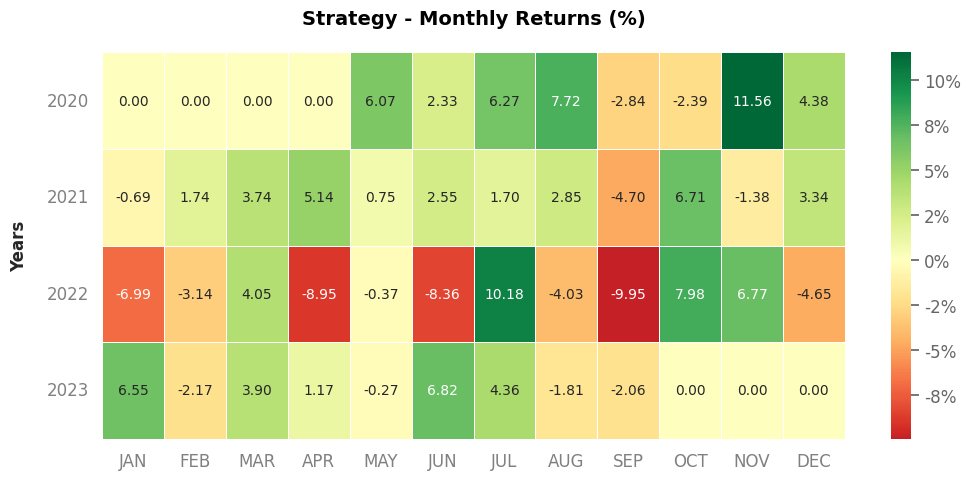

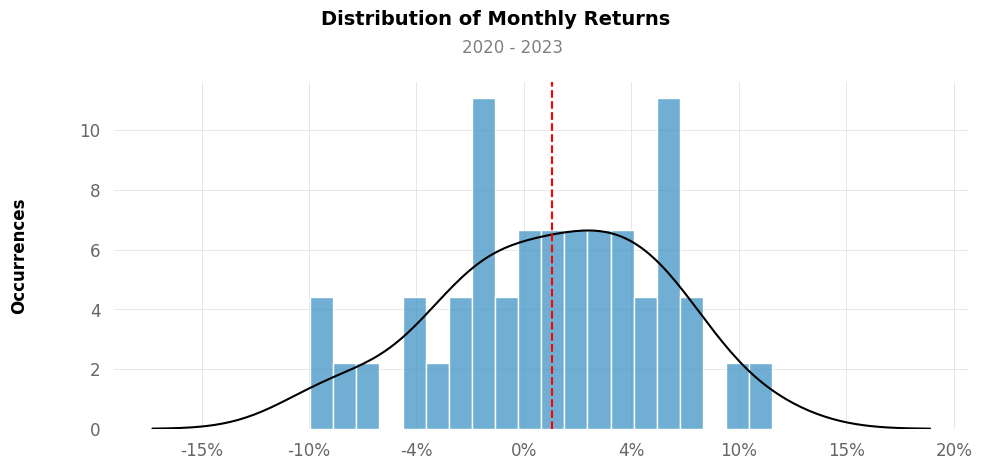

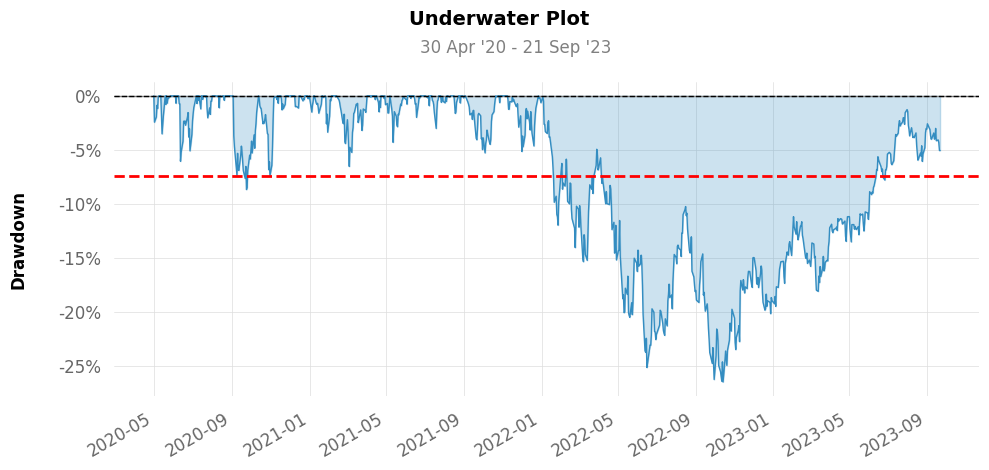

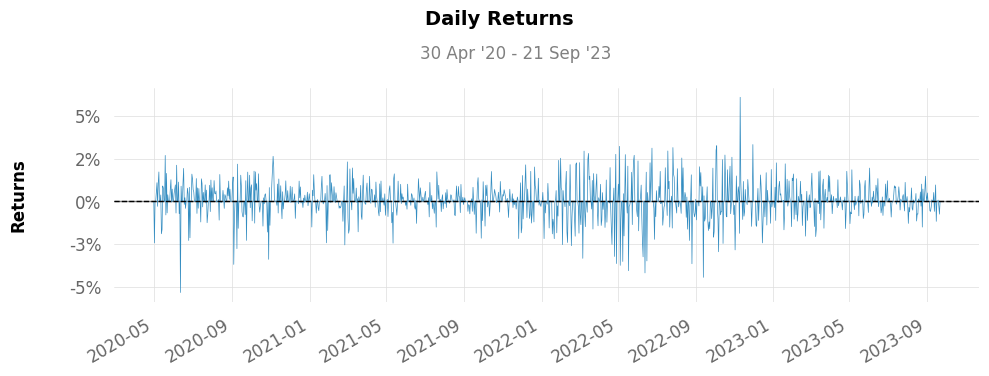

<Figure size 1000x600 with 0 Axes>

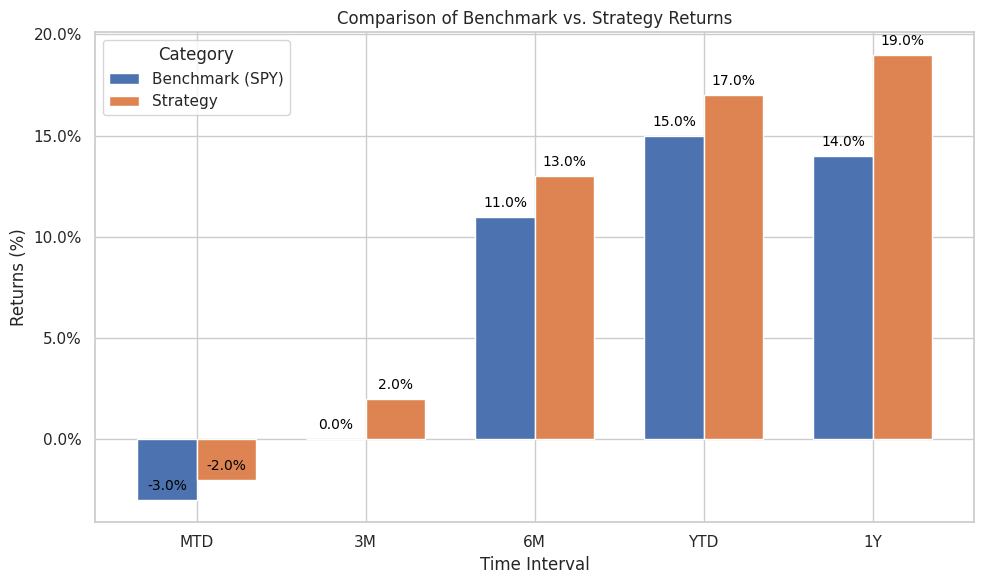

[*********************100%***********************]  1 of 1 completed
[Performance Metrics]

                           Benchmark    Strategy
-------------------------  -----------  ----------
Start Period               2020-04-30   2020-04-30
End Period                 2023-09-21   2023-09-21
Risk-Free Rate             0.0%         0.0%
Time in Market             100.0%       100.0%

Cumulative Return          51.01%       61.83%
CAGR﹪                     8.74%        10.29%

Sharpe                     0.76         0.84
Prob. Sharpe Ratio         91.6%        93.68%
Smart Sharpe               0.74         0.82
Sortino                    1.07         1.19
Smart Sortino              1.05         1.17
Sortino/√2                 0.75         0.84
Smart Sortino/√2           0.74         0.83
Omega                      1.15         1.15

Max Drawdown               -25.36%      -26.5%
Longest DD Days            626          633
Volatility (ann.)          18.3%        19.16%
R^2               

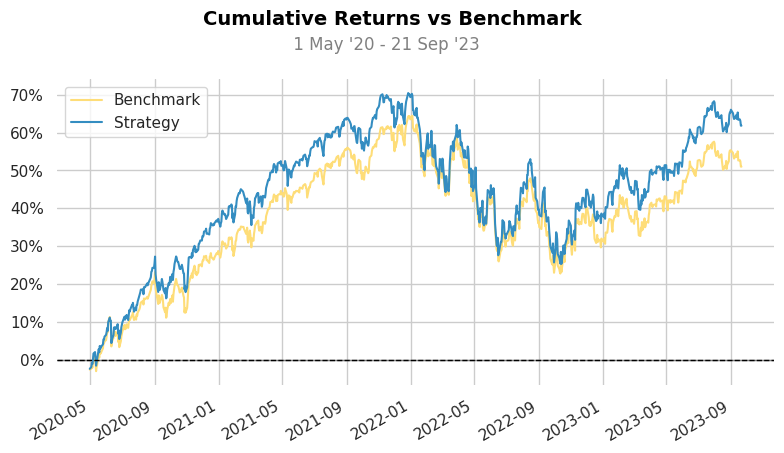

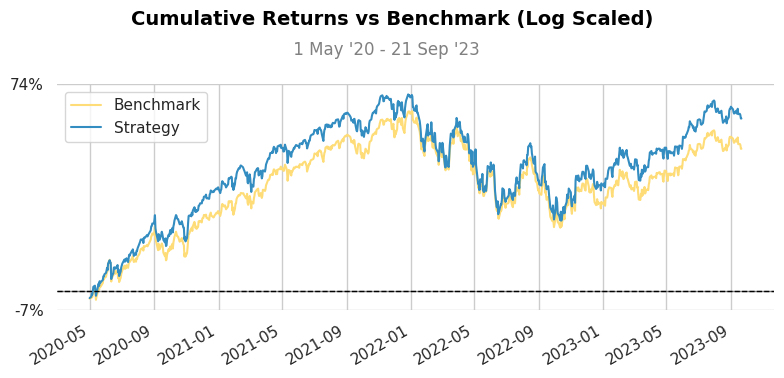

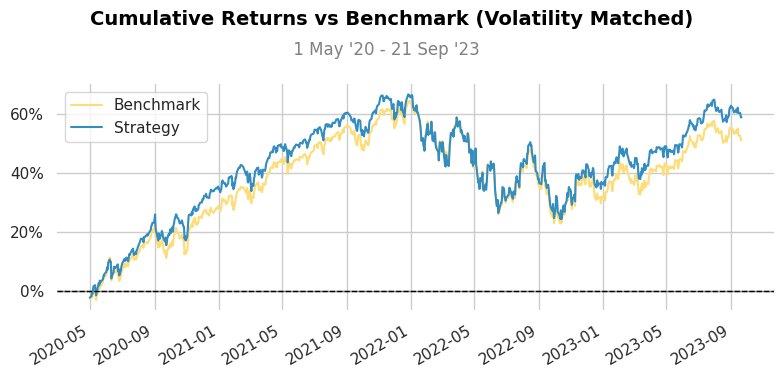

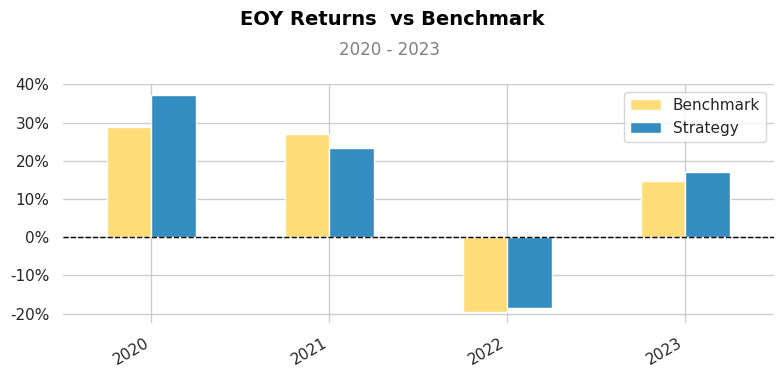

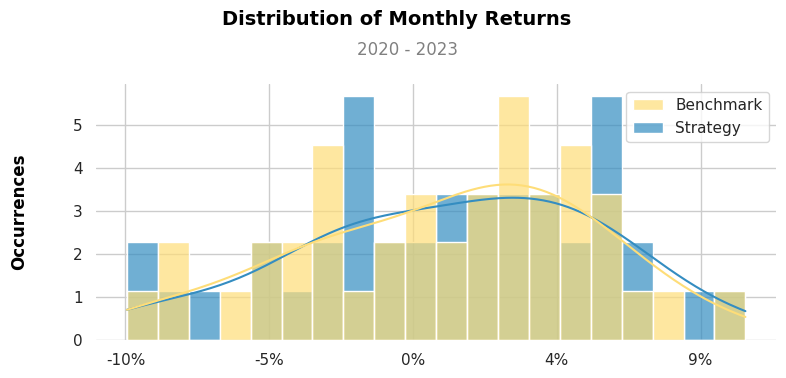

...

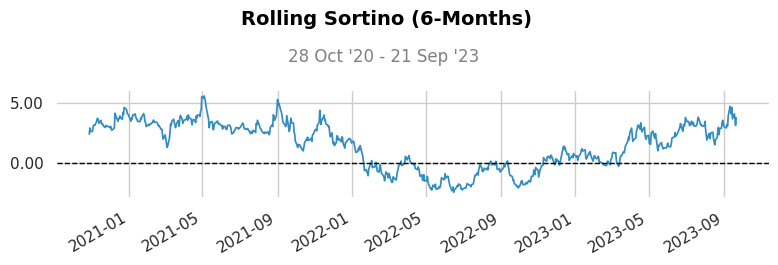

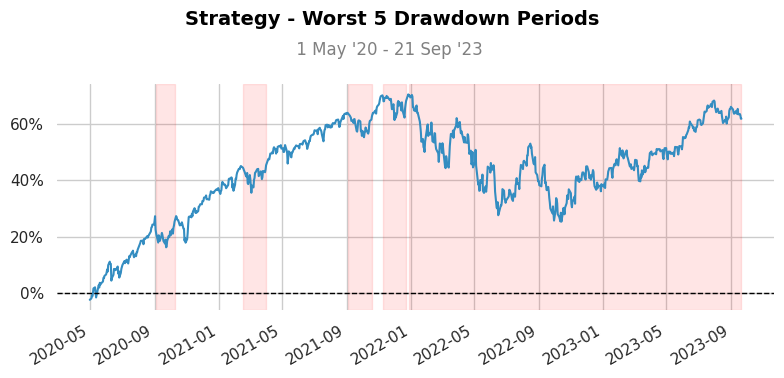

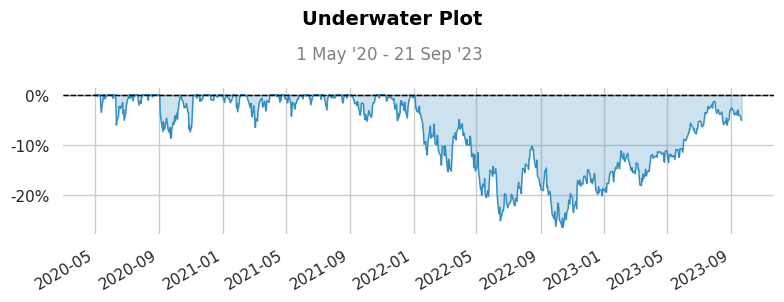

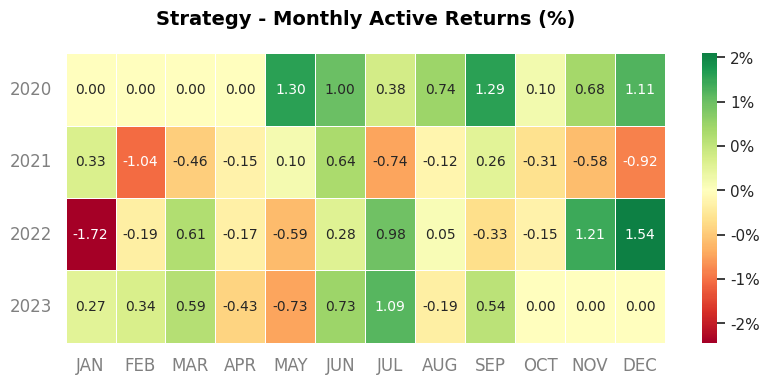

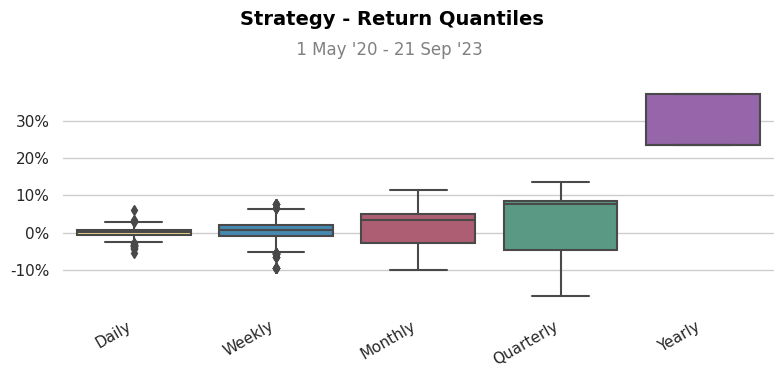

[*********************100%***********************]  1 of 1 completed


In [ ]:
import warnings
warnings.filterwarnings("ignore")

generate_report('Tearsheet Generator', 'TransactionHistory2020-2022_withCash', '2020-04-30')

Reading Portfolio Transactions from .CSV...
['VGT' 'MSFT' 'ADBE' 'CRM' 'LRCX' 'AAPL' 'NVDA']
Getting data for VGT...
[*********************100%***********************]  1 of 1 completed
Getting data for MSFT...
[*********************100%***********************]  1 of 1 completed
Getting data for ADBE...
[*********************100%***********************]  1 of 1 completed
Getting data for CRM...
[*********************100%***********************]  1 of 1 completed
Getting data for LRCX...
[*********************100%***********************]  1 of 1 completed
Getting data for AAPL...
[*********************100%***********************]  1 of 1 completed
Getting data for NVDA...
[*********************100%***********************]  1 of 1 completed
Determining Active Portfolio...
Calculating Daily Position Snapshots...
Generating Sector Performance Plot
Getting data for SPY...
[*********************100%***********************]  1 of 1 completed


Formatting Returns for QuantStats Library & Plotting Individual Sector Returns...
Generating Report...
[*********************100%***********************]  1 of 1 completed


,Benchmark (SPY),Strategy,Statistics
Start Period,2020-04-30,2020-04-30,Start Period
End Period,2023-09-21,2023-09-21,End Period
Risk-Free Rate,0,0,Risk-Free Rate
Time in Market,1.0,1.0,Time in Market
Cumulative Return,0.51,0.8,Cumulative Return
...,...,...,...
Win Year,0.75,0.75,Win Year
Beta,-,1.33,Beta
Alpha,-,0.03,Alpha
Correlation,-,0.91%,Correlation


[*********************100%***********************]  1 of 1 completed


,beta,alpha
Date Snapshot,,
2020-04-30,NaN,NaN
2020-05-01,NaN,NaN
2020-05-04,NaN,NaN
2020-05-05,NaN,NaN
2020-05-06,NaN,NaN
...,...,...
2023-09-15,1.366944,0.000082
2023-09-18,1.361559,0.000085
2023-09-19,1.364803,0.000083


,Rolling Sharpe Ratio
Date Snapshot,
2020-04-30,NaN
2020-05-01,NaN
2020-05-04,NaN
2020-05-05,NaN
2020-05-06,NaN
...,...
2023-09-15,2.040877
2023-09-18,2.102603
2023-09-19,2.065645


,Rolling Volatility
Date Snapshot,
2020-04-30,NaN
2020-05-01,NaN
2020-05-04,NaN
2020-05-05,NaN
2020-05-06,NaN
...,...
2023-09-15,0.189107
2023-09-18,0.189115
2023-09-19,0.189140


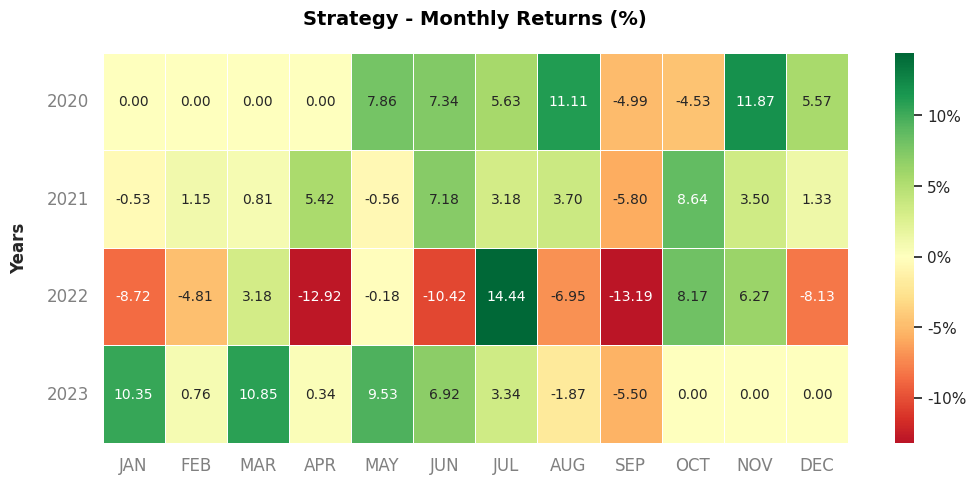

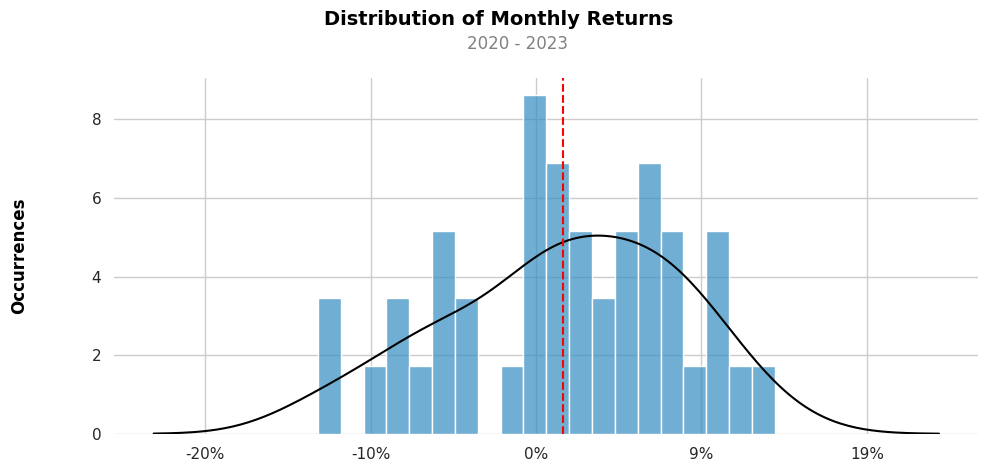

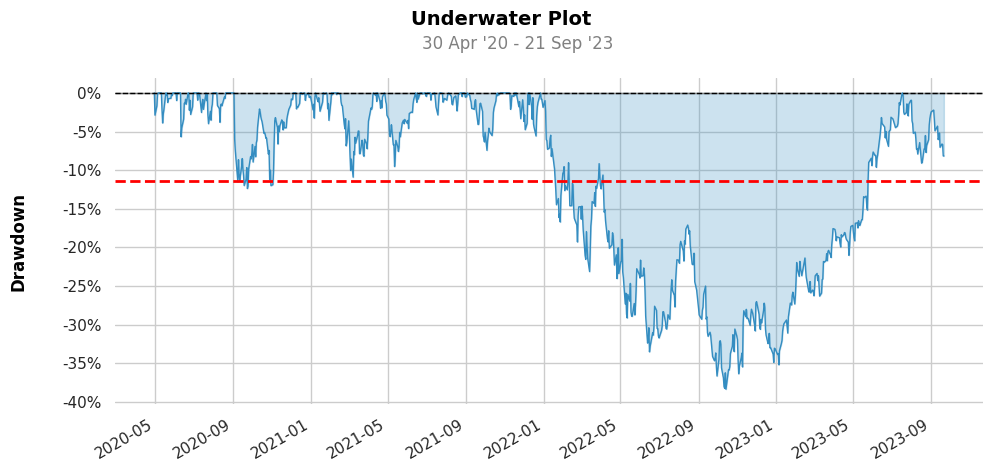

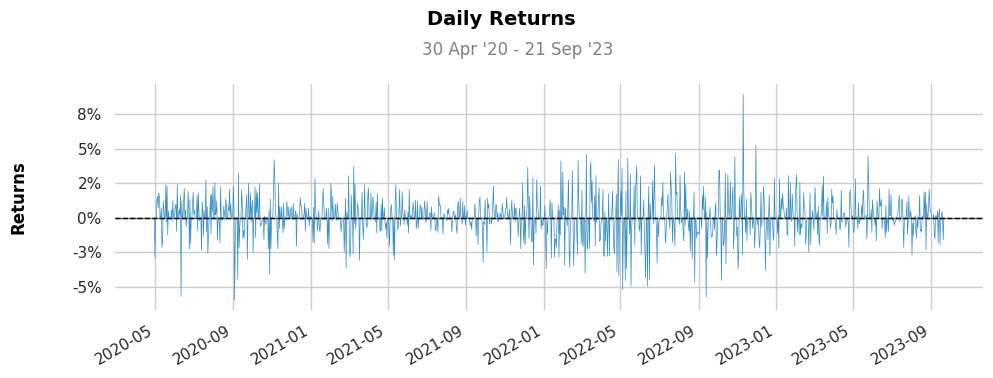

<Figure size 1000x600 with 0 Axes>

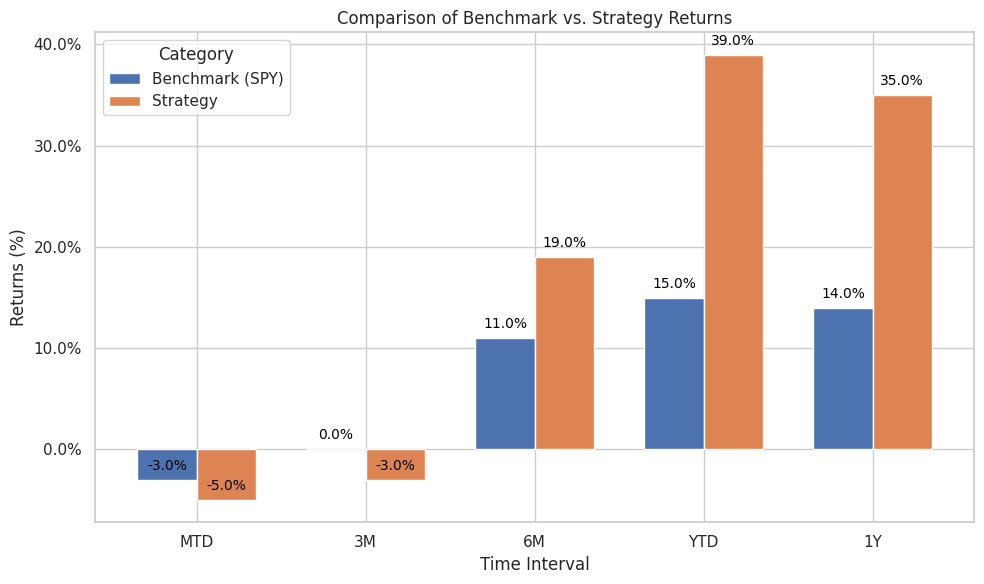

[*********************100%***********************]  1 of 1 completed
[Performance Metrics]

                           Benchmark    Strategy
-------------------------  -----------  ----------
Start Period               2020-04-30   2020-04-30
End Period                 2023-09-21   2023-09-21
Risk-Free Rate             0.0%         0.0%
Time in Market             100.0%       100.0%

Cumulative Return          51.01%       80.17%
CAGR﹪                     8.74%        12.72%

Sharpe                     0.76         0.78
Prob. Sharpe Ratio         91.6%        92.41%
Smart Sharpe               0.74         0.76
Sortino                    1.07         1.12
Smart Sortino              1.04         1.1
Sortino/√2                 0.75         0.8
Smart Sortino/√2           0.74         0.78
Omega                      1.14         1.14

Max Drawdown               -25.36%      -38.39%
Longest DD Days            626          567
Volatility (ann.)          18.3%        26.86%
R^2                

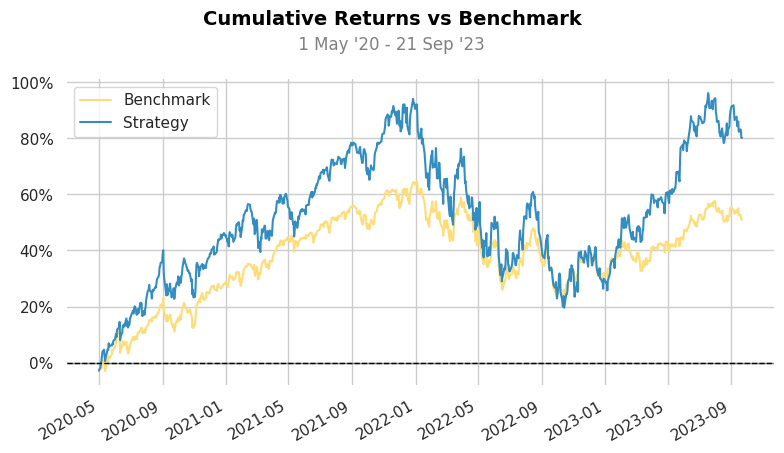

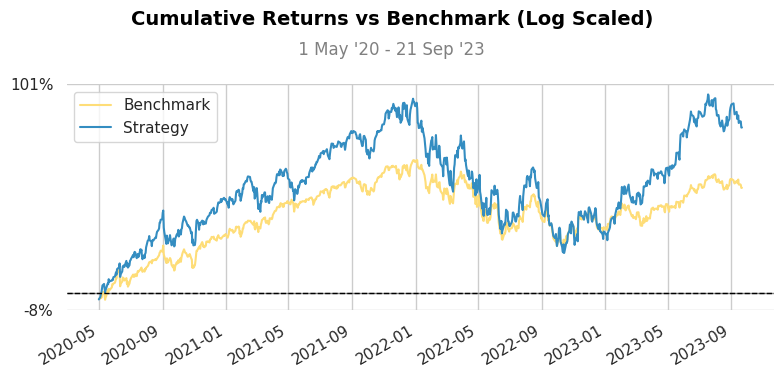

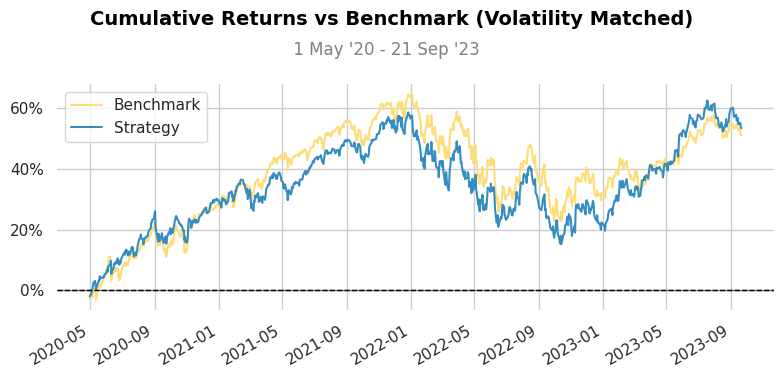

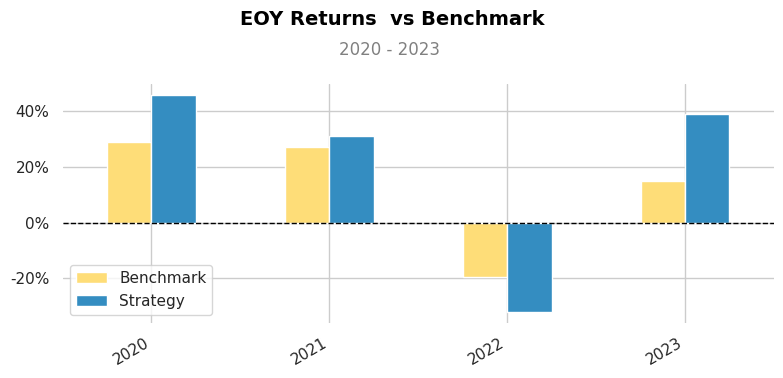

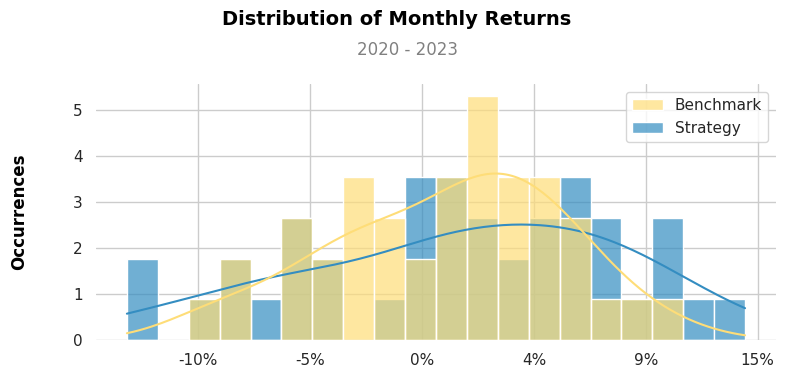

...

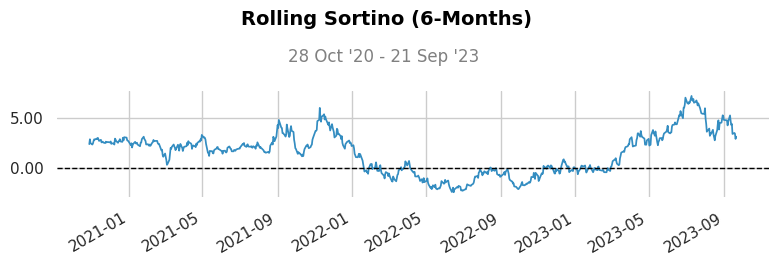

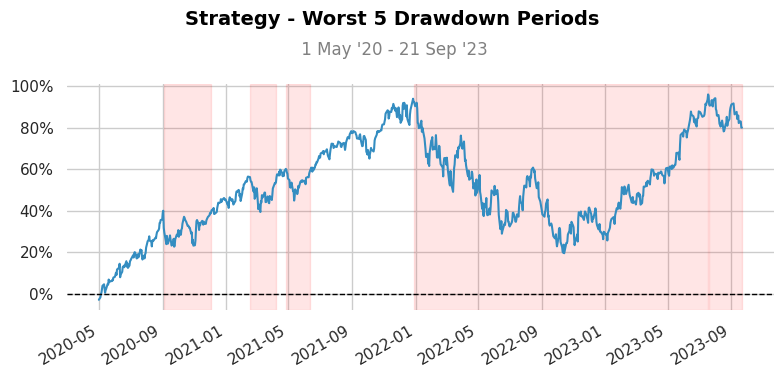

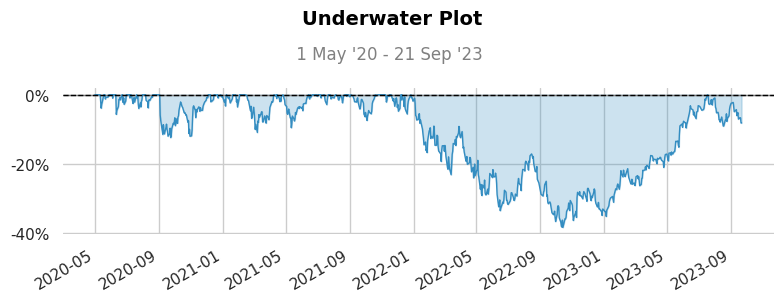

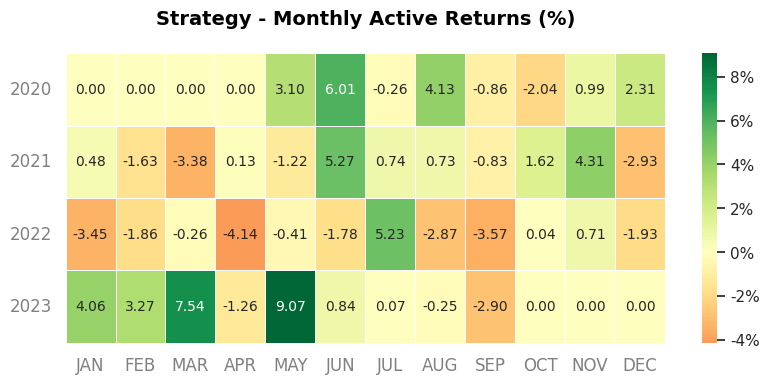

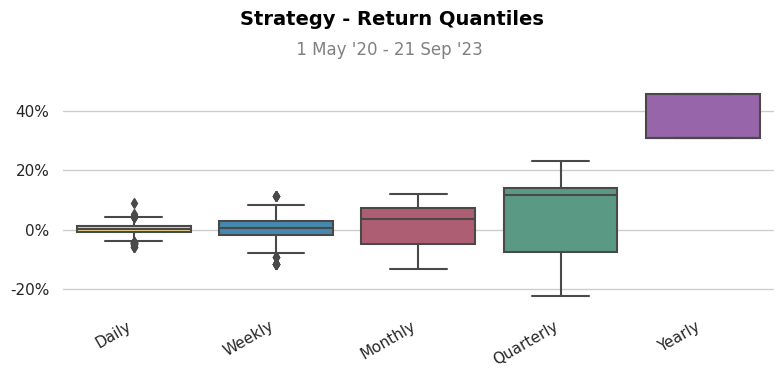

[*********************100%***********************]  1 of 1 completed


Reading Portfolio Transactions from .CSV...
['VFH' 'BLK' 'BAM' 'SIVBQ' 'VNQ' 'BN' 'RLI']
Getting data for VFH...
[*********************100%***********************]  1 of 1 completed
Getting data for BLK...
[*********************100%***********************]  1 of 1 completed
Getting data for BAM...
[*********************100%***********************]  1 of 1 completed
Getting data for SIVBQ...
[*********************100%***********************]  1 of 1 completed
Getting data for VNQ...
[*********************100%***********************]  1 of 1 completed
Getting data for BN...
[*********************100%***********************]  1 of 1 completed
Getting data for RLI...
[*********************100%***********************]  1 of 1 completed
Determining Active Portfolio...
Calculating Daily Position Snapshots...
Generating Sector Performance Plot
Getting data for SPY...
[*********************100%***********************]  1 of 1 completed


Formatting Returns for QuantStats Library & Plotting Individual Sector Returns...
Generating Report...
[*********************100%***********************]  1 of 1 completed


,Benchmark (SPY),Strategy,Statistics
Start Period,2021-04-13,2021-04-13,Start Period
End Period,2023-09-21,2023-09-21,End Period
Risk-Free Rate,0,0,Risk-Free Rate
Time in Market,1.0,1.0,Time in Market
Cumulative Return,0.06,-0.14,Cumulative Return
...,...,...,...
Win Year,0.67,0.67,Win Year
Beta,-,1.2,Beta
Alpha,-,-0.08,Alpha
Correlation,-,0.84%,Correlation


[*********************100%***********************]  1 of 1 completed


,beta,alpha
Date Snapshot,,
2021-04-13,NaN,NaN
2021-04-14,NaN,NaN
2021-04-15,NaN,NaN
2021-04-16,NaN,NaN
2021-04-19,NaN,NaN
...,...,...
2023-09-15,1.274750,-0.000323
2023-09-18,1.280506,-0.000324
2023-09-19,1.279216,-0.000324


,Rolling Sharpe Ratio
Date Snapshot,
2021-04-13,NaN
2021-04-14,NaN
2021-04-15,NaN
2021-04-16,NaN
2021-04-19,NaN
...,...
2023-09-15,1.398708
2023-09-18,1.761624
2023-09-19,1.576542


,Rolling Volatility
Date Snapshot,
2021-04-13,NaN
2021-04-14,NaN
2021-04-15,NaN
2021-04-16,NaN
2021-04-19,NaN
...,...
2023-09-15,0.165042
2023-09-18,0.160665
2023-09-19,0.160053


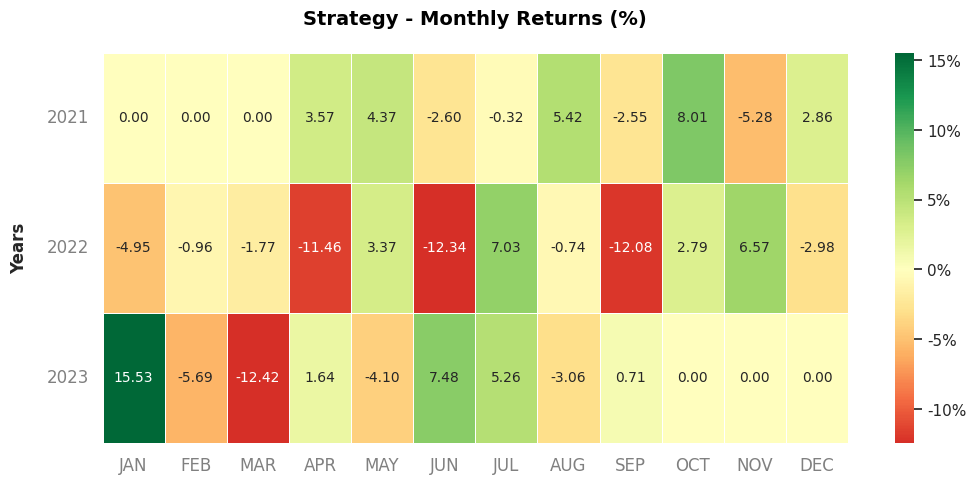

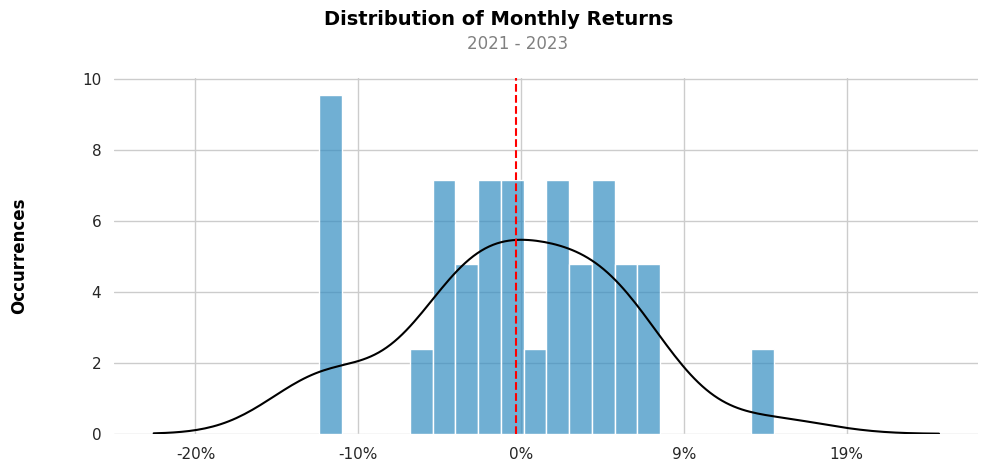

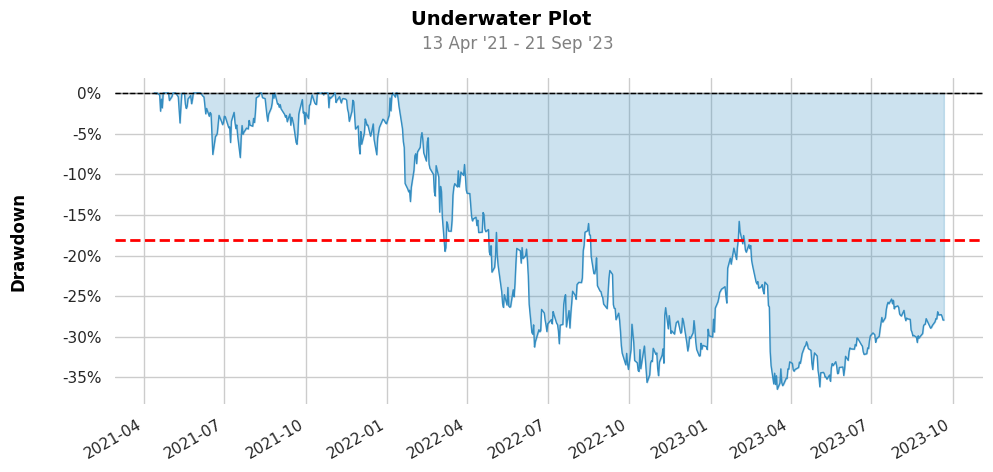

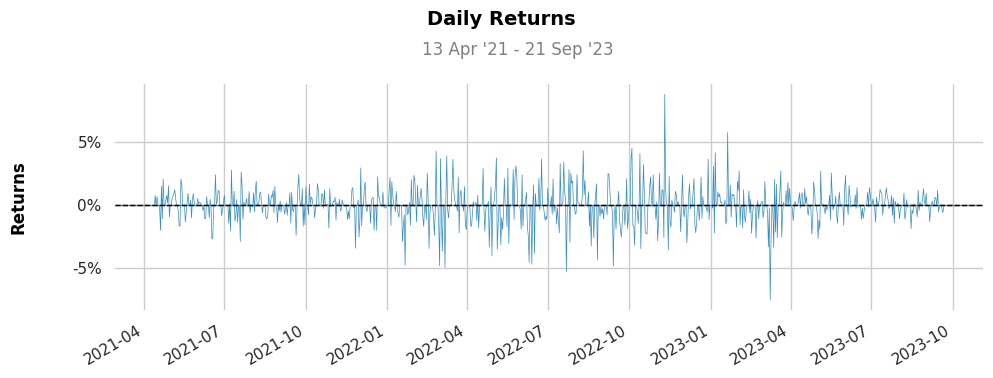

<Figure size 1000x600 with 0 Axes>

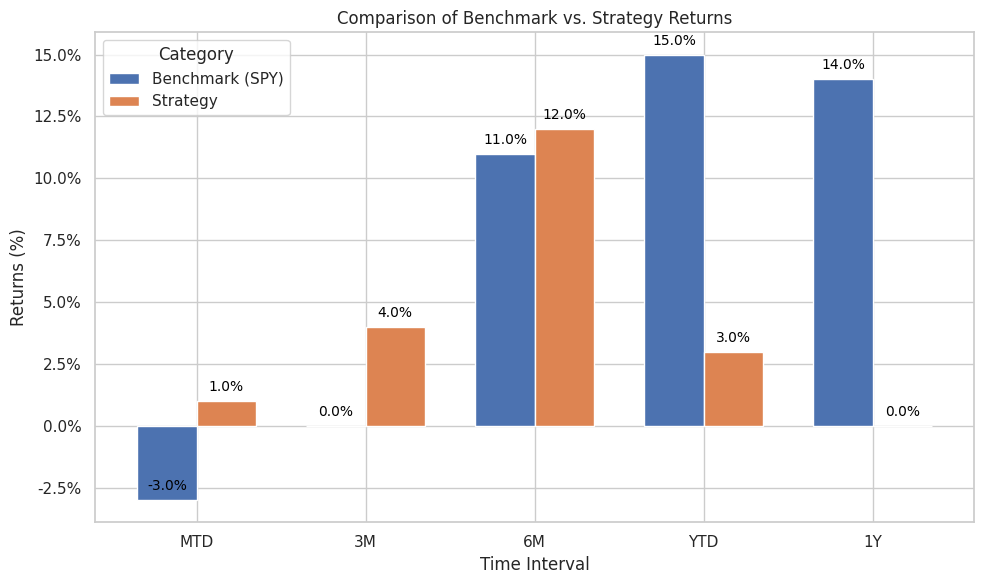

[*********************100%***********************]  1 of 1 completed
[Performance Metrics]



                           Benchmark    Strategy
-------------------------  -----------  ----------
Start Period               2021-04-13   2021-04-13
End Period                 2023-09-21   2023-09-21
Risk-Free Rate             0.0%         0.0%
Time in Market             100.0%       100.0%

Cumulative Return          6.24%        -14.12%
CAGR﹪                     1.73%        -4.22%

Sharpe                     0.23         -0.11
Prob. Sharpe Ratio         63.82%       43.29%
Smart Sharpe               0.22         -0.11
Sortino                    0.32         -0.15
Smart Sortino              0.32         -0.15
Sortino/√2                 0.23         -0.11
Smart Sortino/√2           0.22         -0.11
Omega                      0.98         0.98

Max Drawdown               -25.36%      -36.46%
Longest DD Days            626          617
Volatility (ann.)          18.39%       26.11%
R^2                        0.71         0.71
Information Ratio          -0.03        -0.03
Calmar     

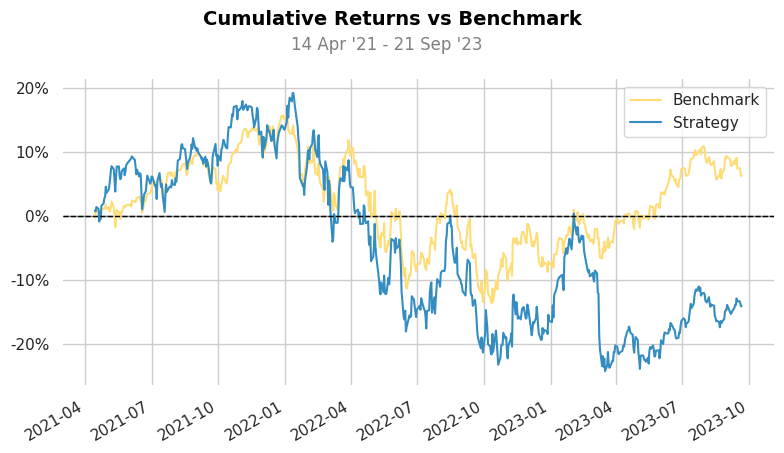

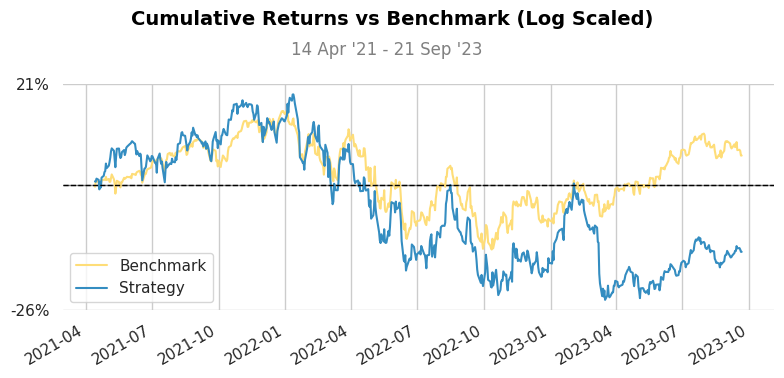

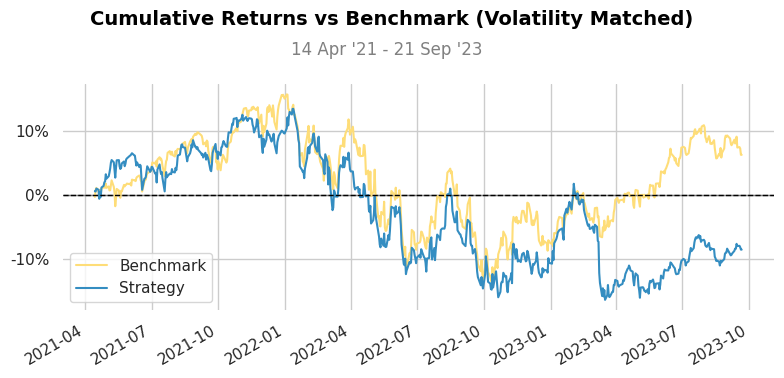

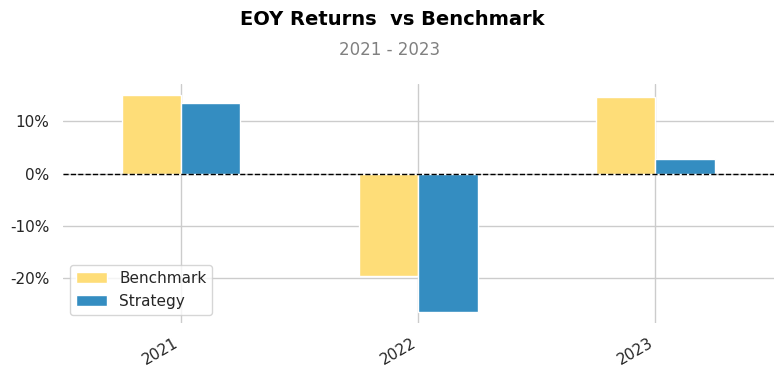

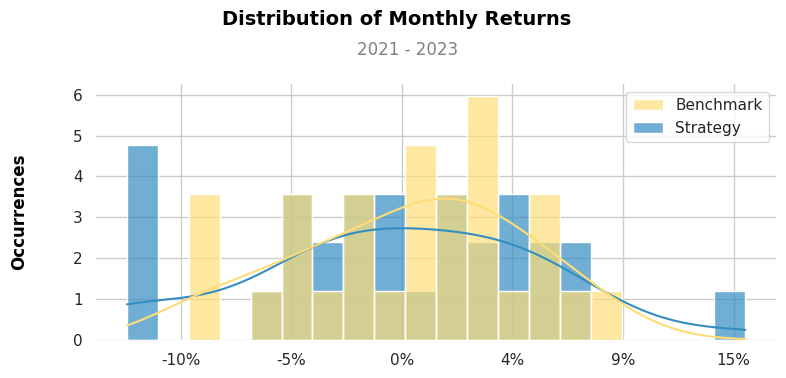

...

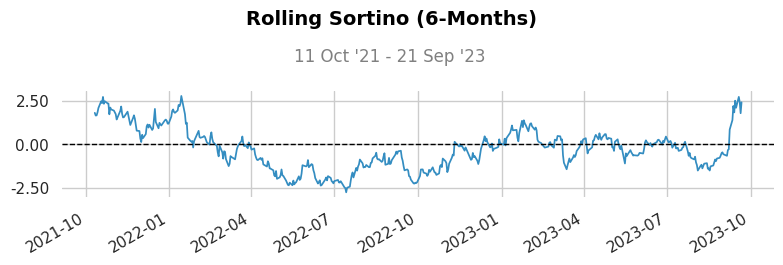

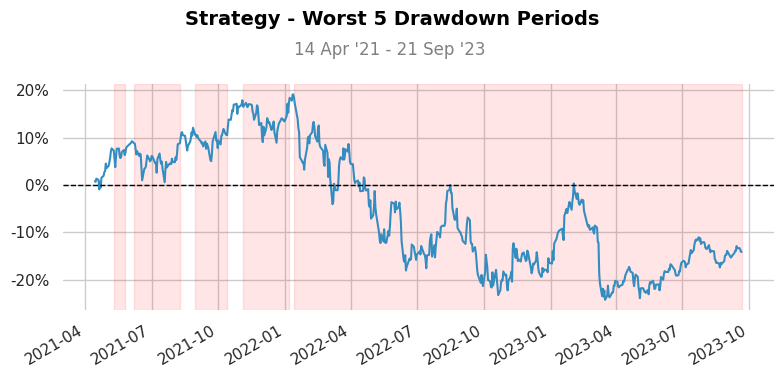

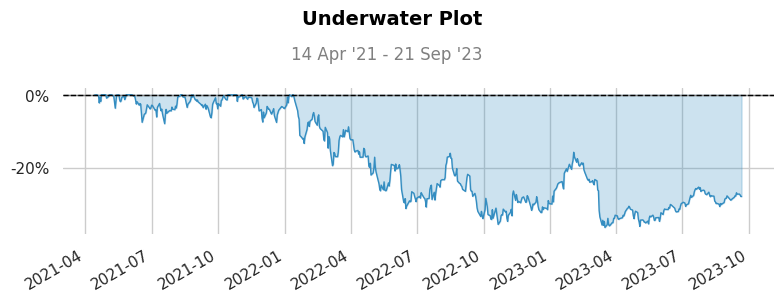

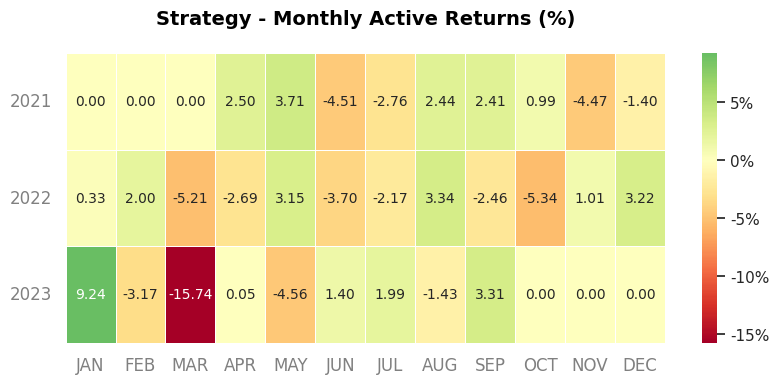

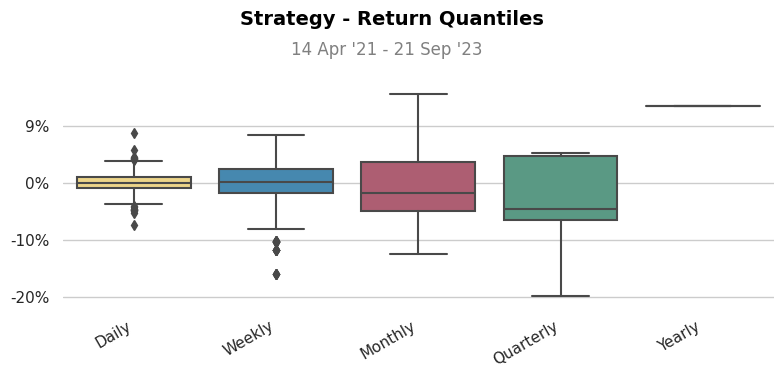

[*********************100%***********************]  1 of 1 completed


Reading Portfolio Transactions from .CSV...
['VHT' 'MRK' 'UNH' 'MDT' 'OGN' 'ABBV' 'TMO' 'ELV']
Getting data for VHT...
[*********************100%***********************]  1 of 1 completed
Getting data for MRK...
[*********************100%***********************]  1 of 1 completed
Getting data for UNH...
[*********************100%***********************]  1 of 1 completed
Getting data for MDT...
[*********************100%***********************]  1 of 1 completed
Getting data for OGN...
[*********************100%***********************]  1 of 1 completed
Getting data for ABBV...
[*********************100%***********************]  1 of 1 completed
Getting data for TMO...
[*********************100%***********************]  1 of 1 completed
Getting data for ELV...
[*********************100%***********************]  1 of 1 completed
Determining Active Portfolio...
Calculating Daily Position Snapshots...
Generating Sector Performance Plot
Getting data for SPY...
[*********************100%***

Formatting Returns for QuantStats Library & Plotting Individual Sector Returns...
Generating Report...
[*********************100%***********************]  1 of 1 completed


,Benchmark (SPY),Strategy,Statistics
Start Period,2020-04-30,2020-04-30,Start Period
End Period,2023-09-21,2023-09-21,End Period
Risk-Free Rate,0,0,Risk-Free Rate
Time in Market,1.0,1.0,Time in Market
Cumulative Return,0.51,0.4,Cumulative Return
...,...,...,...
Win Year,0.75,0.5,Win Year
Beta,-,0.66,Beta
Alpha,-,0.02,Alpha
Correlation,-,0.75%,Correlation


[*********************100%***********************]  1 of 1 completed


,beta,alpha
Date Snapshot,,
2020-04-30,NaN,NaN
2020-05-01,NaN,NaN
2020-05-04,NaN,NaN
2020-05-05,NaN,NaN
2020-05-06,NaN,NaN
...,...,...
2023-09-15,0.620918,0.000100
2023-09-18,0.627445,0.000097
2023-09-19,0.628232,0.000096


,Rolling Sharpe Ratio
Date Snapshot,
2020-04-30,NaN
2020-05-01,NaN
2020-05-04,NaN
2020-05-05,NaN
2020-05-06,NaN
...,...
2023-09-15,0.285142
2023-09-18,0.499161
2023-09-19,0.292742


,Rolling Volatility
Date Snapshot,
2020-04-30,NaN
2020-05-01,NaN
2020-05-04,NaN
2020-05-05,NaN
2020-05-06,NaN
...,...
2023-09-15,0.119339
2023-09-18,0.117803
2023-09-19,0.116796


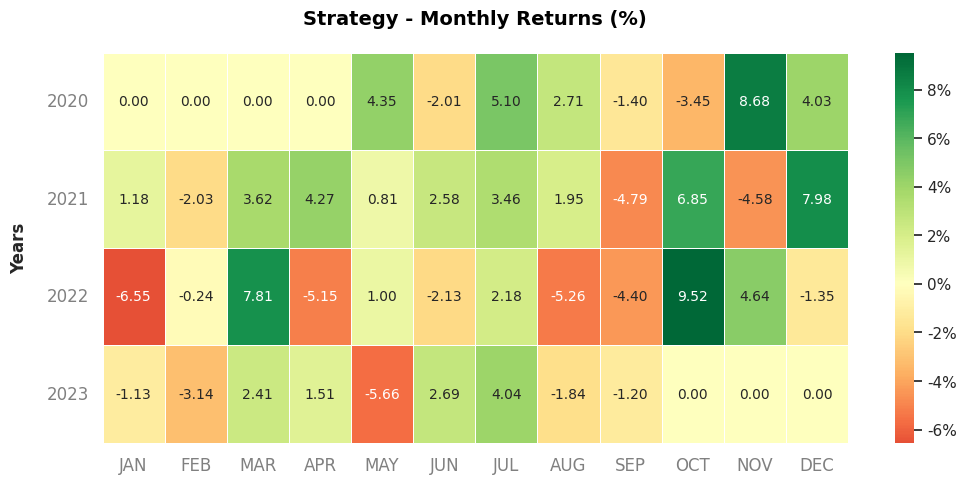

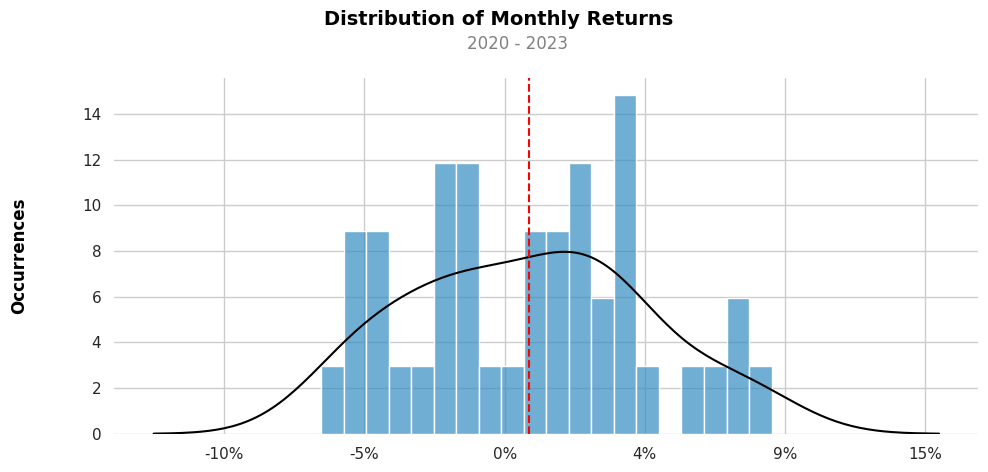

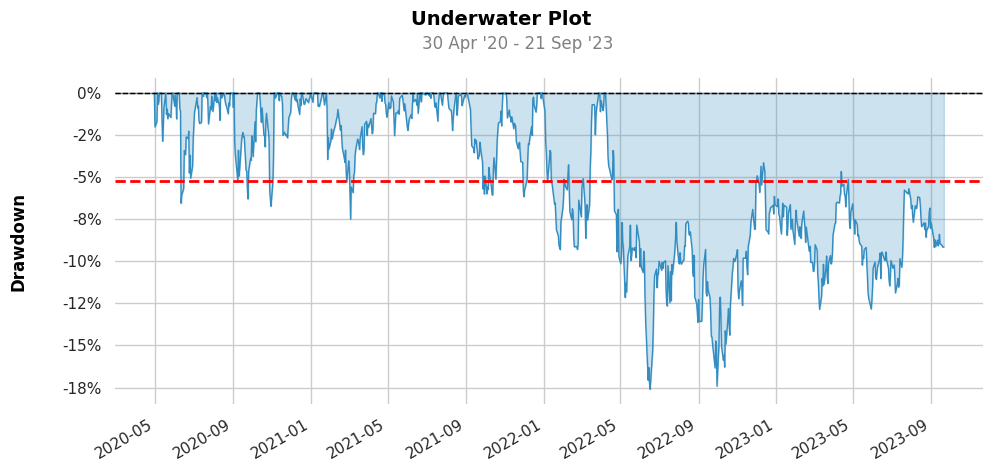

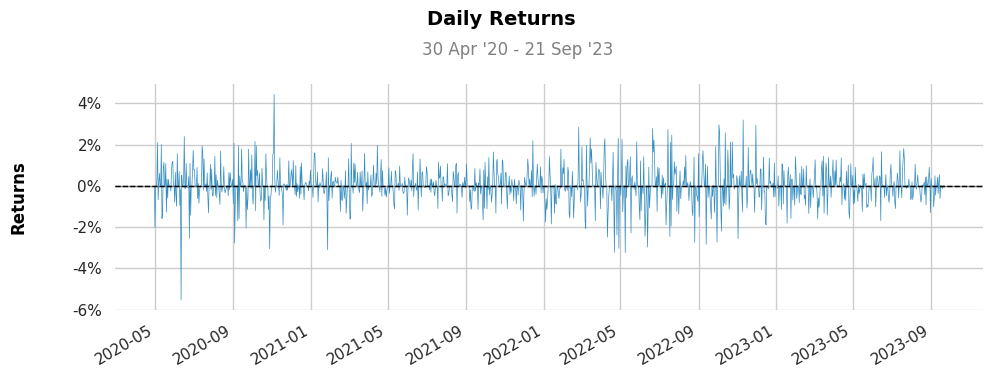

<Figure size 1000x600 with 0 Axes>

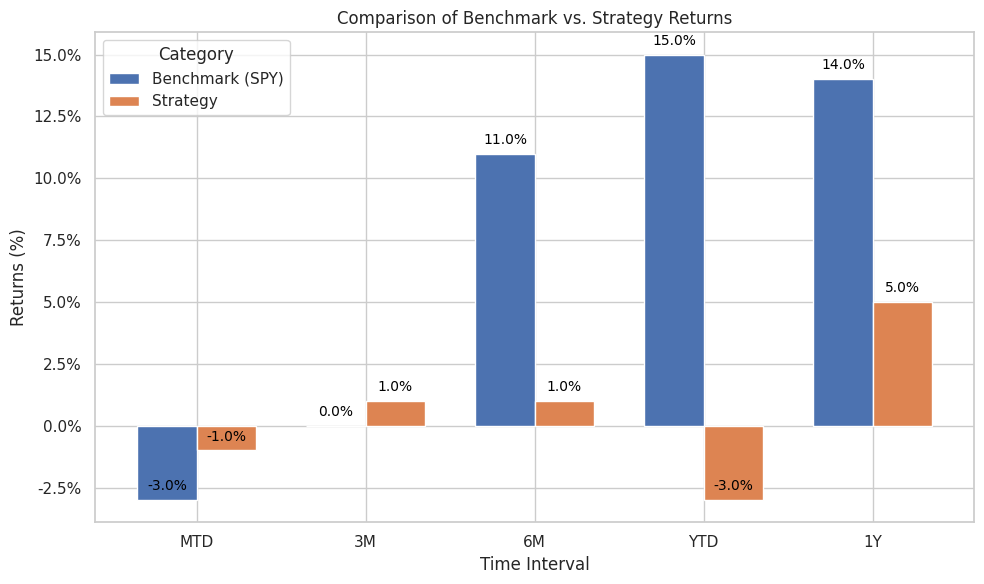

[*********************100%***********************]  1 of 1 completed
[Performance Metrics]

                           Benchmark    Strategy
-------------------------  -----------  ----------
Start Period               2020-04-30   2020-04-30
End Period                 2023-09-21   2023-09-21
Risk-Free Rate             0.0%         0.0%
Time in Market             100.0%       100.0%

Cumulative Return          51.01%       39.55%
CAGR﹪                     8.74%        7.01%

Sharpe                     0.76         0.69
Prob. Sharpe Ratio         91.6%        89.75%
Smart Sharpe               0.75         0.68
Sortino                    1.07         1.0
Smart Sortino              1.05         0.99
Sortino/√2                 0.75         0.71
Smart Sortino/√2           0.75         0.7
Omega                      1.12         1.12

Max Drawdown               -25.36%      -17.6%
Longest DD Days            626          529
Volatility (ann.)          18.3%        16.09%
R^2                  

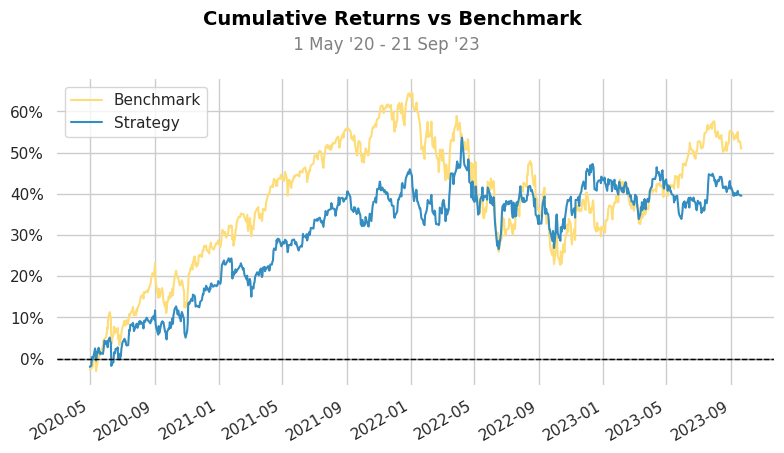

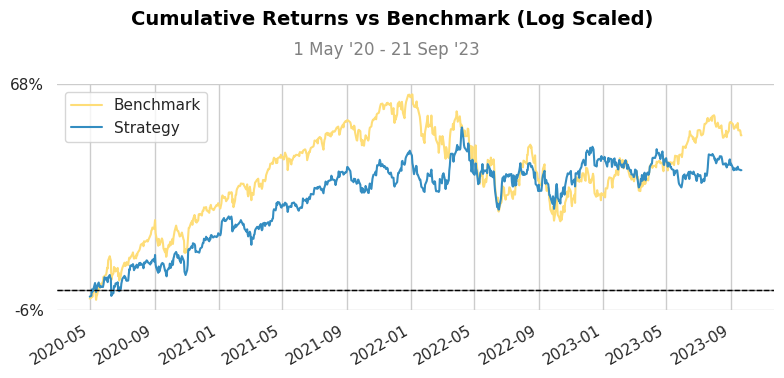

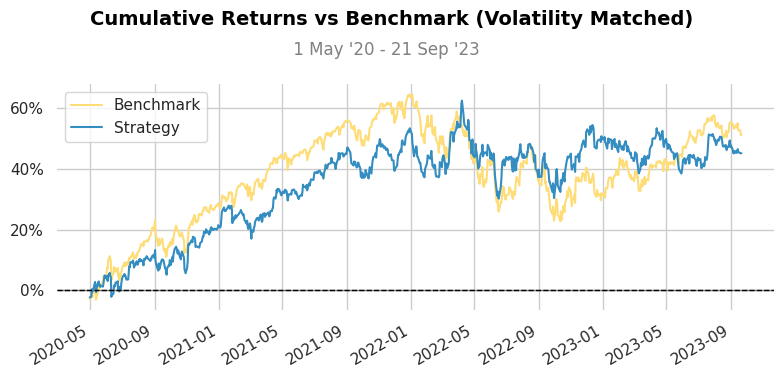

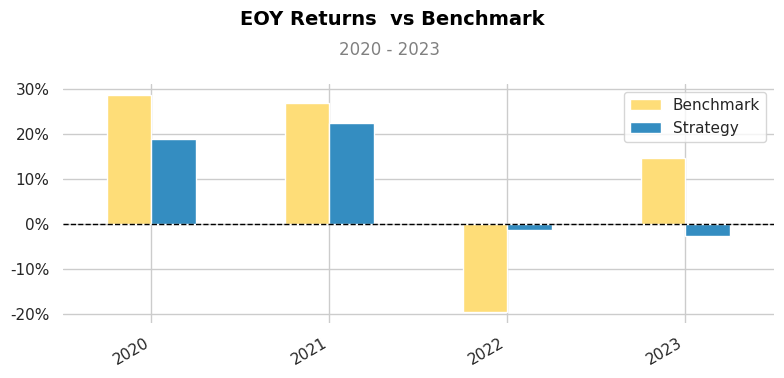

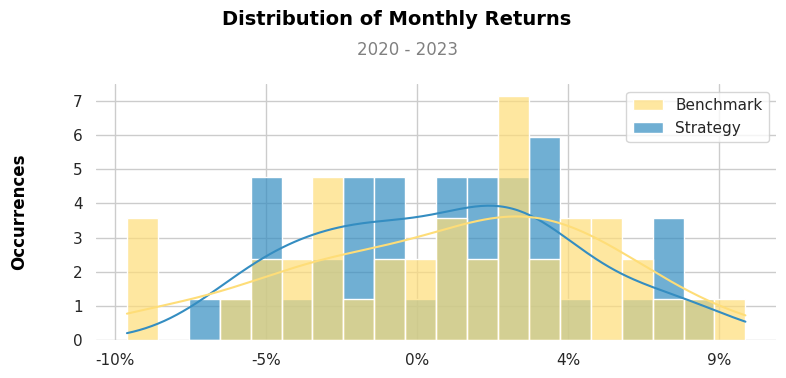

...

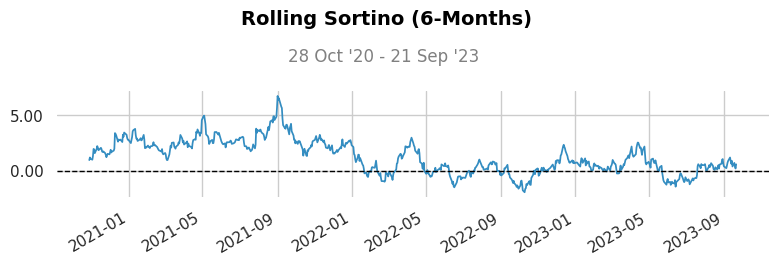

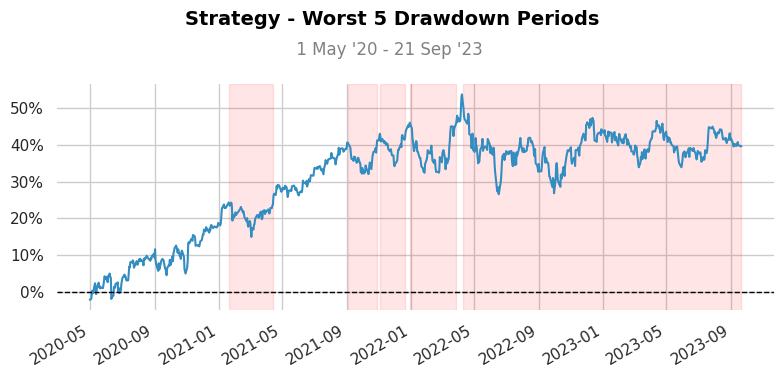

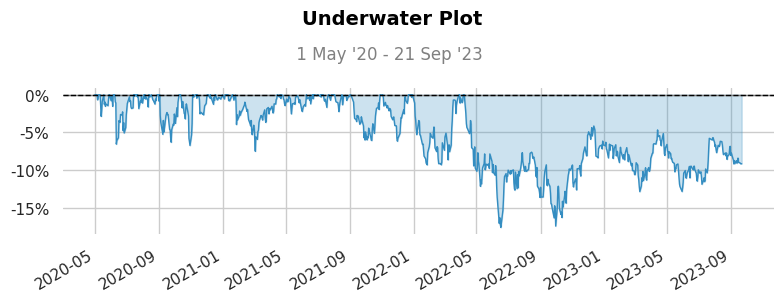

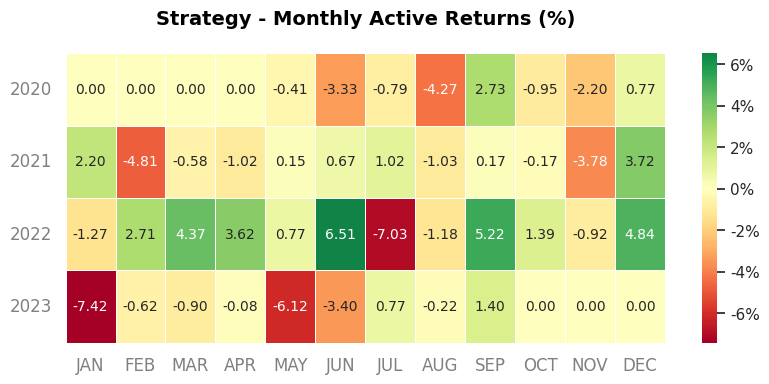

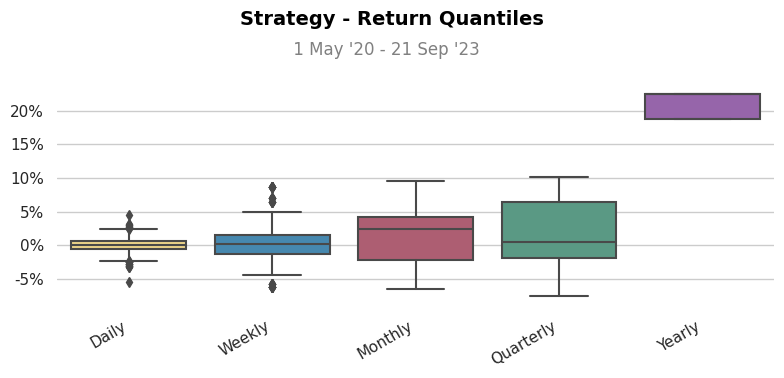

[*********************100%***********************]  1 of 1 completed


Reading Portfolio Transactions from .CSV...
['VCR' 'TJX' 'LULU']
Getting data for VCR...
[*********************100%***********************]  1 of 1 completed
Getting data for TJX...
[*********************100%***********************]  1 of 1 completed
Getting data for LULU...
[*********************100%***********************]  1 of 1 completed
Determining Active Portfolio...
Calculating Daily Position Snapshots...
Generating Sector Performance Plot
Getting data for SPY...
[*********************100%***********************]  1 of 1 completed


Formatting Returns for QuantStats Library & Plotting Individual Sector Returns...
Generating Report...
[*********************100%***********************]  1 of 1 completed


,Benchmark (SPY),Strategy,Statistics
Start Period,2020-04-30,2020-04-30,Start Period
End Period,2023-09-21,2023-09-21,End Period
Risk-Free Rate,0,0,Risk-Free Rate
Time in Market,1.0,1.0,Time in Market
Cumulative Return,0.51,0.82,Cumulative Return
...,...,...,...
Win Year,0.75,0.75,Win Year
Beta,-,1.21,Beta
Alpha,-,0.04,Alpha
Correlation,-,0.88%,Correlation


[*********************100%***********************]  1 of 1 completed


,beta,alpha
Date Snapshot,,
2020-04-30,NaN,NaN
2020-05-01,NaN,NaN
2020-05-04,NaN,NaN
2020-05-05,NaN,NaN
2020-05-06,NaN,NaN
...,...,...
2023-09-15,1.188201,0.000171
2023-09-18,1.191041,0.000170
2023-09-19,1.192334,0.000169


,Rolling Sharpe Ratio
Date Snapshot,
2020-04-30,NaN
2020-05-01,NaN
2020-05-04,NaN
2020-05-05,NaN
2020-05-06,NaN
...,...
2023-09-15,2.255715
2023-09-18,2.245183
2023-09-19,2.168503


,Rolling Volatility
Date Snapshot,
2020-04-30,NaN
2020-05-01,NaN
2020-05-04,NaN
2020-05-05,NaN
2020-05-06,NaN
...,...
2023-09-15,0.184907
2023-09-18,0.185036
2023-09-19,0.185116


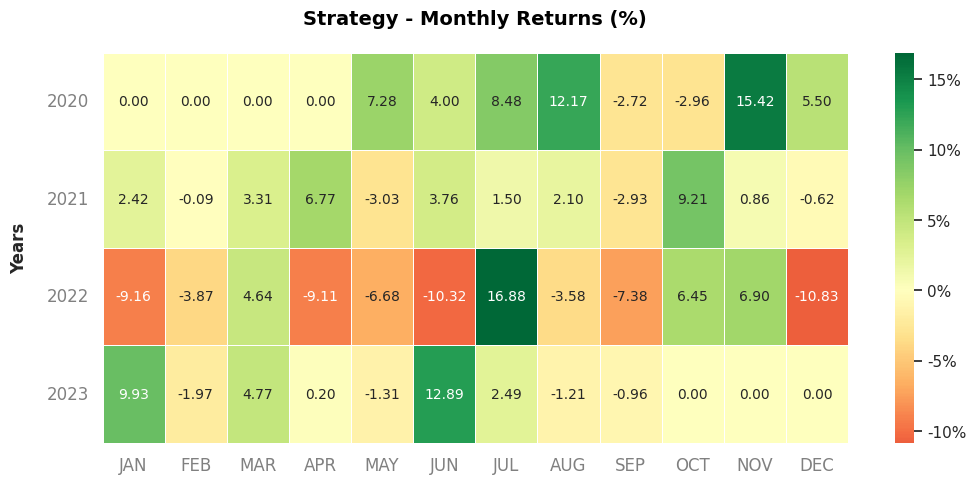

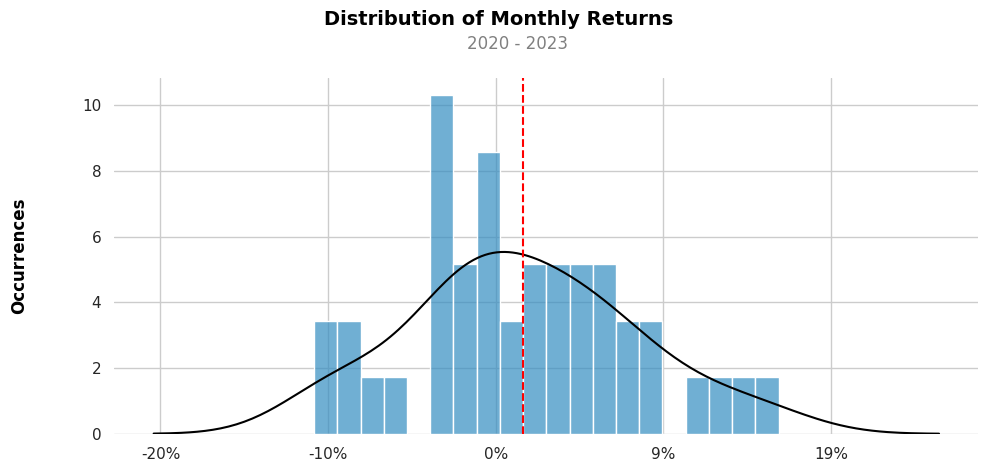

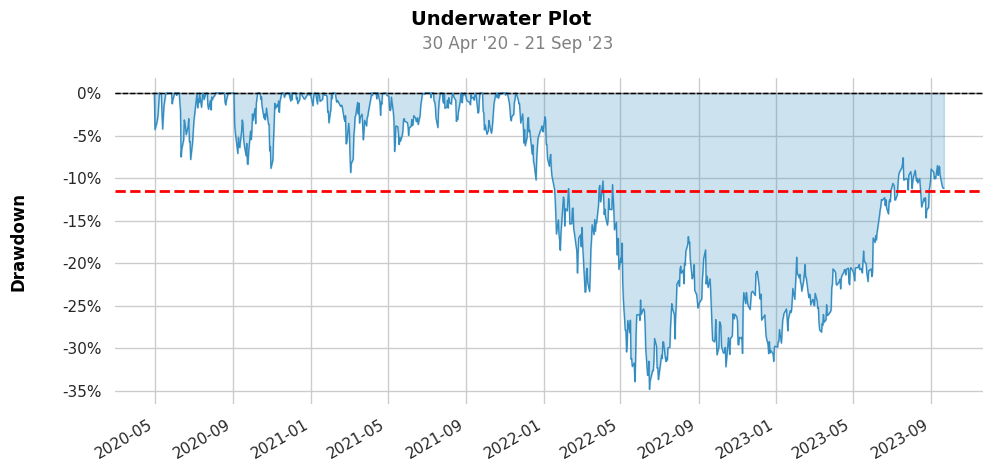

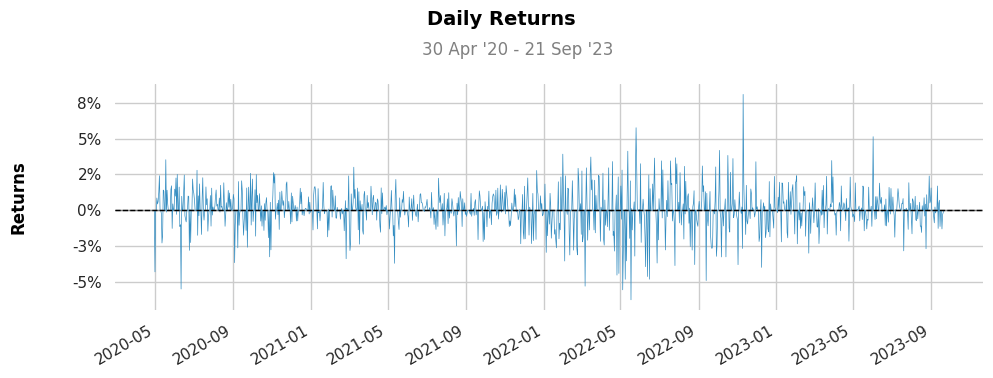

<Figure size 1000x600 with 0 Axes>

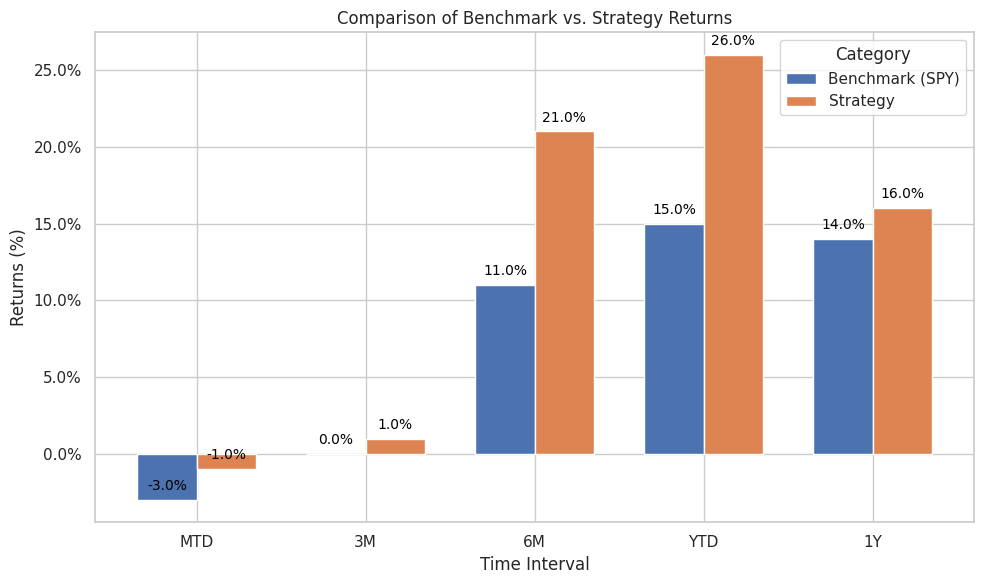

[*********************100%***********************]  1 of 1 completed
[Performance Metrics]

                           Benchmark    Strategy
-------------------------  -----------  ----------
Start Period               2020-04-30   2020-04-30
End Period                 2023-09-21   2023-09-21
Risk-Free Rate             0.0%         0.0%
Time in Market             100.0%       100.0%

Cumulative Return          51.01%       81.56%
CAGR﹪                     8.74%        12.9%

Sharpe                     0.76         0.83
Prob. Sharpe Ratio         91.6%        93.45%
Smart Sharpe               0.75         0.82
Sortino                    1.07         1.17
Smart Sortino              1.06         1.16
Sortino/√2                 0.75         0.83
Smart Sortino/√2           0.75         0.82
Omega                      1.15         1.15

Max Drawdown               -25.36%      -34.79%
Longest DD Days            626          672
Volatility (ann.)          18.3%        25.12%
R^2               

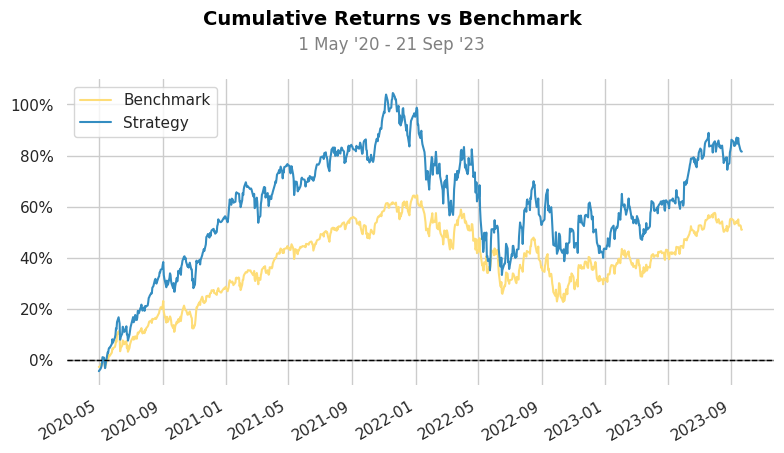

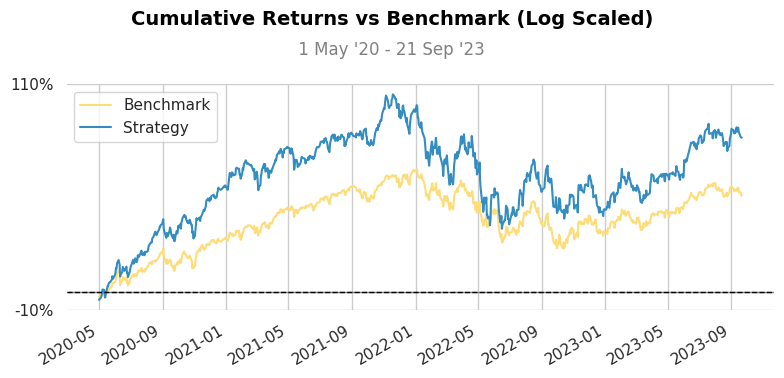

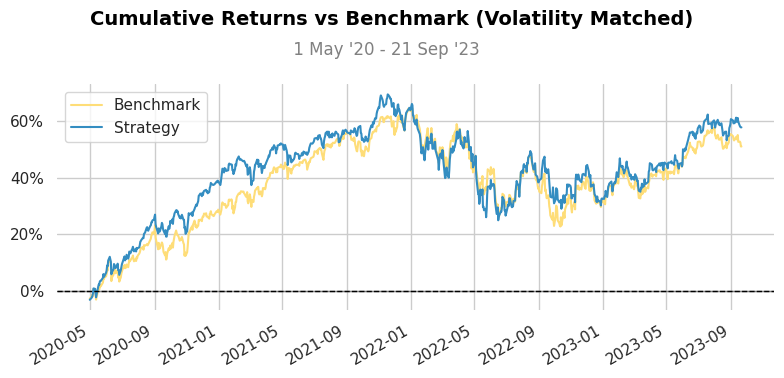

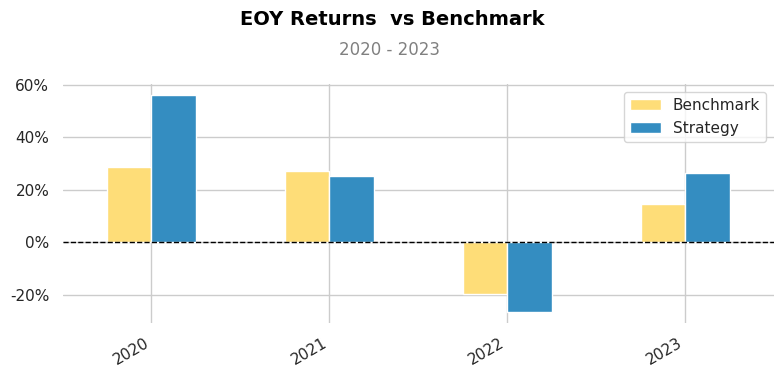

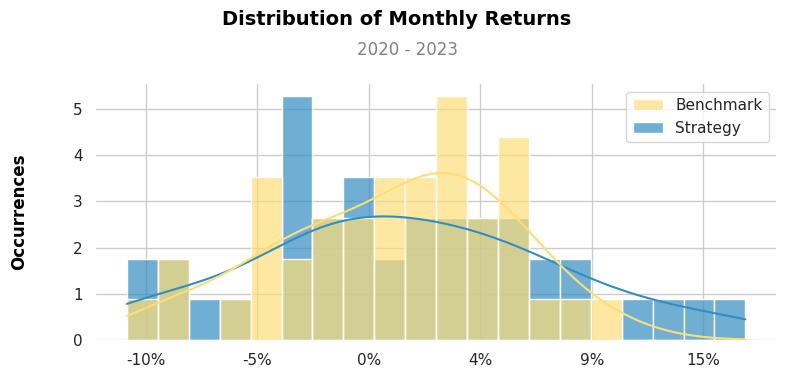

...

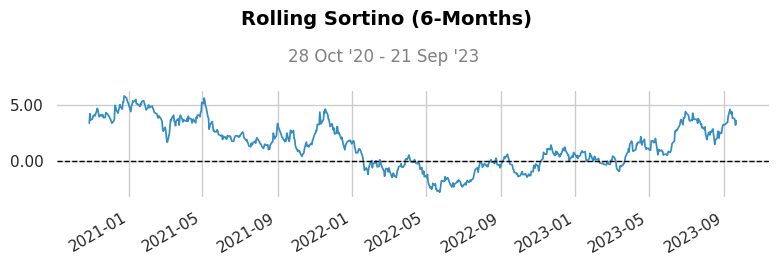

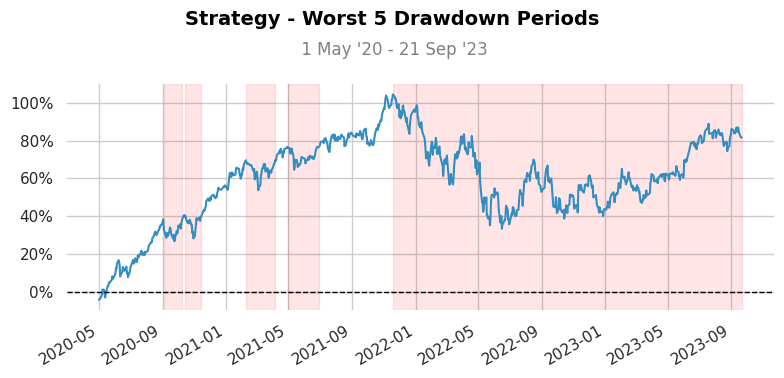

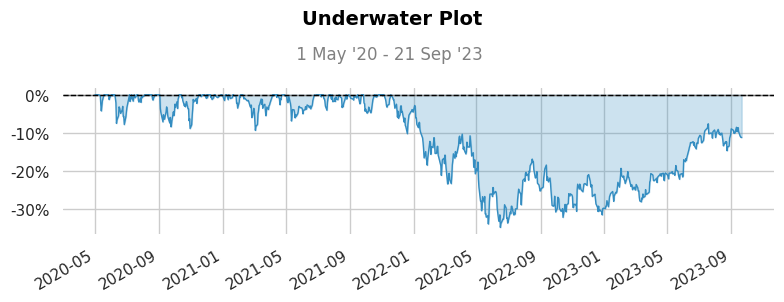

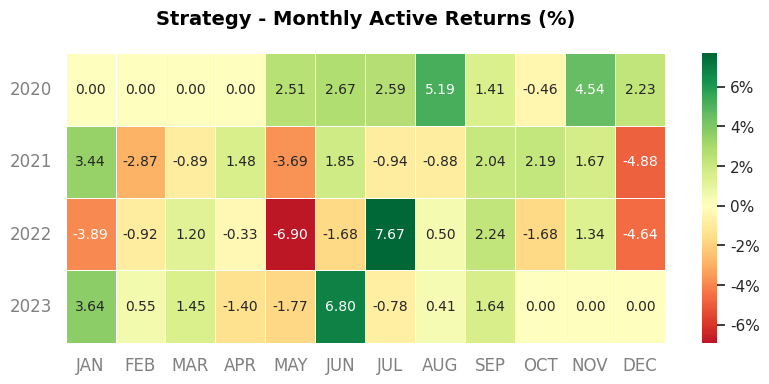

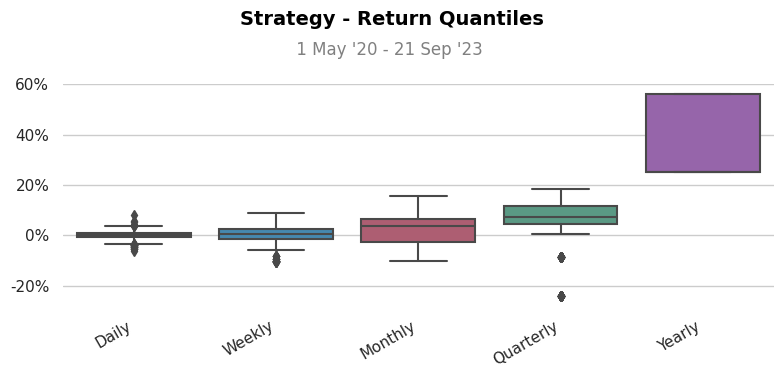

[*********************100%***********************]  1 of 1 completed


Reading Portfolio Transactions from .CSV...
['VOX' 'TMUS' 'ATVI' 'DIS' 'META' 'GOOGL']
Getting data for VOX...
[*********************100%***********************]  1 of 1 completed
Getting data for TMUS...
[*********************100%***********************]  1 of 1 completed
Getting data for ATVI...
[*********************100%***********************]  1 of 1 completed
Getting data for DIS...
[*********************100%***********************]  1 of 1 completed
Getting data for META...
[*********************100%***********************]  1 of 1 completed
Getting data for GOOGL...
[*********************100%***********************]  1 of 1 completed
Determining Active Portfolio...
Calculating Daily Position Snapshots...
Generating Sector Performance Plot
Getting data for SPY...
[*********************100%***********************]  1 of 1 completed


Formatting Returns for QuantStats Library & Plotting Individual Sector Returns...
Generating Report...
[*********************100%***********************]  1 of 1 completed


,Benchmark (SPY),Strategy,Statistics
Start Period,2020-04-30,2020-04-30,Start Period
End Period,2023-09-21,2023-09-21,End Period
Risk-Free Rate,0,0,Risk-Free Rate
Time in Market,1.0,1.0,Time in Market
Cumulative Return,0.51,0.43,Cumulative Return
...,...,...,...
Win Year,0.75,0.75,Win Year
Beta,-,1.09,Beta
Alpha,-,-0.02,Alpha
Correlation,-,0.86%,Correlation


[*********************100%***********************]  1 of 1 completed


,beta,alpha
Date Snapshot,,
2020-04-30,NaN,NaN
2020-05-01,NaN,NaN
2020-05-04,NaN,NaN
2020-05-05,NaN,NaN
2020-05-06,NaN,NaN
...,...,...
2023-09-15,1.170402,-0.000112
2023-09-18,1.171259,-0.000113
2023-09-19,1.172270,-0.000113


,Rolling Sharpe Ratio
Date Snapshot,
2020-04-30,NaN
2020-05-01,NaN
2020-05-04,NaN
2020-05-05,NaN
2020-05-06,NaN
...,...
2023-09-15,2.297470
2023-09-18,2.413978
2023-09-19,2.351424


,Rolling Volatility
Date Snapshot,
2020-04-30,NaN
2020-05-01,NaN
2020-05-04,NaN
2020-05-05,NaN
2020-05-06,NaN
...,...
2023-09-15,0.182946
2023-09-18,0.182440
2023-09-19,0.182339


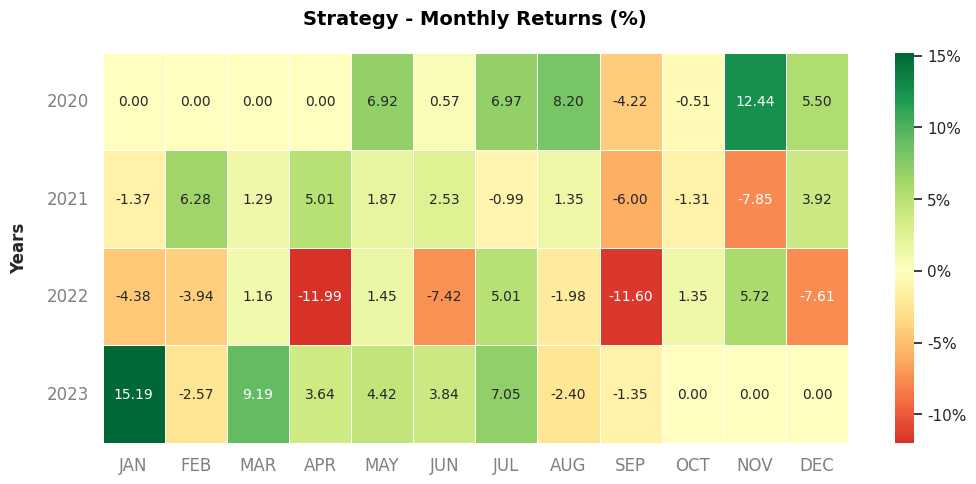

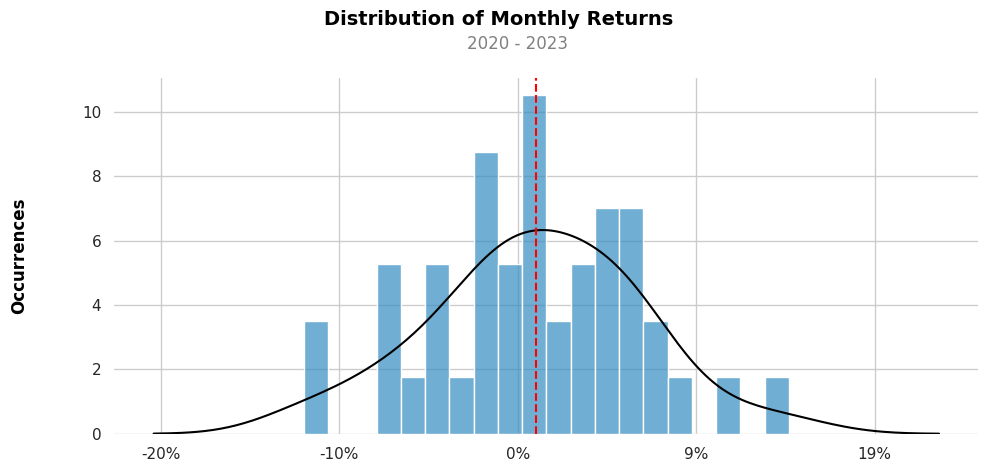

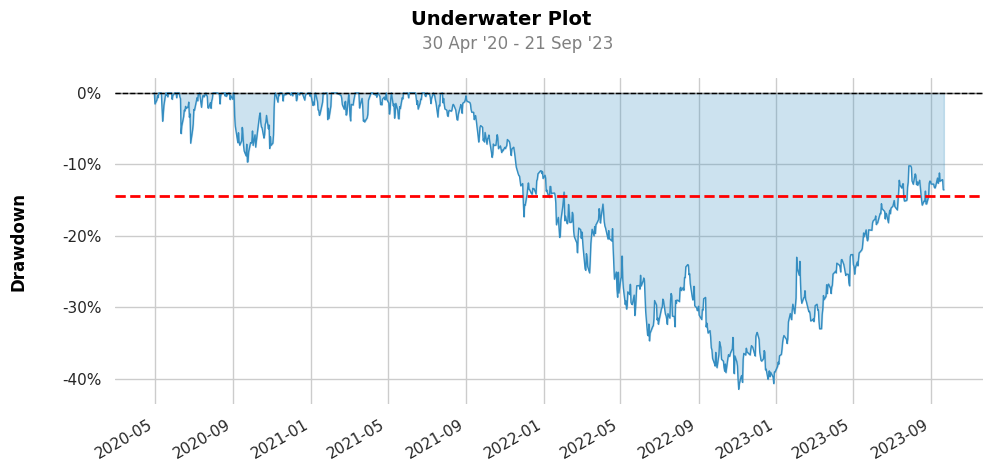

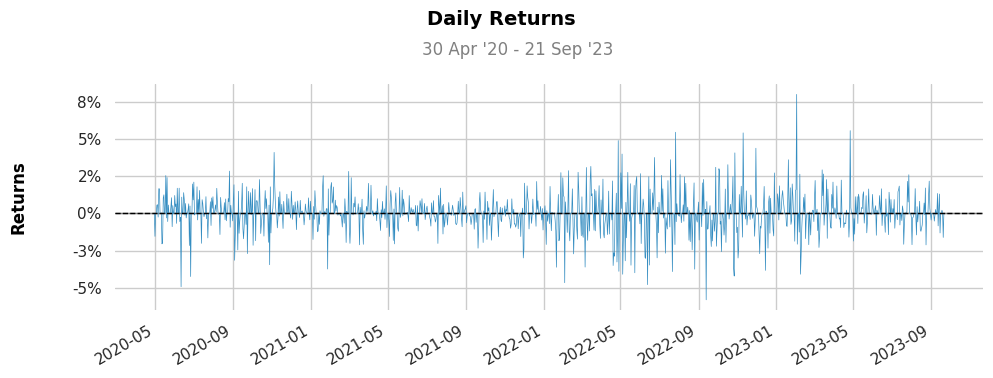

<Figure size 1000x600 with 0 Axes>

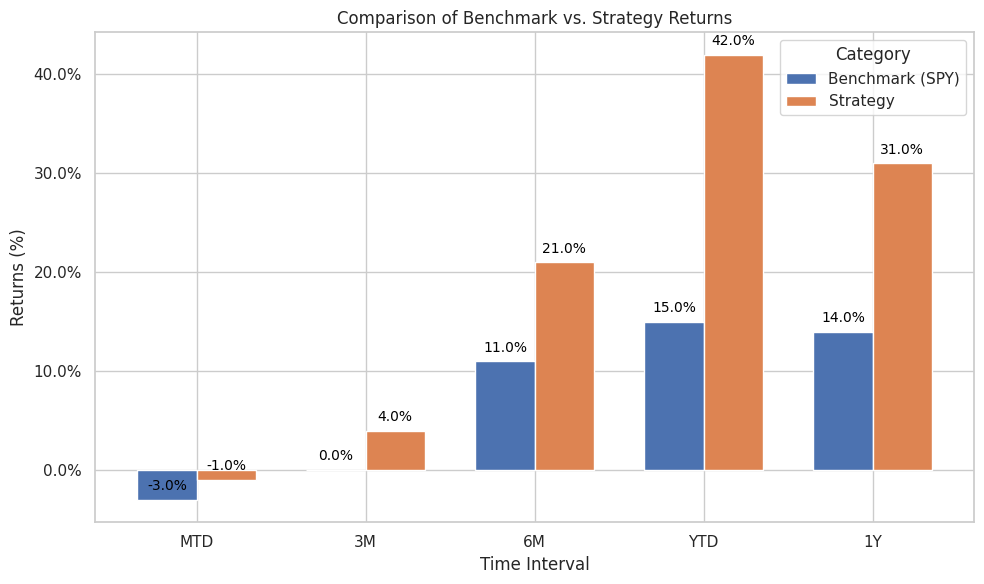

[*********************100%***********************]  1 of 1 completed
[Performance Metrics]

                           Benchmark    Strategy
-------------------------  -----------  ----------
Start Period               2020-04-30   2020-04-30
End Period                 2023-09-21   2023-09-21
Risk-Free Rate             0.0%         0.0%
Time in Market             100.0%       100.0%

Cumulative Return          51.01%       43.44%
CAGR﹪                     8.74%        7.61%

Sharpe                     0.76         0.57
Prob. Sharpe Ratio         91.6%        85.4%
Smart Sharpe               0.74         0.56
Sortino                    1.07         0.83
Smart Sortino              1.04         0.8
Sortino/√2                 0.75         0.58
Smart Sortino/√2           0.73         0.57
Omega                      1.1          1.1

Max Drawdown               -25.36%      -41.5%
Longest DD Days            626          787
Volatility (ann.)          18.3%        23.34%
R^2                   

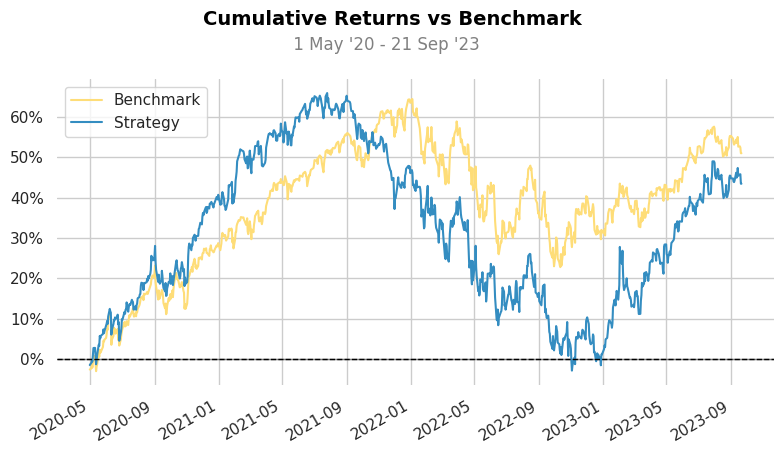

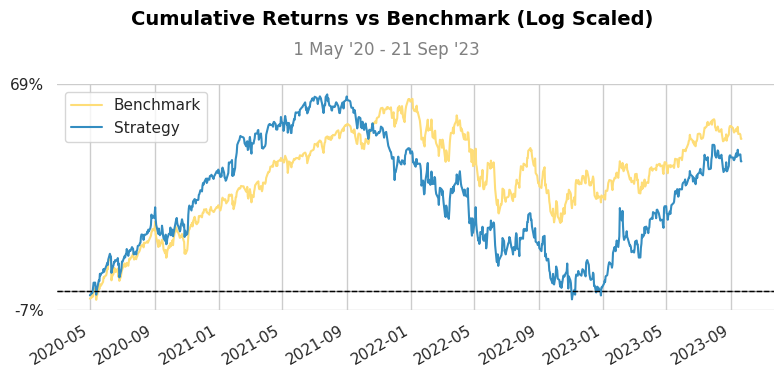

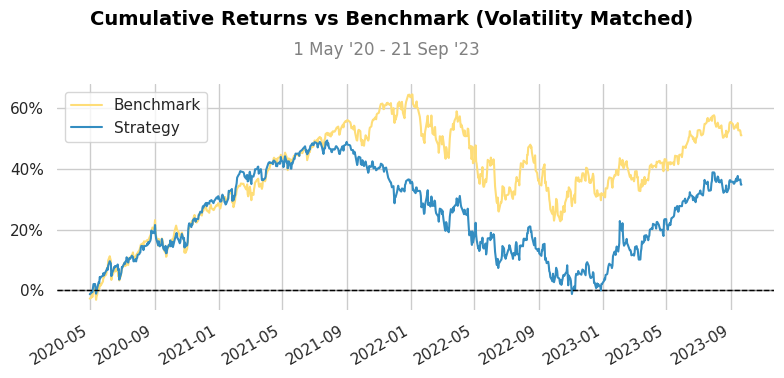

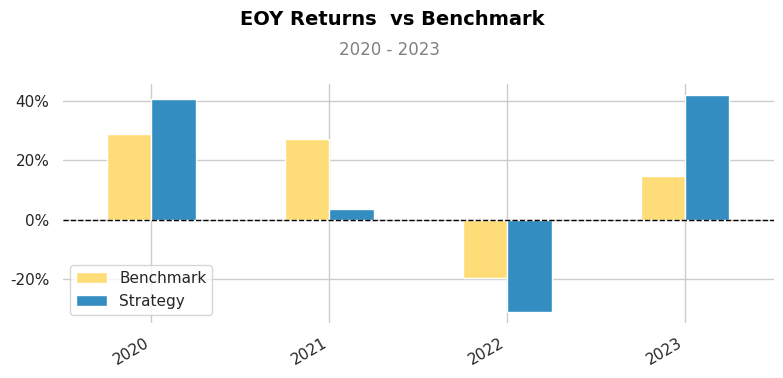

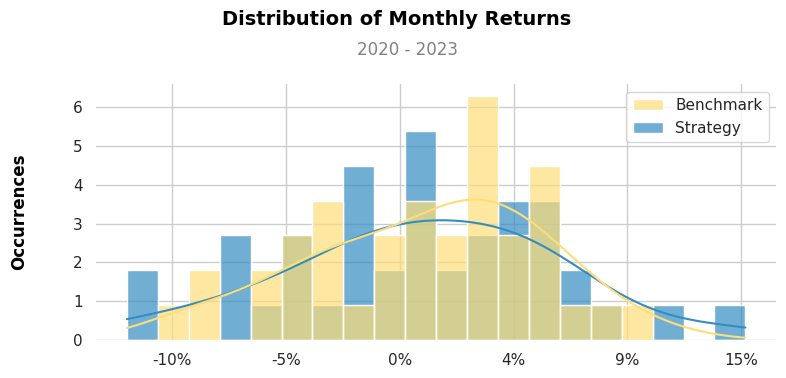

...

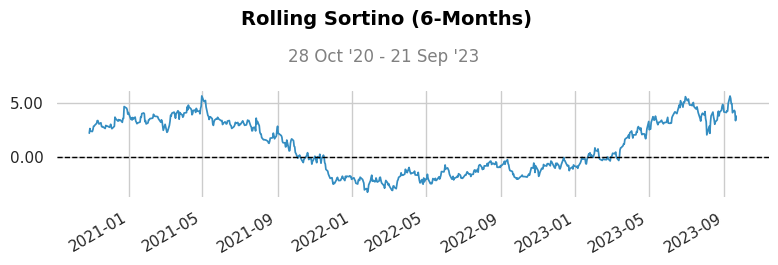

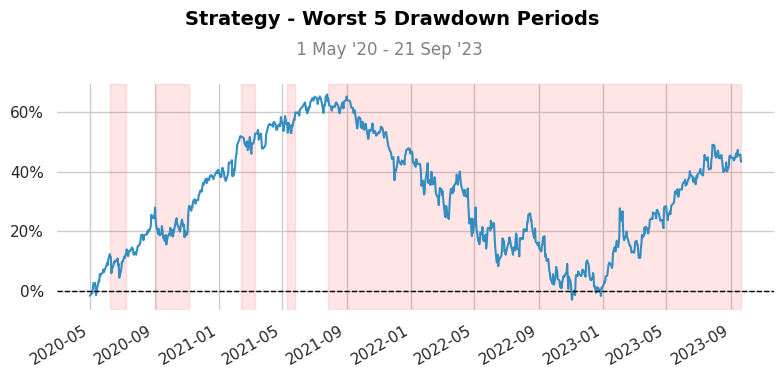

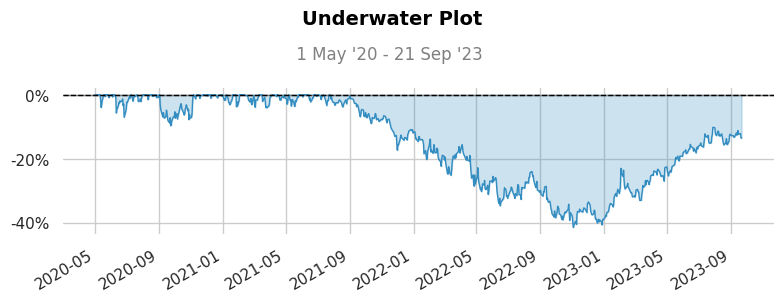

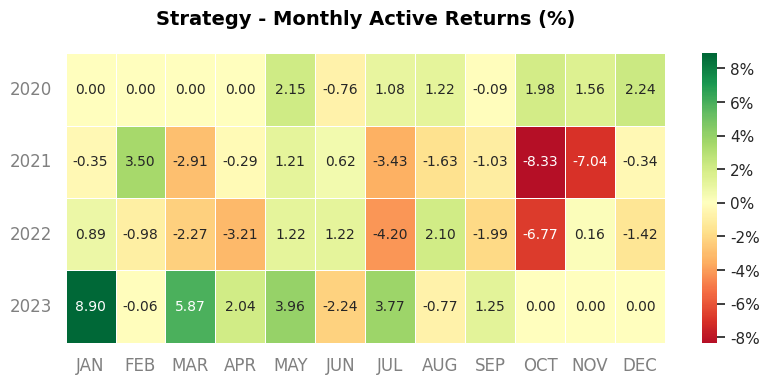

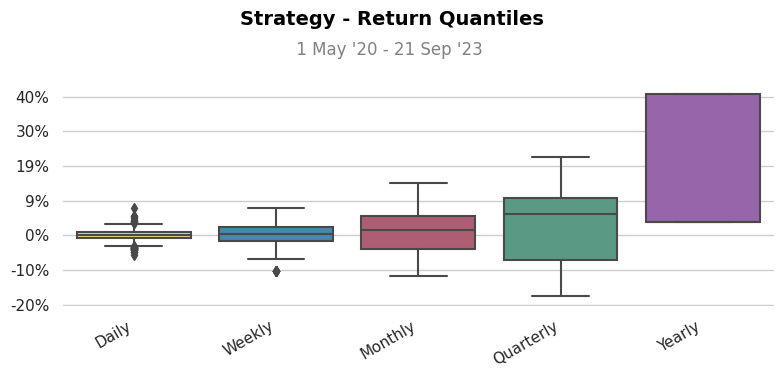

[*********************100%***********************]  1 of 1 completed


Reading Portfolio Transactions from .CSV...
['VIS' 'J' 'CAT' 'ROK' 'UNP']
Getting data for VIS...
[*********************100%***********************]  1 of 1 completed
Getting data for J...
[*********************100%***********************]  1 of 1 completed
Getting data for CAT...
[*********************100%***********************]  1 of 1 completed
Getting data for ROK...
[*********************100%***********************]  1 of 1 completed
Getting data for UNP...
[*********************100%***********************]  1 of 1 completed
Determining Active Portfolio...
Calculating Daily Position Snapshots...
Generating Sector Performance Plot
Getting data for SPY...
[*********************100%***********************]  1 of 1 completed


Formatting Returns for QuantStats Library & Plotting Individual Sector Returns...
Generating Report...
[*********************100%***********************]  1 of 1 completed


,Benchmark (SPY),Strategy,Statistics
Start Period,2020-04-30,2020-04-30,Start Period
End Period,2023-09-21,2023-09-21,End Period
Risk-Free Rate,0,0,Risk-Free Rate
Time in Market,1.0,1.0,Time in Market
Cumulative Return,0.51,0.86,Cumulative Return
...,...,...,...
Win Year,0.75,0.75,Win Year
Beta,-,0.98,Beta
Alpha,-,0.07,Alpha
Correlation,-,0.8%,Correlation


[*********************100%***********************]  1 of 1 completed


,beta,alpha
Date Snapshot,,
2020-04-30,NaN,NaN
2020-05-01,NaN,NaN
2020-05-04,NaN,NaN
2020-05-05,NaN,NaN
2020-05-06,NaN,NaN
...,...,...
2023-09-15,1.010805,0.000272
2023-09-18,1.010407,0.000272
2023-09-19,1.006290,0.000274


,Rolling Sharpe Ratio
Date Snapshot,
2020-04-30,NaN
2020-05-01,NaN
2020-05-04,NaN
2020-05-05,NaN
2020-05-06,NaN
...,...
2023-09-15,1.611358
2023-09-18,1.970765
2023-09-19,1.743644


,Rolling Volatility
Date Snapshot,
2020-04-30,NaN
2020-05-01,NaN
2020-05-04,NaN
2020-05-05,NaN
2020-05-06,NaN
...,...
2023-09-15,0.177595
2023-09-18,0.174155
2023-09-19,0.173032


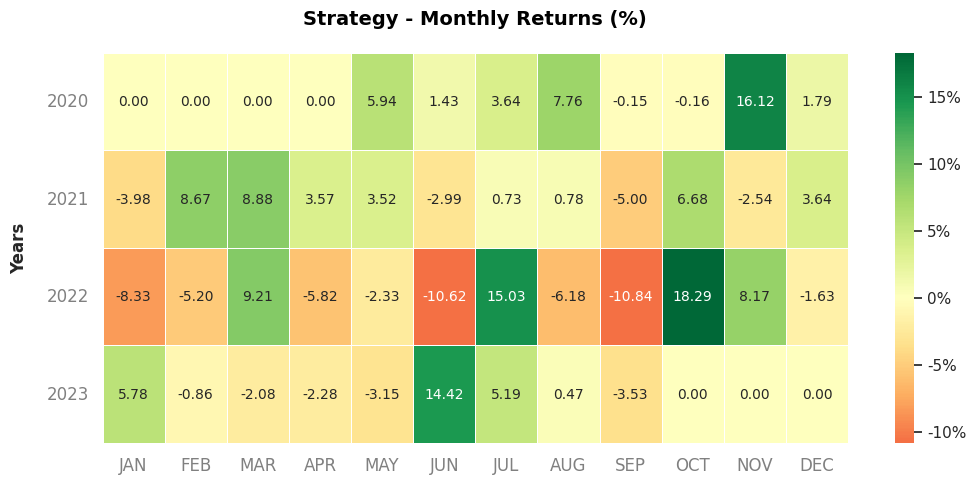

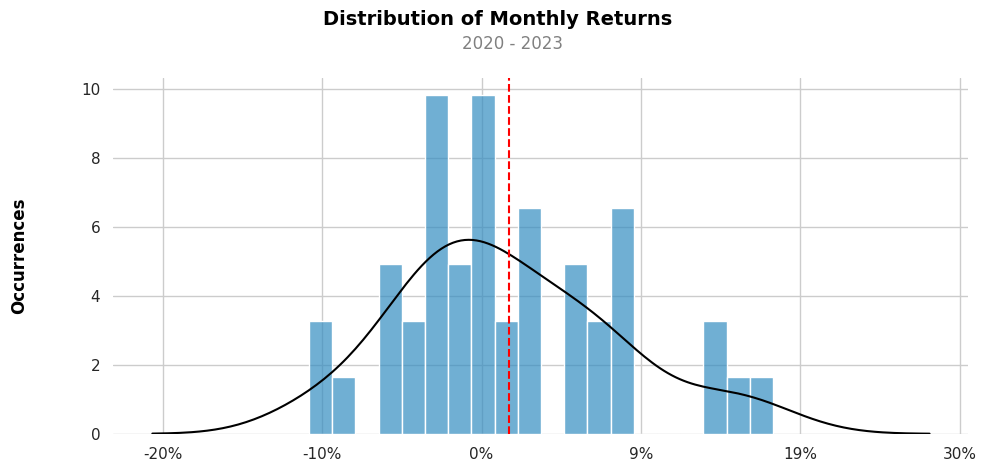

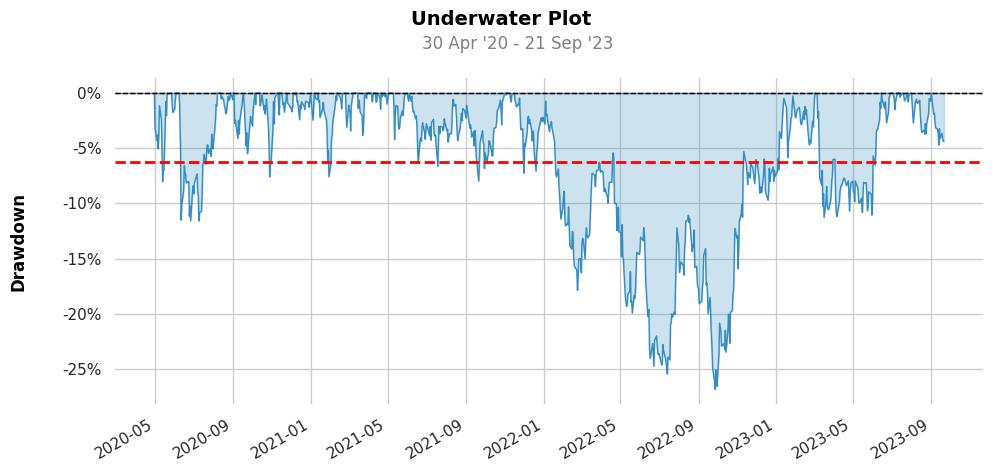

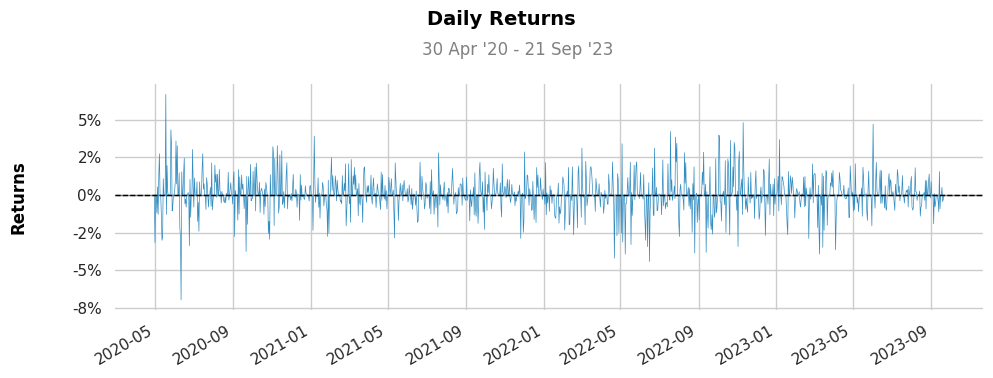

<Figure size 1000x600 with 0 Axes>

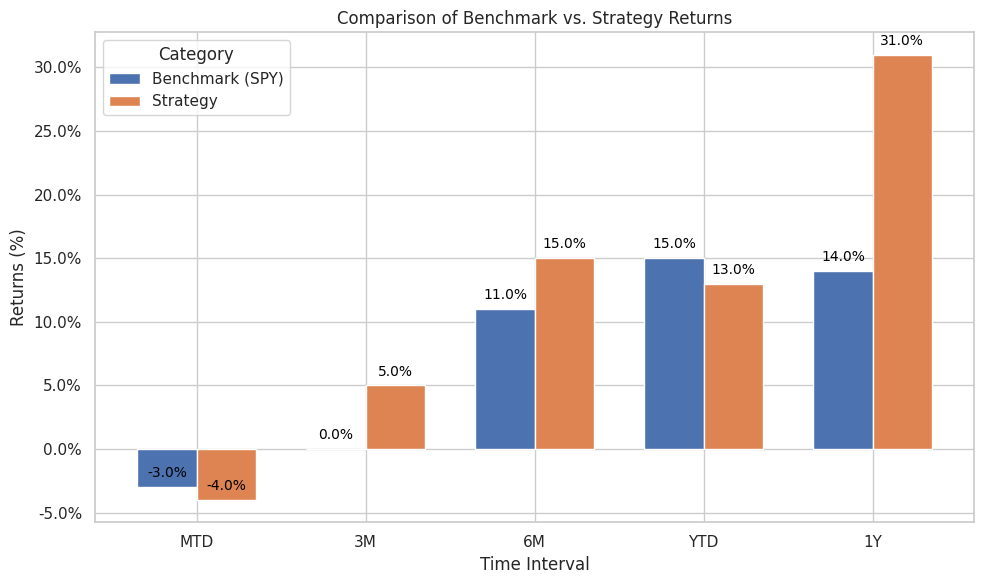

[*********************100%***********************]  1 of 1 completed
[Performance Metrics]

                           Benchmark    Strategy
-------------------------  -----------  ----------
Start Period               2020-04-30   2020-04-30
End Period                 2023-09-21   2023-09-21
Risk-Free Rate             0.0%         0.0%
Time in Market             100.0%       100.0%

Cumulative Return          51.01%       86.07%
CAGR﹪                     8.74%        13.46%

Sharpe                     0.76         0.93
Prob. Sharpe Ratio         91.6%        95.58%
Smart Sharpe               0.74         0.9
Sortino                    1.07         1.37
Smart Sortino              1.04         1.33
Sortino/√2                 0.75         0.97
Smart Sortino/√2           0.73         0.94
Omega                      1.17         1.17

Max Drawdown               -25.36%      -26.84%
Longest DD Days            626          471
Volatility (ann.)          18.3%        22.47%
R^2               

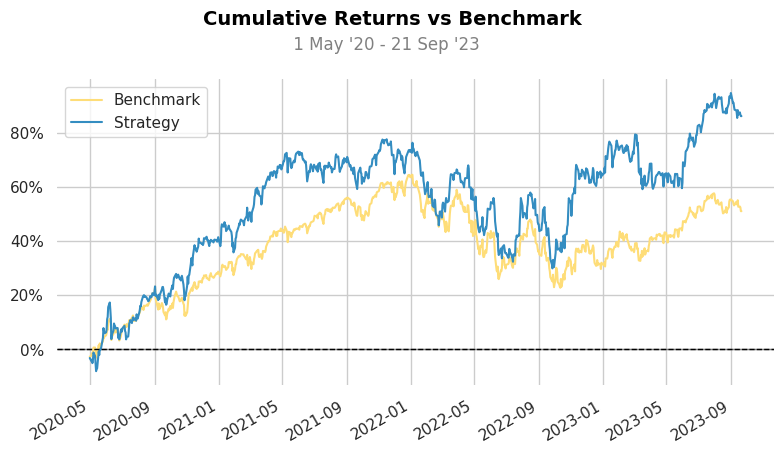

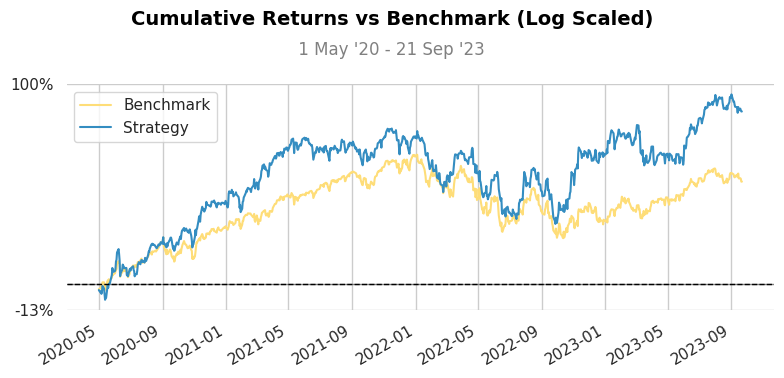

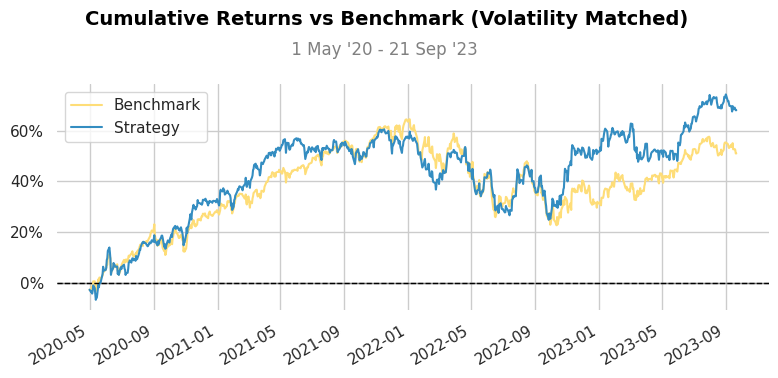

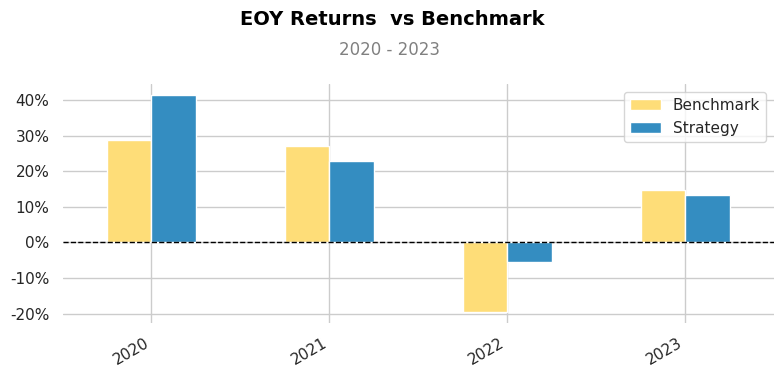

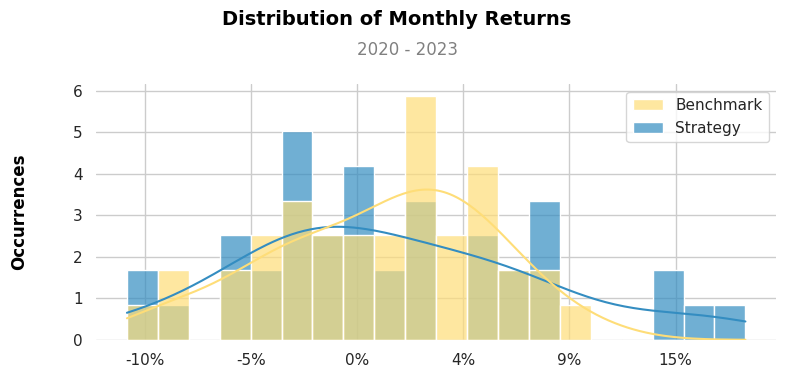

...

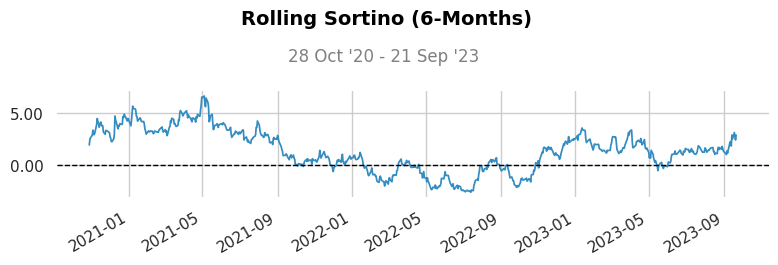

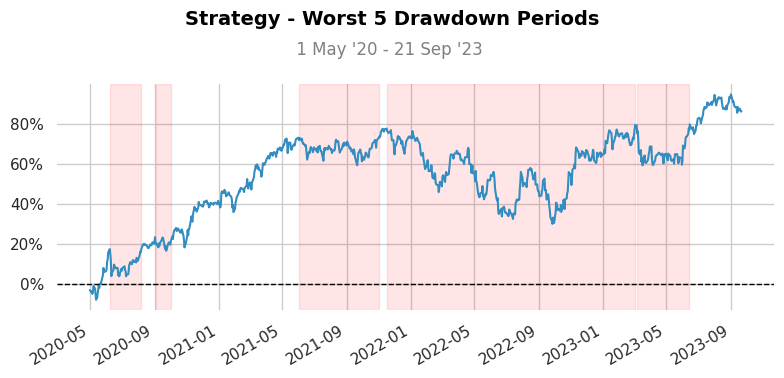

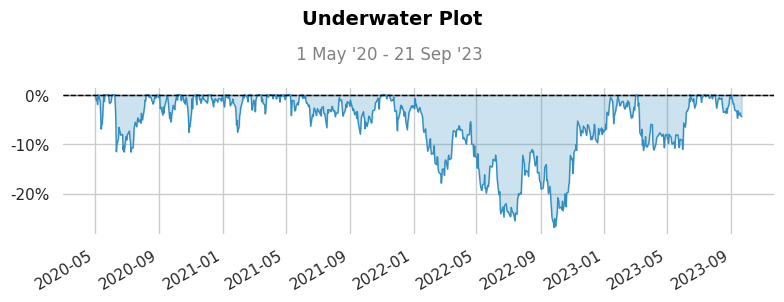

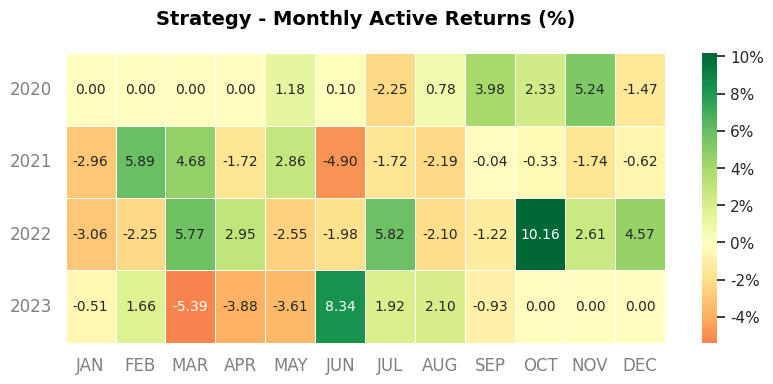

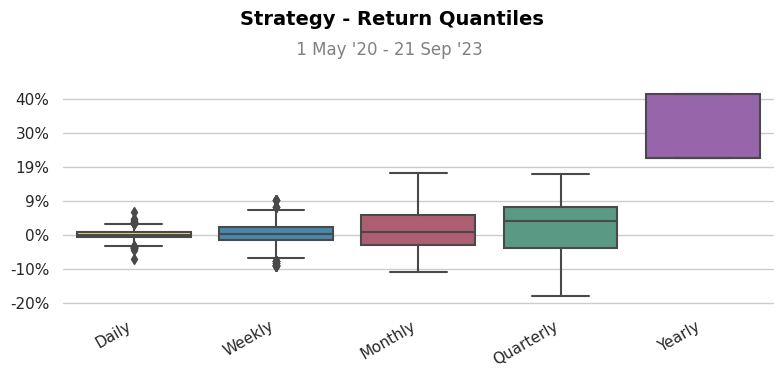

[*********************100%***********************]  1 of 1 completed


Reading Portfolio Transactions from .CSV...
['VDC' 'WMT']
Getting data for VDC...
[*********************100%***********************]  1 of 1 completed
Getting data for WMT...
[*********************100%***********************]  1 of 1 completed
Determining Active Portfolio...
Calculating Daily Position Snapshots...
Generating Sector Performance Plot
Getting data for SPY...
[*********************100%***********************]  1 of 1 completed


Formatting Returns for QuantStats Library & Plotting Individual Sector Returns...
Generating Report...
[*********************100%***********************]  1 of 1 completed


,Benchmark (SPY),Strategy,Statistics
Start Period,2020-04-30,2020-04-30,Start Period
End Period,2023-09-21,2023-09-21,End Period
Risk-Free Rate,0,0,Risk-Free Rate
Time in Market,1.0,1.0,Time in Market
Cumulative Return,0.51,0.41,Cumulative Return
...,...,...,...
Win Year,0.75,0.75,Win Year
Beta,-,0.54,Beta
Alpha,-,0.03,Alpha
Correlation,-,0.72%,Correlation


[*********************100%***********************]  1 of 1 completed


,beta,alpha
Date Snapshot,,
2020-04-30,NaN,NaN
2020-05-01,NaN,NaN
2020-05-04,NaN,NaN
2020-05-05,NaN,NaN
2020-05-06,NaN,NaN
...,...,...
2023-09-15,0.537527,0.000142
2023-09-18,0.536501,0.000143
2023-09-19,0.539359,0.000141


,Rolling Sharpe Ratio
Date Snapshot,
2020-04-30,NaN
2020-05-01,NaN
2020-05-04,NaN
2020-05-05,NaN
2020-05-06,NaN
...,...
2023-09-15,0.978866
2023-09-18,1.120597
2023-09-19,0.787162


,Rolling Volatility
Date Snapshot,
2020-04-30,NaN
2020-05-01,NaN
2020-05-04,NaN
2020-05-05,NaN
2020-05-06,NaN
...,...
2023-09-15,0.093911
2023-09-18,0.093404
2023-09-19,0.091634


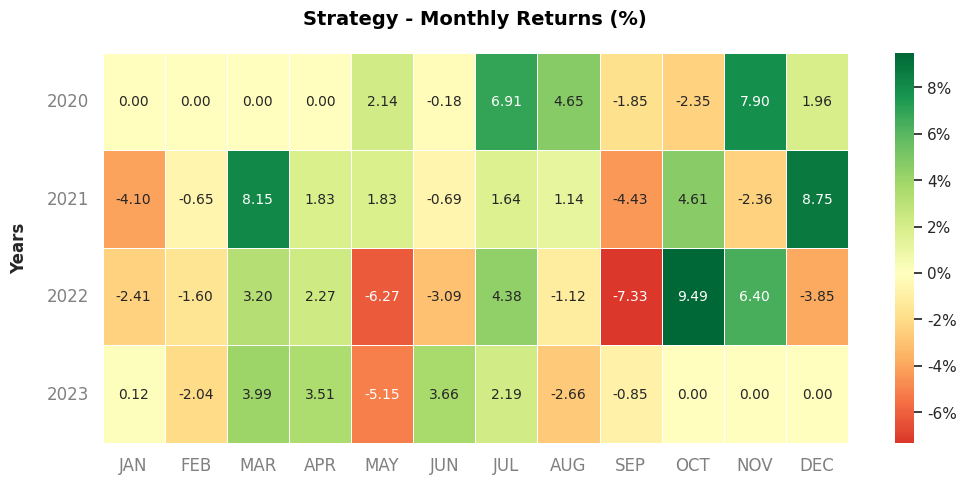

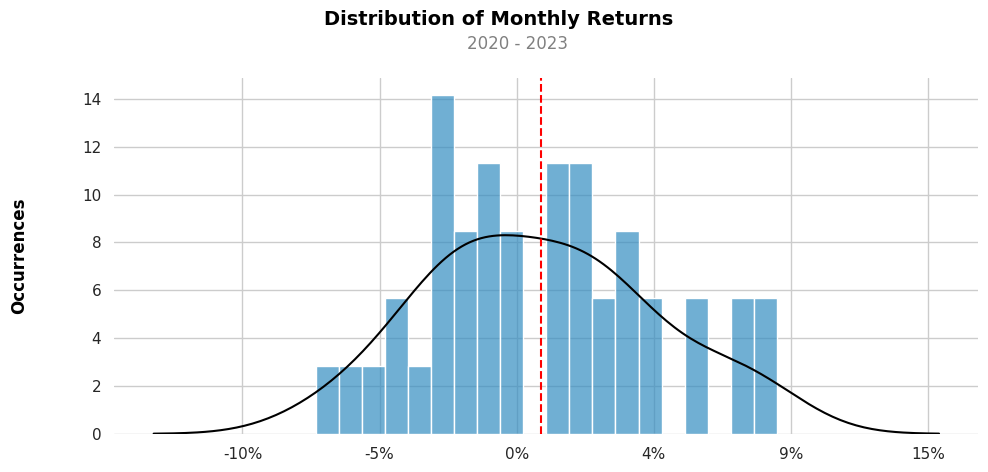

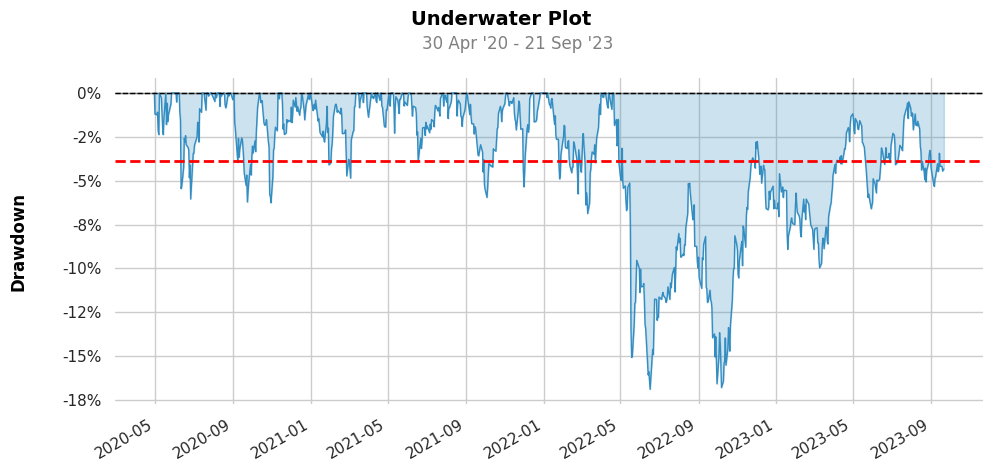

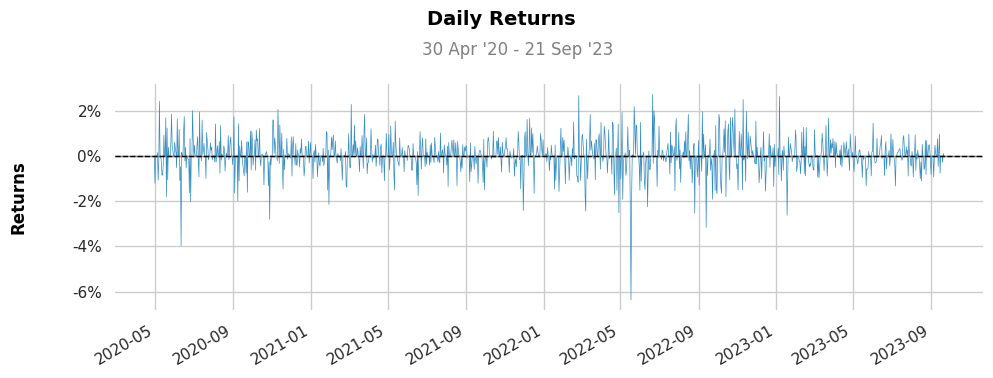

<Figure size 1000x600 with 0 Axes>

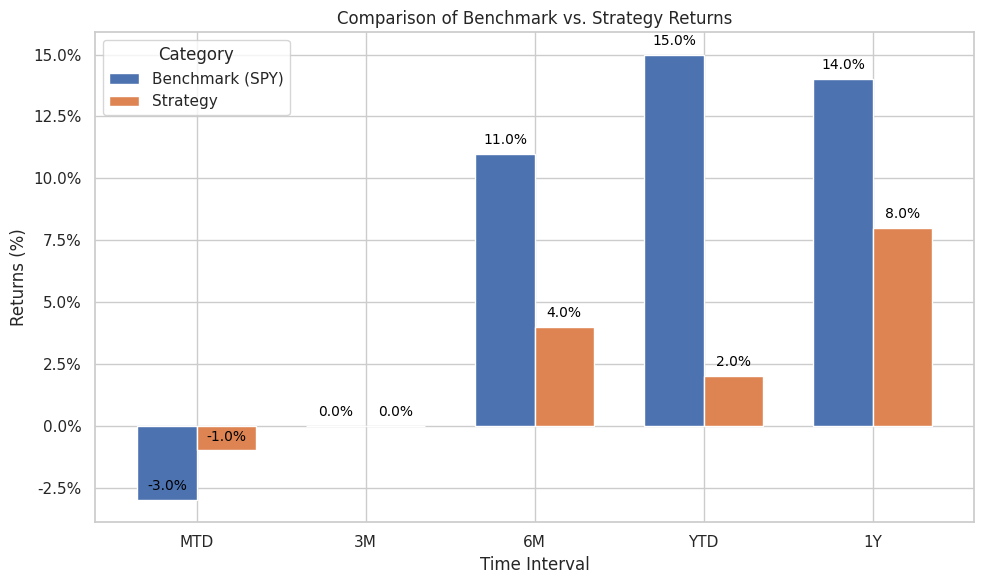

[*********************100%***********************]  1 of 1 completed
[Performance Metrics]

                           Benchmark    Strategy
-------------------------  -----------  ----------
Start Period               2020-04-30   2020-04-30
End Period                 2023-09-21   2023-09-21
Risk-Free Rate             0.0%         0.0%
Time in Market             100.0%       100.0%

Cumulative Return          51.01%       40.61%
CAGR﹪                     8.74%        7.18%

Sharpe                     0.76         0.79
Prob. Sharpe Ratio         91.6%        92.44%
Smart Sharpe               0.74         0.78
Sortino                    1.07         1.11
Smart Sortino              1.04         1.08
Sortino/√2                 0.75         0.78
Smart Sortino/√2           0.74         0.77
Omega                      1.15         1.15

Max Drawdown               -25.36%      -16.88%
Longest DD Days            626          519
Volatility (ann.)          18.3%        13.89%
R^2               

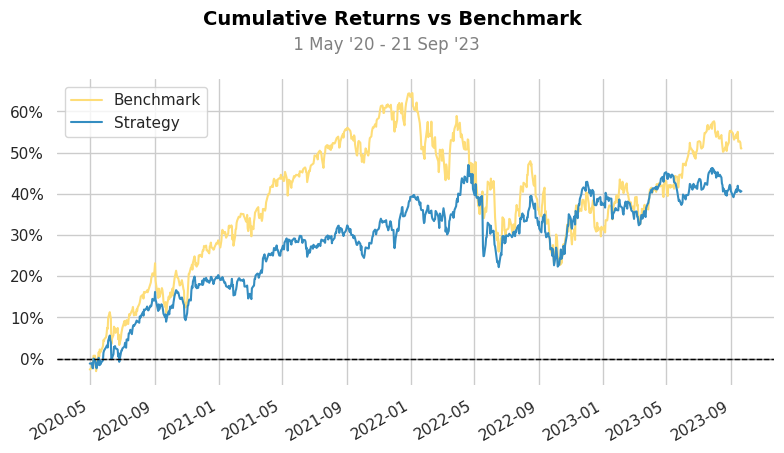

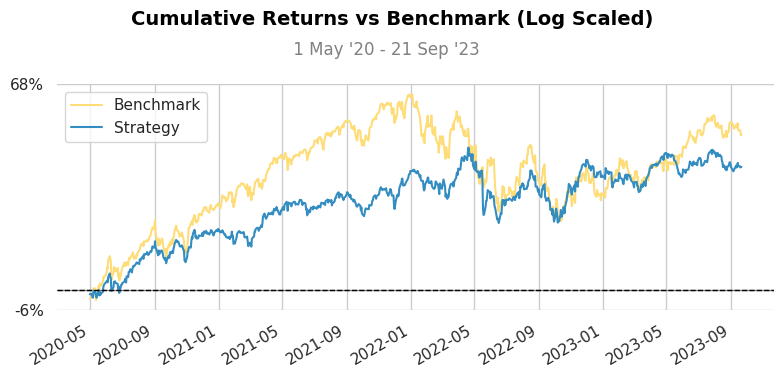

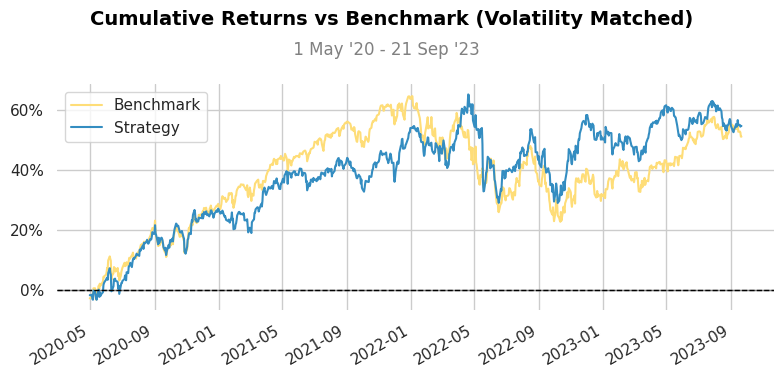

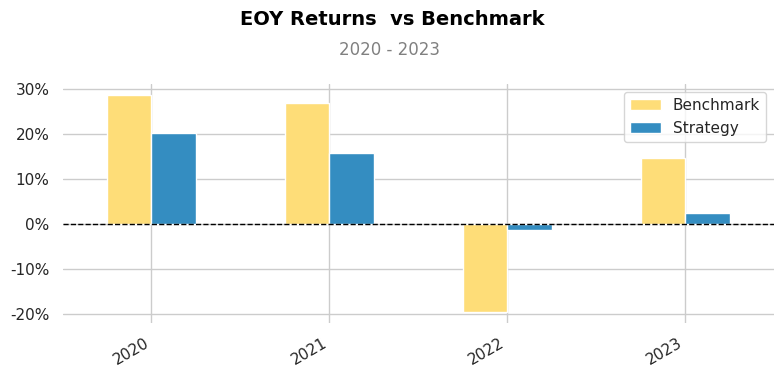

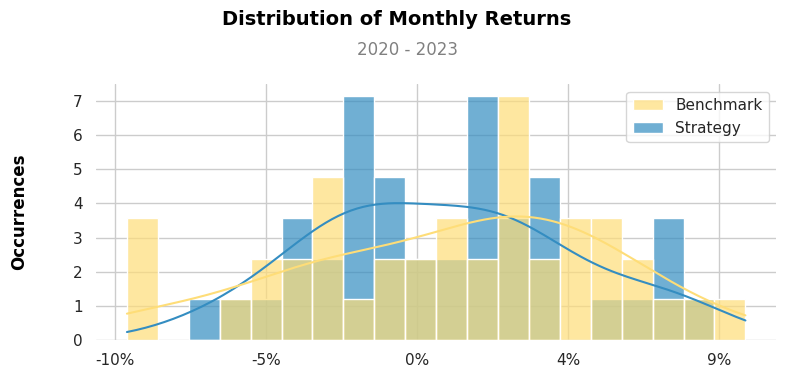

...

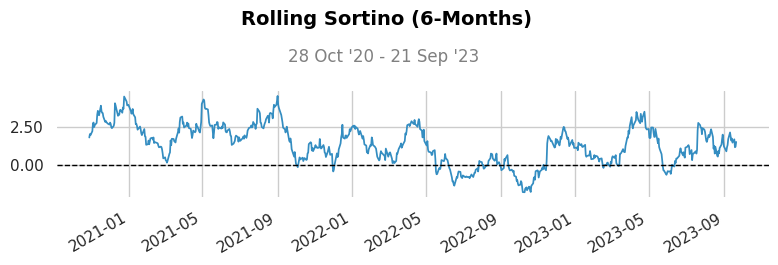

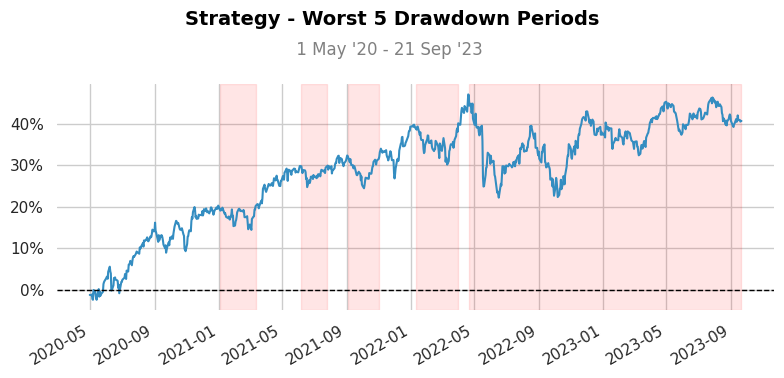

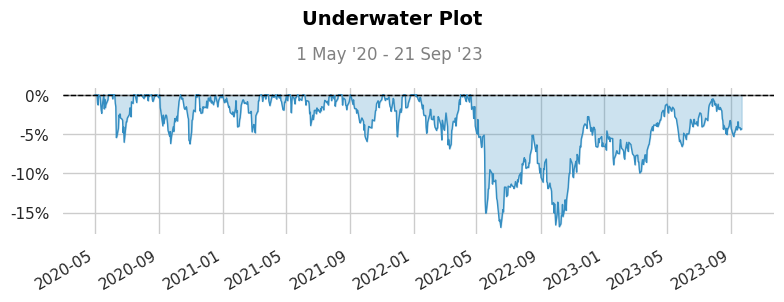

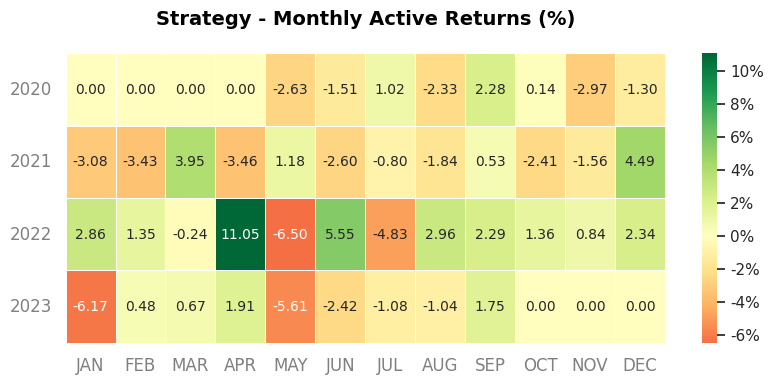

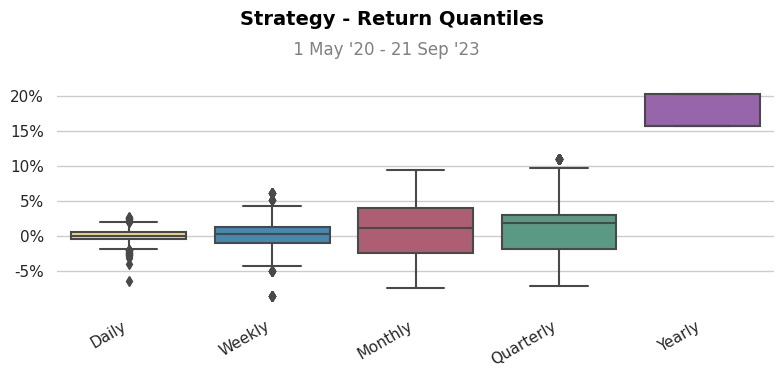

[*********************100%***********************]  1 of 1 completed


Reading Portfolio Transactions from .CSV...
['VPU' 'AEP' 'SRE' 'AES' 'NEE' 'UGI' 'AWK']
Getting data for VPU...
[*********************100%***********************]  1 of 1 completed
Getting data for AEP...
[*********************100%***********************]  1 of 1 completed
Getting data for SRE...
[*********************100%***********************]  1 of 1 completed
Getting data for AES...
[*********************100%***********************]  1 of 1 completed
Getting data for NEE...
[*********************100%***********************]  1 of 1 completed
Getting data for UGI...
[*********************100%***********************]  1 of 1 completed
Getting data for AWK...
[*********************100%***********************]  1 of 1 completed
Determining Active Portfolio...
Calculating Daily Position Snapshots...
Generating Sector Performance Plot
Getting data for SPY...
[*********************100%***********************]  1 of 1 completed


Formatting Returns for QuantStats Library & Plotting Individual Sector Returns...
Generating Report...
[*********************100%***********************]  1 of 1 completed


,Benchmark (SPY),Strategy,Statistics
Start Period,2020-04-30,2020-04-30,Start Period
End Period,2023-09-21,2023-09-21,End Period
Risk-Free Rate,0,0,Risk-Free Rate
Time in Market,1.0,1.0,Time in Market
Cumulative Return,0.51,0.2,Cumulative Return
...,...,...,...
Win Year,0.75,0.5,Win Year
Beta,-,0.63,Beta
Alpha,-,-0.02,Alpha
Correlation,-,0.6%,Correlation


[*********************100%***********************]  1 of 1 completed


,beta,alpha
Date Snapshot,,
2020-04-30,NaN,NaN
2020-05-01,NaN,NaN
2020-05-04,NaN,NaN
2020-05-05,NaN,NaN
2020-05-06,NaN,NaN
...,...,...
2023-09-15,0.734817,-0.000119
2023-09-18,0.728671,-0.000116
2023-09-19,0.729474,-0.000117


,Rolling Sharpe Ratio
Date Snapshot,
2020-04-30,NaN
2020-05-01,NaN
2020-05-04,NaN
2020-05-05,NaN
2020-05-06,NaN
...,...
2023-09-15,-0.581141
2023-09-18,-0.467942
2023-09-19,-0.654369


,Rolling Volatility
Date Snapshot,
2020-04-30,NaN
2020-05-01,NaN
2020-05-04,NaN
2020-05-05,NaN
2020-05-06,NaN
...,...
2023-09-15,0.152383
2023-09-18,0.151839
2023-09-19,0.151542


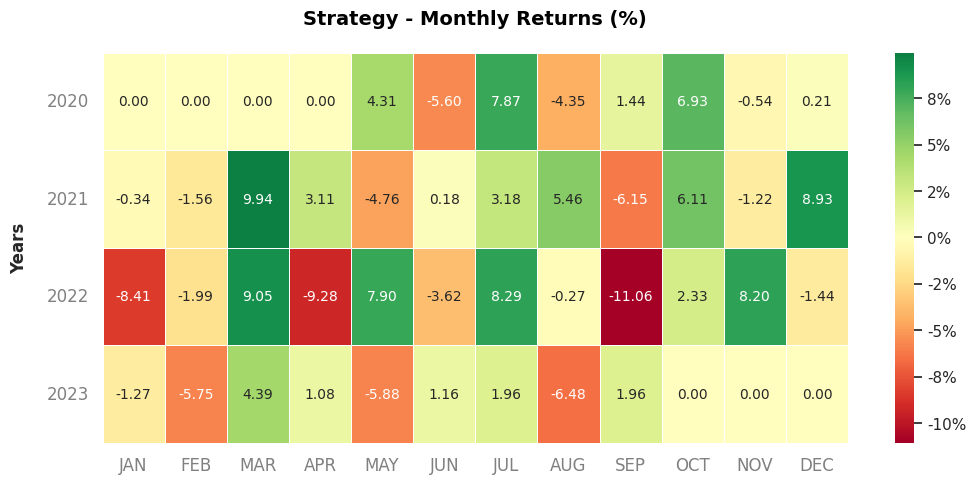

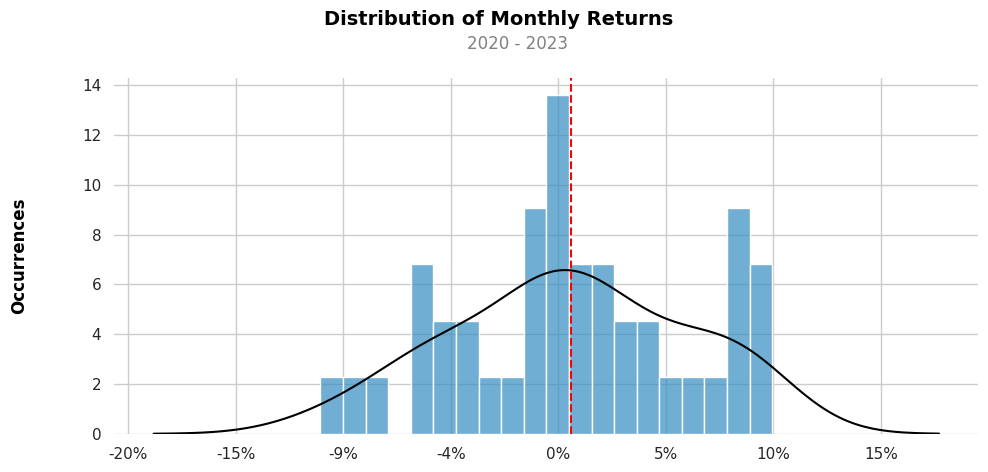

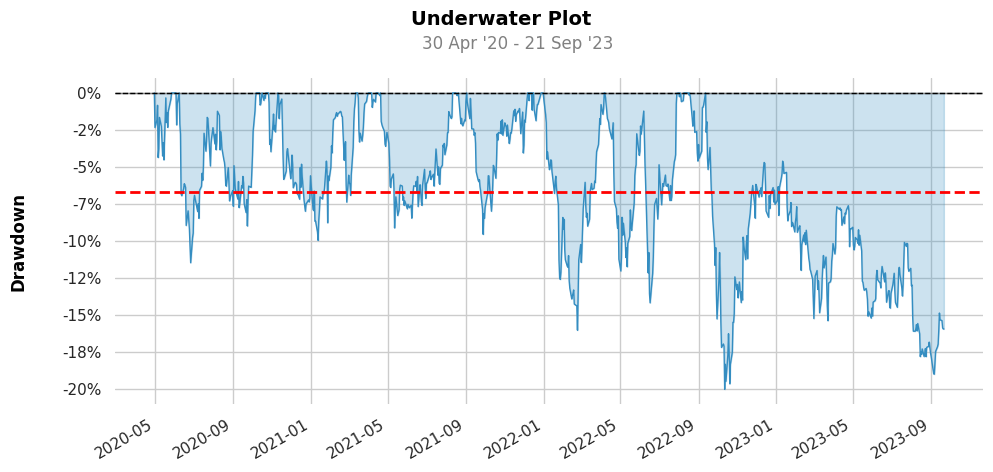

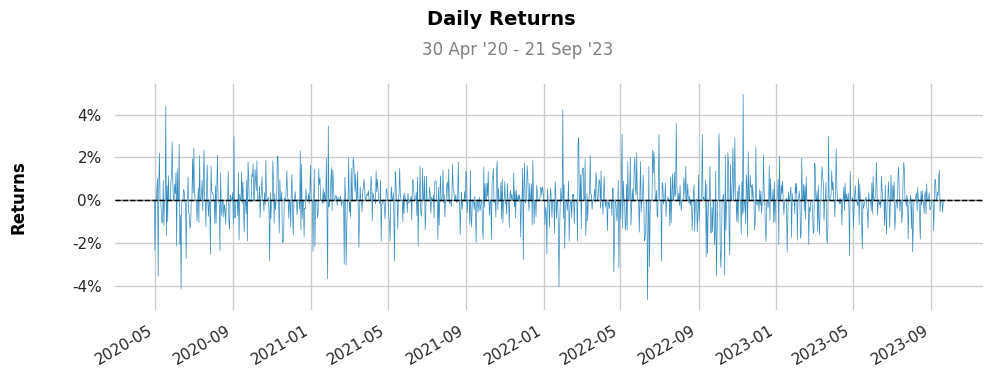

<Figure size 1000x600 with 0 Axes>

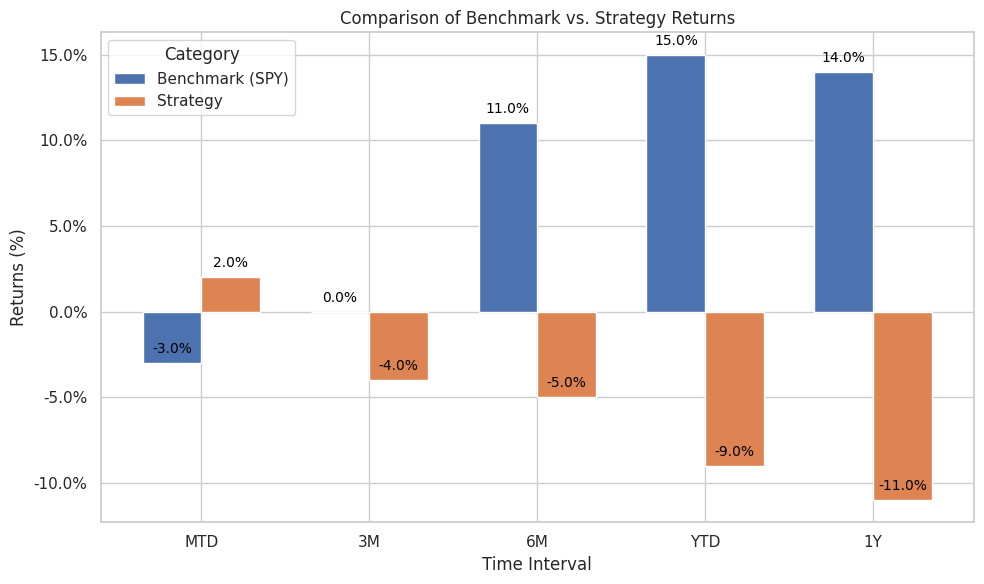

[*********************100%***********************]  1 of 1 completed
[Performance Metrics]

                           Benchmark    Strategy
-------------------------  -----------  ----------
Start Period               2020-04-30   2020-04-30
End Period                 2023-09-21   2023-09-21
Risk-Free Rate             0.0%         0.0%
Time in Market             100.0%       100.0%

Cumulative Return          51.01%       19.57%
CAGR﹪                     8.74%        3.7%

Sharpe                     0.76         0.37
Prob. Sharpe Ratio         91.6%        75.09%
Smart Sharpe               0.74         0.36
Sortino                    1.07         0.52
Smart Sortino              1.05         0.51
Sortino/√2                 0.75         0.37
Smart Sortino/√2           0.74         0.36
Omega                      1.06         1.06

Max Drawdown               -25.36%      -20.02%
Longest DD Days            626          374
Volatility (ann.)          18.3%        19.4%
R^2                 

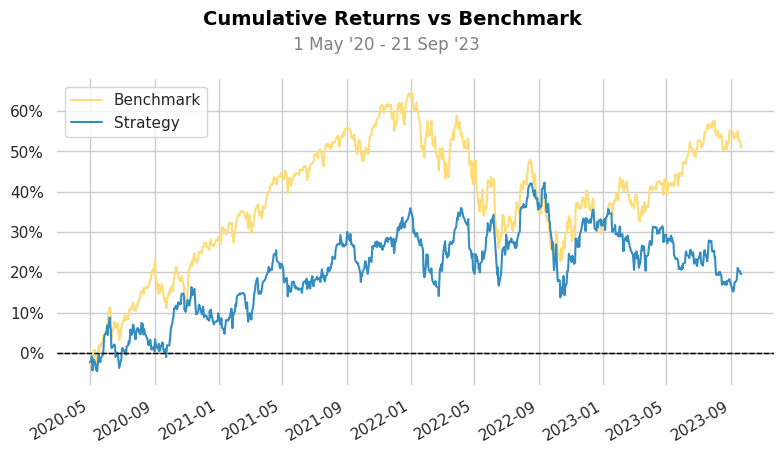

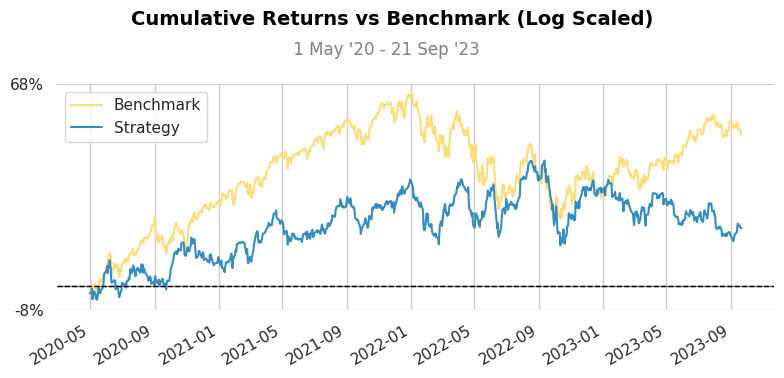

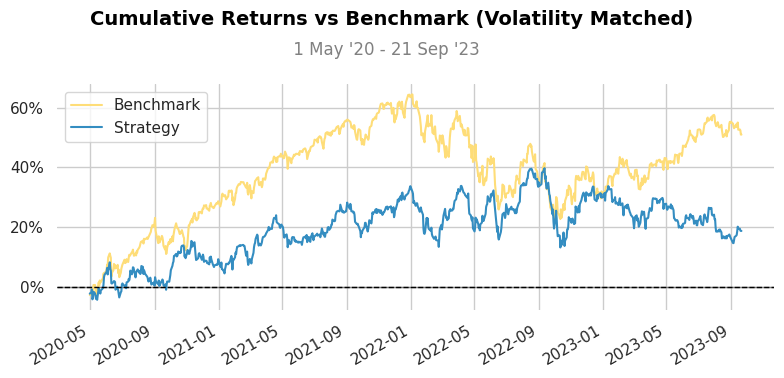

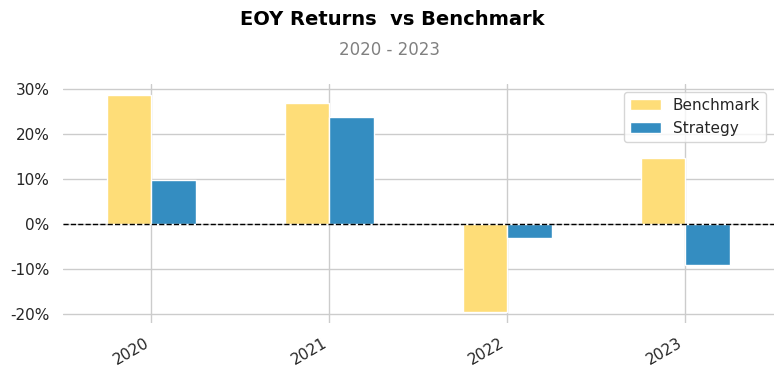

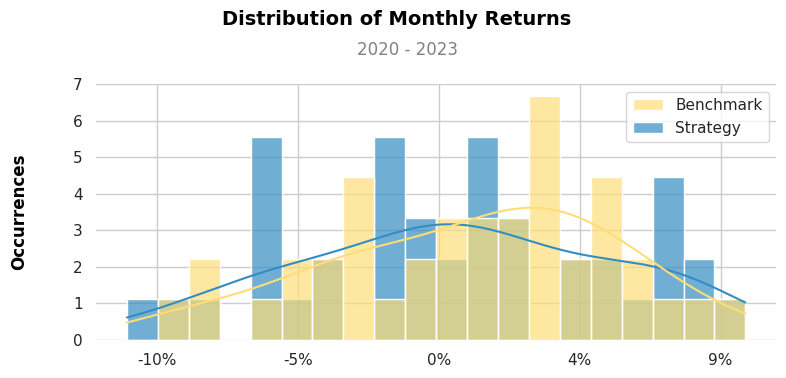

...

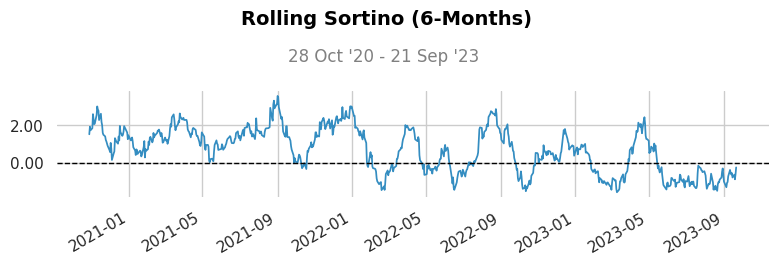

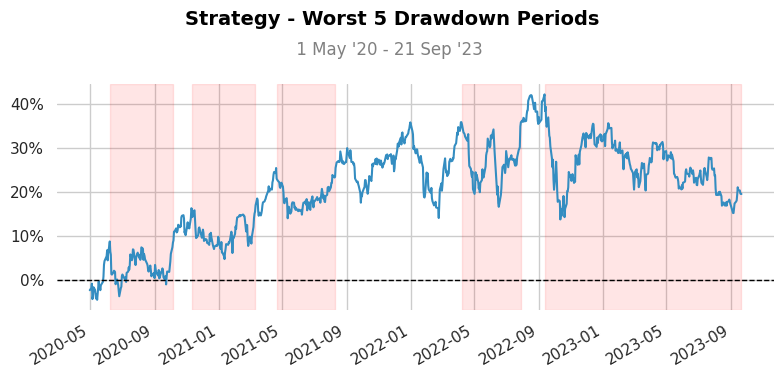

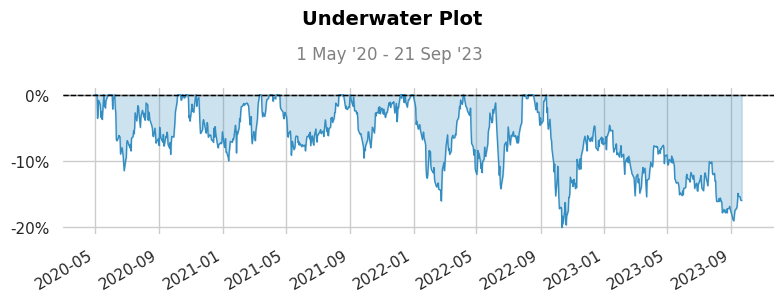

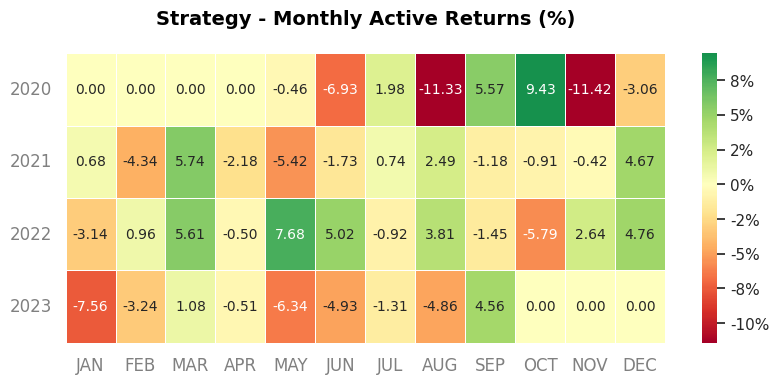

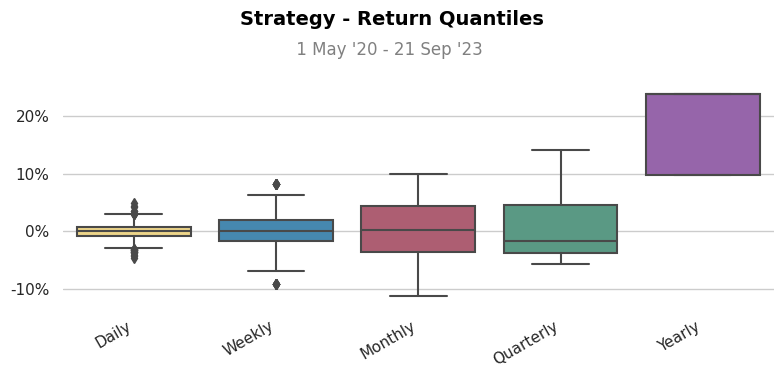

[*********************100%***********************]  1 of 1 completed


Reading Portfolio Transactions from .CSV...
['VAW' 'SLGN']
Getting data for VAW...
[*********************100%***********************]  1 of 1 completed
Getting data for SLGN...
[*********************100%***********************]  1 of 1 completed
Determining Active Portfolio...
Calculating Daily Position Snapshots...
Generating Sector Performance Plot
Getting data for SPY...
[*********************100%***********************]  1 of 1 completed


Formatting Returns for QuantStats Library & Plotting Individual Sector Returns...
Generating Report...
[*********************100%***********************]  1 of 1 completed


,Benchmark (SPY),Strategy,Statistics
Start Period,2022-11-02,2022-11-02,Start Period
End Period,2023-09-21,2023-09-21,End Period
Risk-Free Rate,0,0,Risk-Free Rate
Time in Market,0.99,1.0,Time in Market
Cumulative Return,0.17,0.11,Cumulative Return
...,...,...,...
Win Year,1.0,1.0,Win Year
Beta,-,0.99,Beta
Alpha,-,-0.05,Alpha
Correlation,-,0.81%,Correlation


[*********************100%***********************]  1 of 1 completed


,beta,alpha
Date Snapshot,,
2022-11-02,NaN,NaN
2022-11-03,NaN,NaN
2022-11-04,NaN,NaN
2022-11-07,NaN,NaN
2022-11-08,NaN,NaN
...,...,...
2023-09-15,NaN,NaN
2023-09-18,NaN,NaN
2023-09-19,NaN,NaN


,Rolling Sharpe Ratio
Date Snapshot,
2022-11-02,NaN
2022-11-03,NaN
2022-11-04,NaN
2022-11-07,NaN
2022-11-08,NaN
...,...
2023-09-15,0.614069
2023-09-18,0.785027
2023-09-19,0.519762


,Rolling Volatility
Date Snapshot,
2022-11-02,NaN
2022-11-03,NaN
2022-11-04,NaN
2022-11-07,NaN
2022-11-08,NaN
...,...
2023-09-15,0.160666
2023-09-18,0.158993
2023-09-19,0.156589


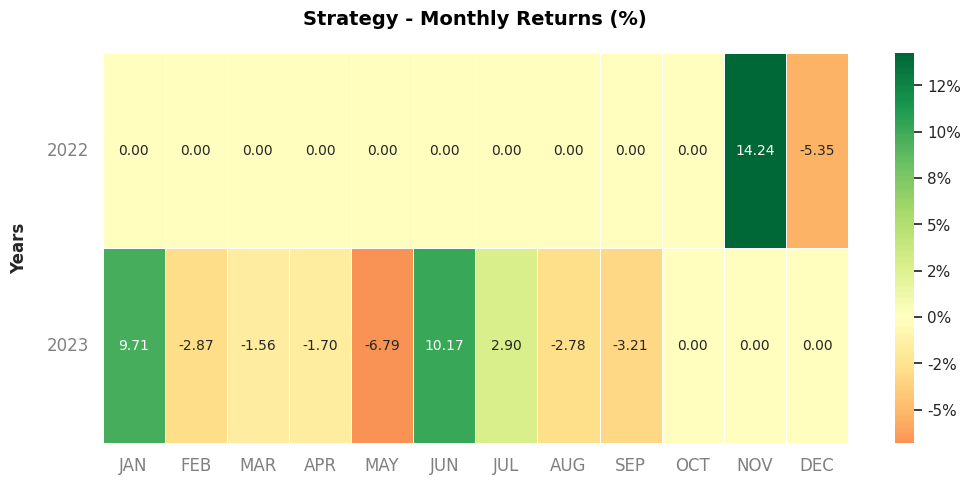

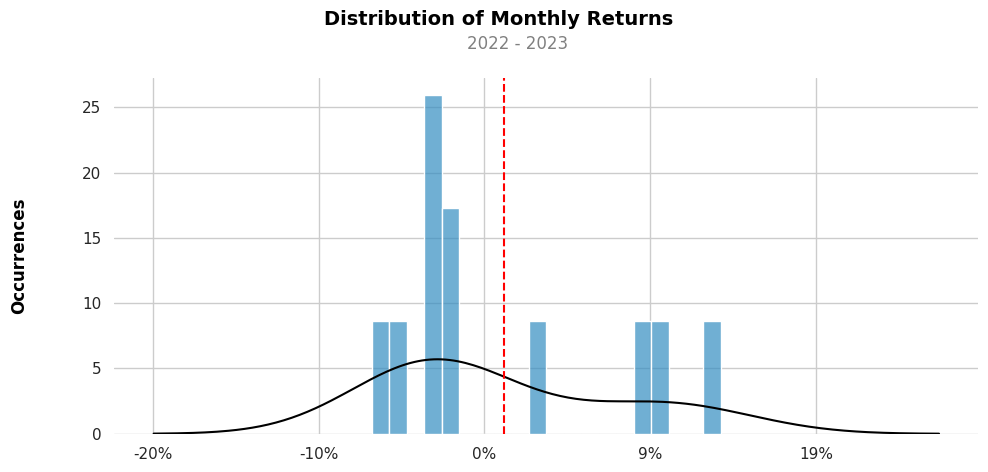

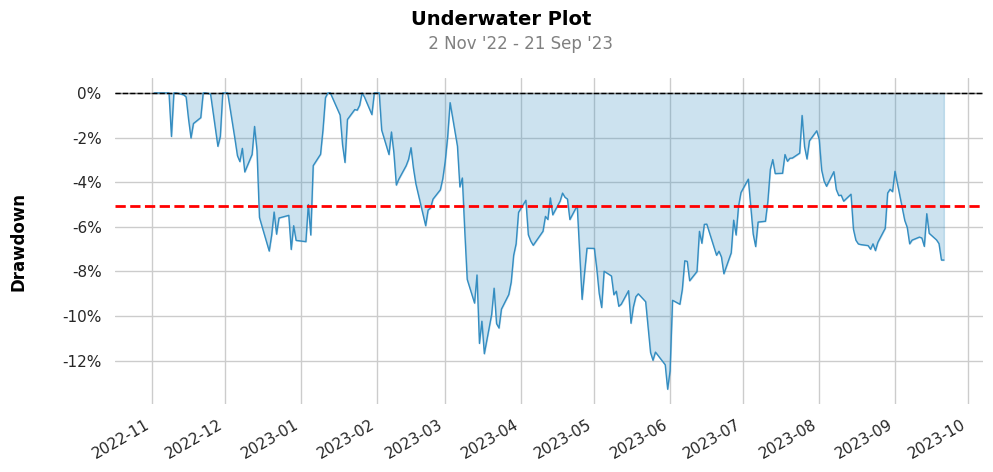

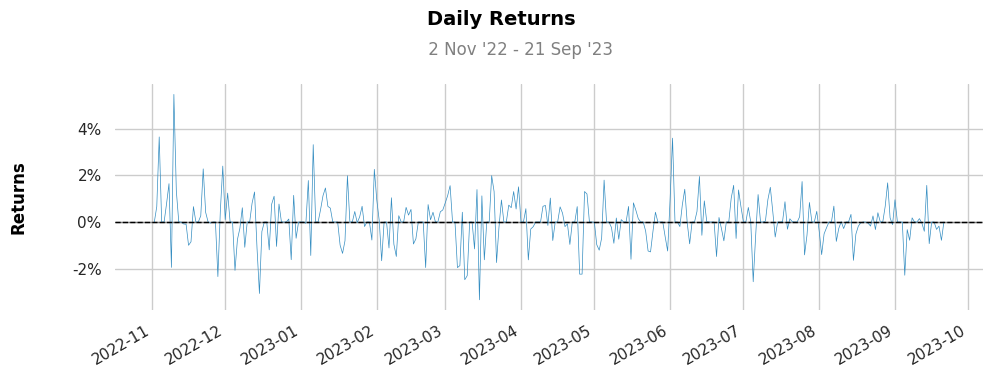

<Figure size 1000x600 with 0 Axes>

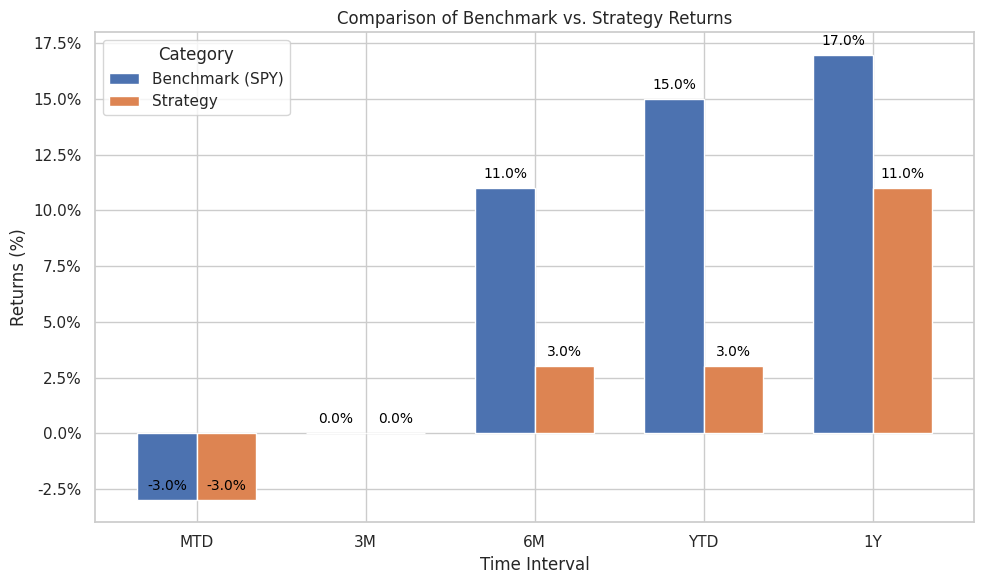

[*********************100%***********************]  1 of 1 completed
[Performance Metrics]

                           Benchmark    Strategy
-------------------------  -----------  ----------
Start Period               2022-11-02   2022-11-02
End Period                 2023-09-21   2023-09-21
Risk-Free Rate             0.0%         0.0%
Time in Market             99.0%        100.0%

Cumulative Return          17.01%       10.87%
CAGR﹪                     13.04%       8.38%

Sharpe                     1.22         0.71
Prob. Sharpe Ratio         87.95%       74.77%
Smart Sharpe               1.21         0.7
Sortino                    1.96         1.06
Smart Sortino              1.94         1.05
Sortino/√2                 1.38         0.75
Smart Sortino/√2           1.37         0.74
Omega                      1.12         1.12

Max Drawdown               -7.61%       -13.28%
Longest DD Days            104          231
Volatility (ann.)          15.63%       19.13%
R^2                

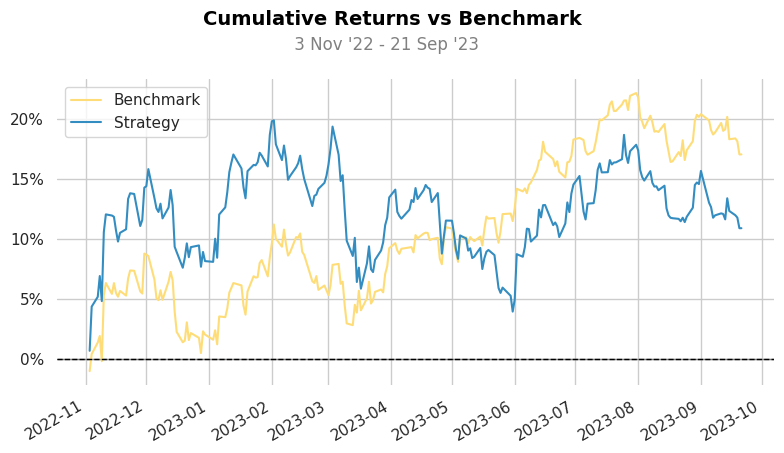

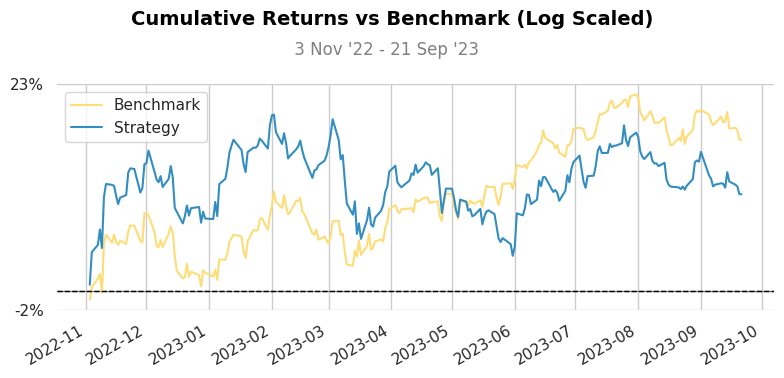

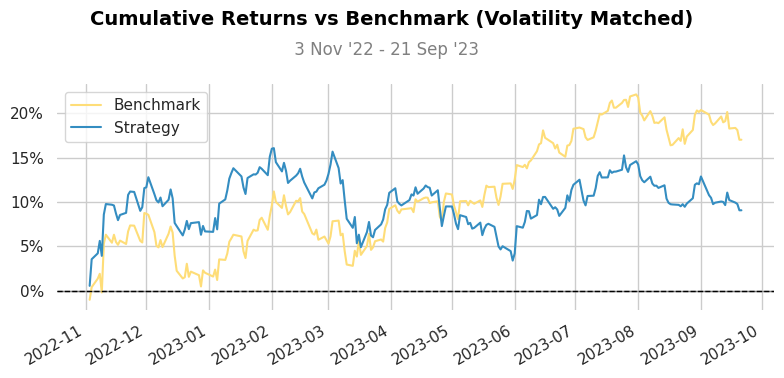

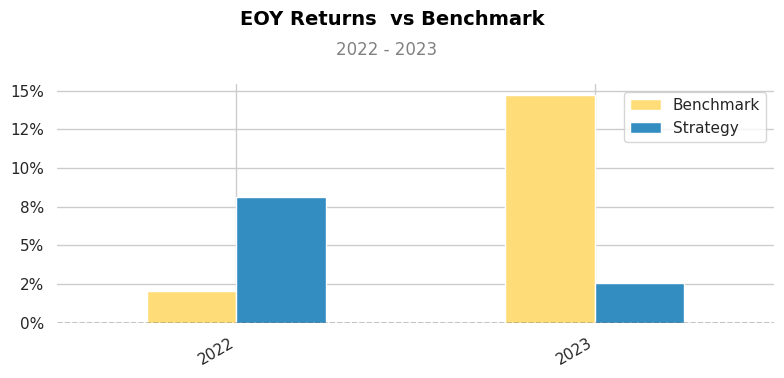

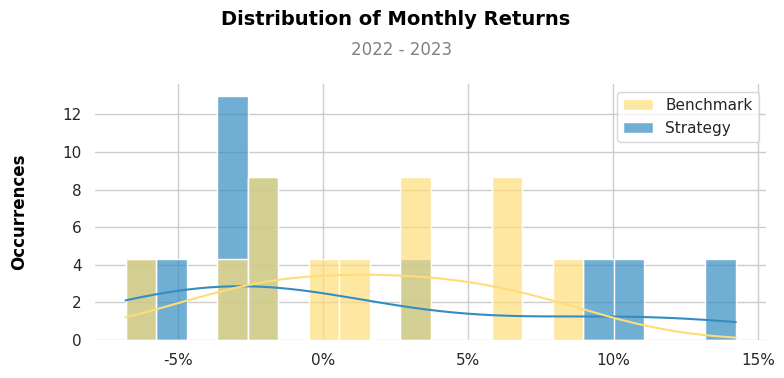

...

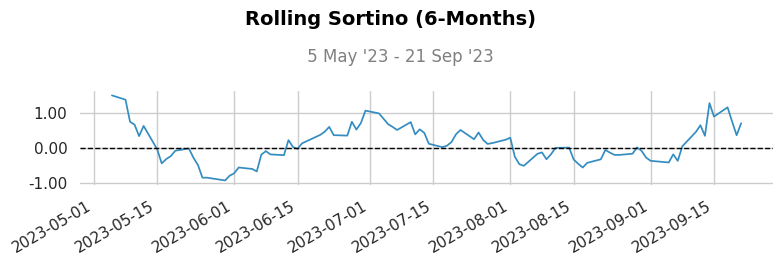

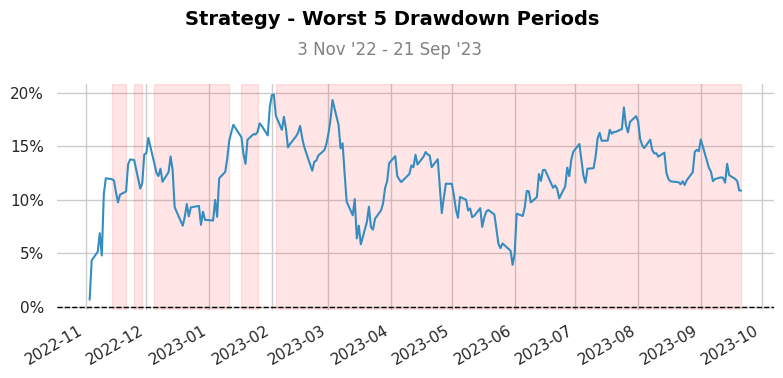

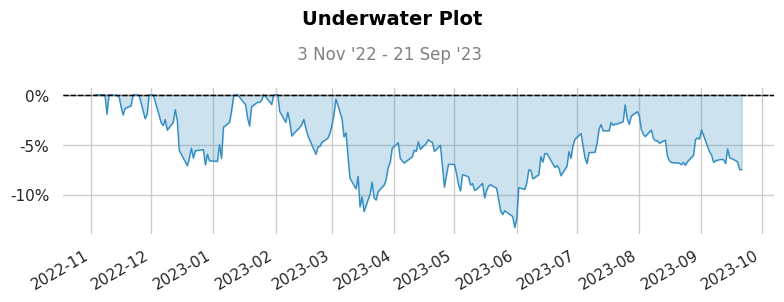

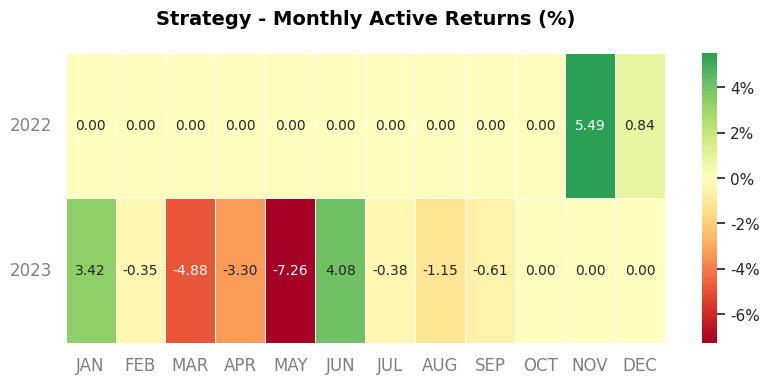

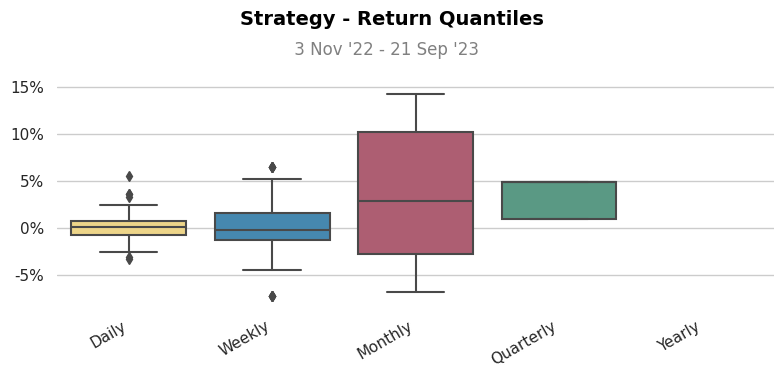

[*********************100%***********************]  1 of 1 completed


Reading Portfolio Transactions from .CSV...
['EOG' 'VDE']
Getting data for EOG...
[*********************100%***********************]  1 of 1 completed
Getting data for VDE...
[*********************100%***********************]  1 of 1 completed
Determining Active Portfolio...
Calculating Daily Position Snapshots...
Generating Sector Performance Plot
Getting data for SPY...
[*********************100%***********************]  1 of 1 completed


Formatting Returns for QuantStats Library & Plotting Individual Sector Returns...
Generating Report...
[*********************100%***********************]  1 of 1 completed


,Benchmark (SPY),Strategy,Statistics
Start Period,2022-12-05,2022-12-05,Start Period
End Period,2023-09-21,2023-09-21,End Period
Risk-Free Rate,0,0,Risk-Free Rate
Time in Market,0.99,0.99,Time in Market
Cumulative Return,0.1,0.07,Cumulative Return
...,...,...,...
Win Year,0.5,1.0,Win Year
Beta,-,0.83,Beta
Alpha,-,0.01,Alpha
Correlation,-,0.47%,Correlation


[*********************100%***********************]  1 of 1 completed


,beta,alpha
Date Snapshot,,
2022-12-05,NaN,NaN
2022-12-06,NaN,NaN
2022-12-07,NaN,NaN
2022-12-08,NaN,NaN
2022-12-09,NaN,NaN
...,...,...
2023-09-15,NaN,NaN
2023-09-18,NaN,NaN
2023-09-19,NaN,NaN


,Rolling Sharpe Ratio
Date Snapshot,
2022-12-05,NaN
2022-12-06,NaN
2022-12-07,NaN
2022-12-08,NaN
2022-12-09,NaN
...,...
2023-09-15,1.892205
2023-09-18,2.095777
2023-09-19,1.806456


,Rolling Volatility
Date Snapshot,
2022-12-05,NaN
2022-12-06,NaN
2022-12-07,NaN
2022-12-08,NaN
2022-12-09,NaN
...,...
2023-09-15,0.227653
2023-09-18,0.226057
2023-09-19,0.224989


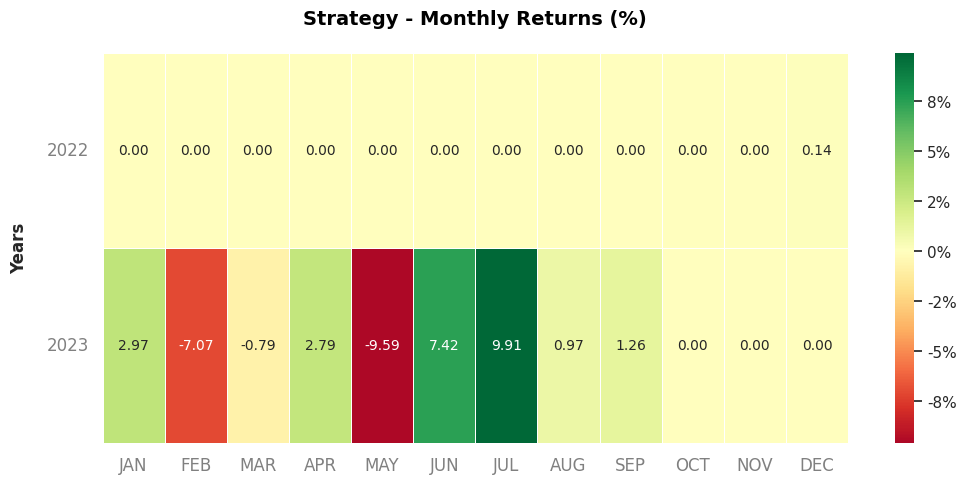

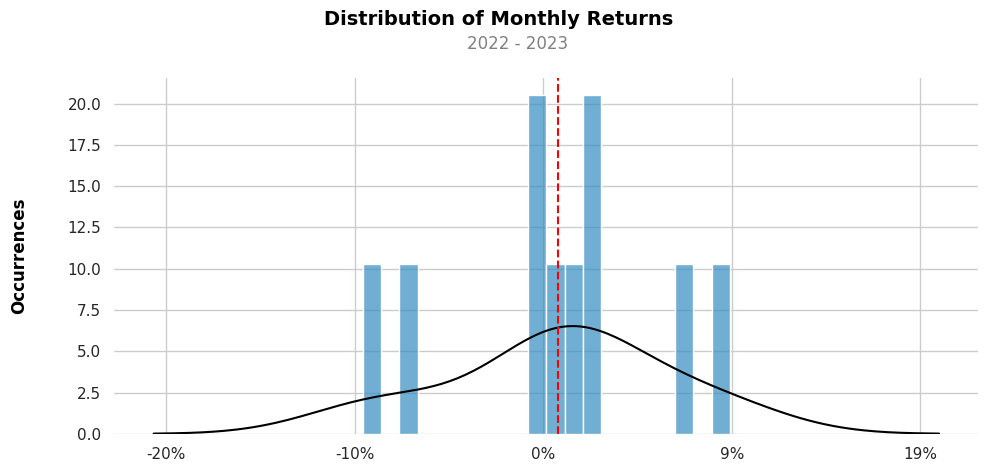

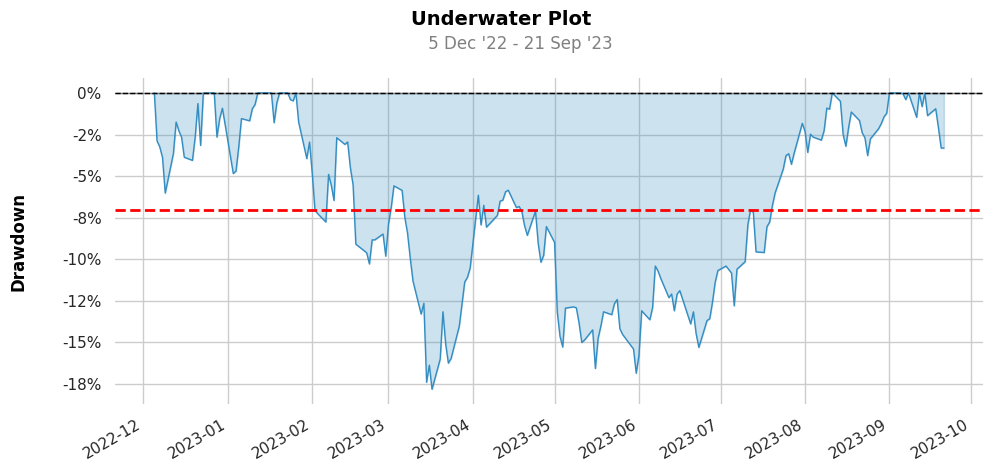

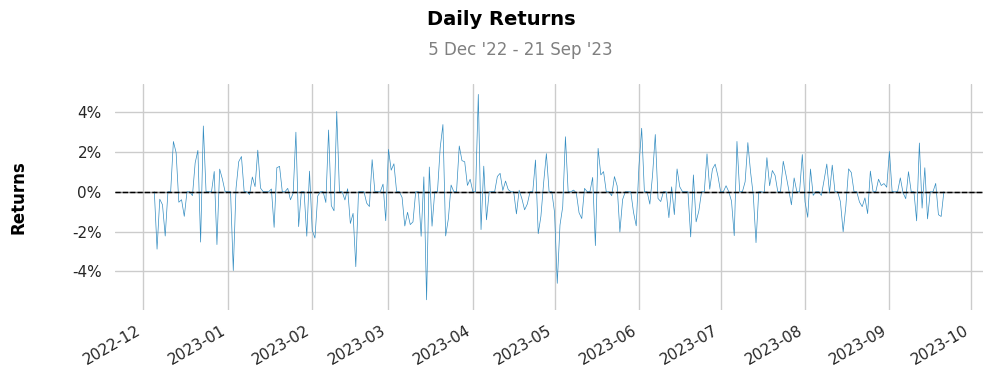

<Figure size 1000x600 with 0 Axes>

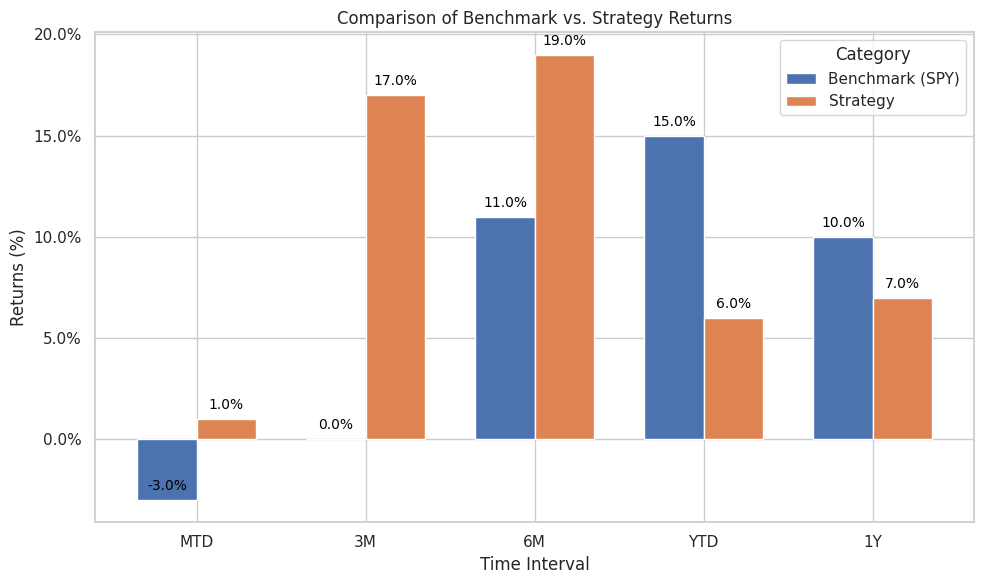

[*********************100%***********************]  1 of 1 completed
[Performance Metrics]

                           Benchmark    Strategy
-------------------------  -----------  ----------
Start Period               2022-12-05   2022-12-05
End Period                 2023-09-21   2023-09-21
Risk-Free Rate             0.0%         0.0%
Time in Market             99.0%        99.0%

Cumulative Return          9.77%        6.64%
CAGR﹪                     8.44%        5.75%

Sharpe                     0.91         0.45
Prob. Sharpe Ratio         79.01%       65.51%
Smart Sharpe               0.88         0.43
Sortino                    1.35         0.64
Smart Sortino              1.3          0.62
Sortino/√2                 0.95         0.45
Smart Sortino/√2           0.92         0.44
Omega                      1.08         1.08

Max Drawdown               -7.54%       -17.81%
Longest DD Days            104          196
Volatility (ann.)          14.01%       24.86%
R^2                 

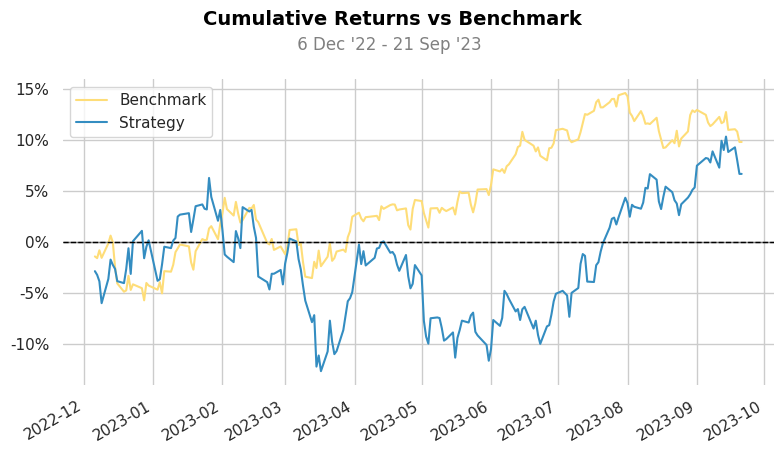

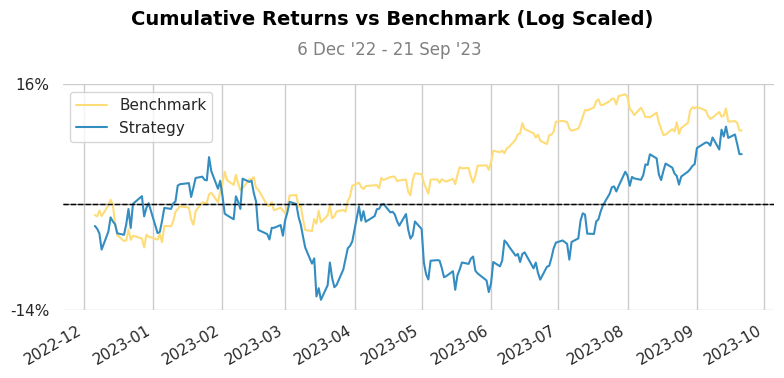

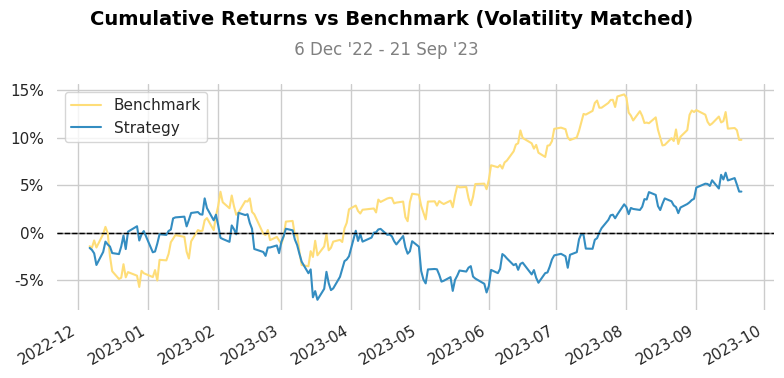

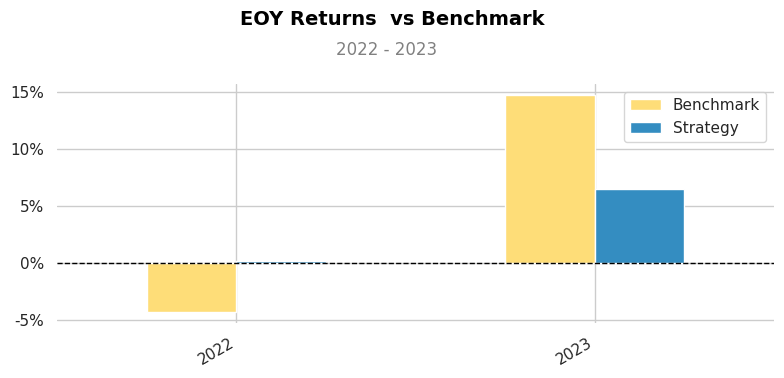

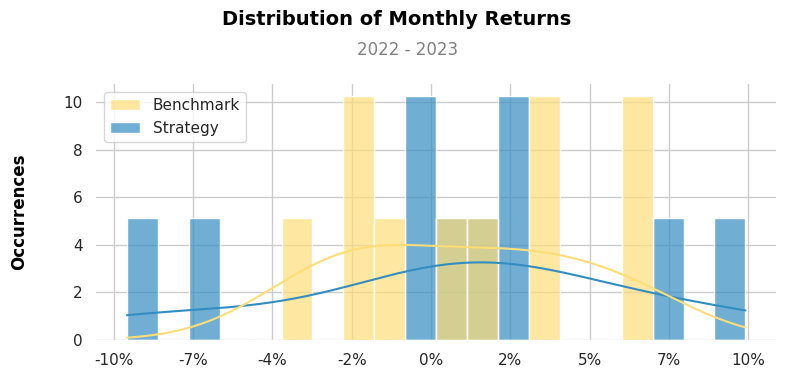

...

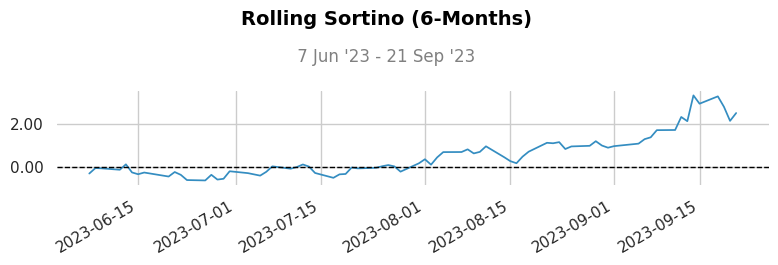

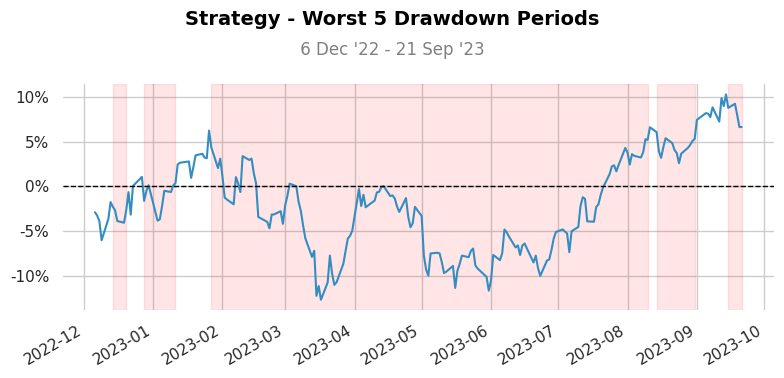

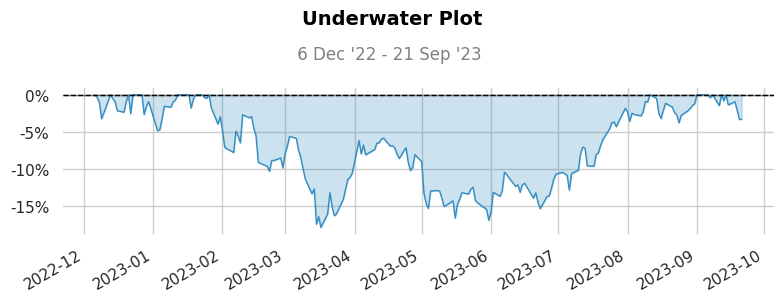

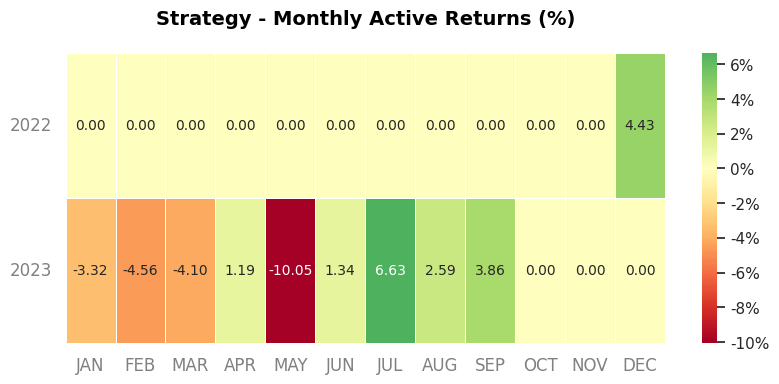

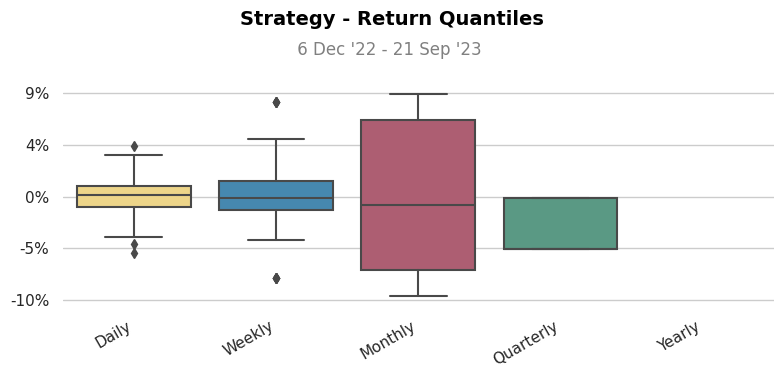

[*********************100%***********************]  1 of 1 completed


In [ ]:
# Make Sector Tearsheets

# Define Sector Dictionary
sectors_dict = {
      'Technology' : ['AAPL','ADBE', 'LRCX', 'MSFT','NVDA', 'VGT','CRM'],
      'Financials & Real Estate' : ['BLK', 'BN', 'SIVBQ', 'VFH','BAM','RLI','VNQ'],
      'Healthcare' : ['ABBV', 'MDT', 'TMO','ELV','VHT','MRK', 'OGN', 'UNH'],
      'Consumer Discretionary' : ['LULU','TJX','VCR'],
      'Communications' : ['DIS', 'META', 'TMUS', 'GOOGL','VOX','ATVI'],
      'Industrials' : ['CAT','J','ROK','UNP','VIS'],
      'Consumer Staples' : ['WMT','VDC'],
      'Utilities' : ['AEP','NEE', 'SRE','UGI','VPU','AES','AWK'],
      'Materials' : ['VAW','SLGN'],
      'Energy' : ['VDE','EOG']
      # 'Real Estate' : ['VNQ']
      # 'Cash' : ['VMFXX']
  }

# Load the transaction data from the CSV file
portfolio_df = read_csv('Tearsheet Generator', 'TransactionHistory2020-2022_withCash')

# Iterate over the sectors in the sectors_dict
for sector, symbols in sectors_dict.items():
    # Filter the transaction data for symbols in the current sector
    sector_data = portfolio_df[portfolio_df['Symbol'].isin(symbols)]

    # Save the filtered data as a new CSV file
    sector_data.to_csv(f'/content/drive/MyDrive/Colab Notebooks/Tearsheet Generator/{sector}_TransactionHistory2020-2022_withCash.csv', index=False)

# Run Generate Report for each Sector
generate_report('Tearsheet Generator', 'Technology_TransactionHistory2020-2022_withCash', '2020-04-30', 'Technology')
generate_report('Tearsheet Generator', 'Financials & Real Estate_TransactionHistory2020-2022_withCash', '2020-04-30', 'Financials & Real Estate')
generate_report('Tearsheet Generator', 'Healthcare_TransactionHistory2020-2022_withCash', '2020-04-30', 'Healthcare')
generate_report('Tearsheet Generator', 'Consumer Discretionary_TransactionHistory2020-2022_withCash', '2020-04-30', 'Consumer Discretionary')
generate_report('Tearsheet Generator', 'Communications_TransactionHistory2020-2022_withCash', '2020-04-30', 'Communications')
generate_report('Tearsheet Generator', 'Industrials_TransactionHistory2020-2022_withCash', '2020-04-30', 'Industrials')
generate_report('Tearsheet Generator', 'Consumer Staples_TransactionHistory2020-2022_withCash', '2020-04-30', 'Consumer Staples')
generate_report('Tearsheet Generator', 'Utilities_TransactionHistory2020-2022_withCash', '2020-04-30', 'Utilities')
generate_report('Tearsheet Generator', 'Materials_TransactionHistory2020-2022_withCash', '2020-04-30', 'Materials')
generate_report('Tearsheet Generator', 'Energy_TransactionHistory2020-2022_withCash', '2020-04-30', 'Energy')